In [ ]:
#-- Descomprimimos el dataset
!rm -r mnist
!unzip mnist.zip

In [10]:
#--- Buscamos las direcciones de cada archivo de imagen
from glob import glob

train_files = glob('./mnist/train/*/*.png')
valid_files = glob('./mnist/valid/*/*.png')
test_files = glob('./mnist/test/*/*.png')


import numpy as np
import matplotlib.pyplot as plt


np.random.shuffle(train_files)
np.random.shuffle(valid_files)
np.random.shuffle(test_files)

len(train_files), len(valid_files), len(test_files)

(6000, 2000, 992)

In [5]:
from PIL import Image

N_train = len(train_files)
X_train = []
Y_train = []

for i, train_file in enumerate(train_files):
  Y_train.append( int(train_file.split('/')[3]) )
  X_train.append(np.array(Image.open(train_file)))

N_valid = len(valid_files)
X_valid = []
Y_valid = []

for i, valid_file in enumerate(valid_files):
  Y_valid.append( int(valid_file.split('/')[3]) )
  X_valid.append( np.array(Image.open(valid_file)) )

N_test = len(test_files)
X_test = []
Y_test = []

for i, test_file in enumerate(test_files):
  Y_test.append( int(test_file.split('/')[3]) )
  X_test.append( np.array(Image.open(test_file)) )

In [6]:
import torch
from torch.autograd import Variable


X_train = Variable(torch.from_numpy(np.array(X_train))).float()
Y_train = Variable(torch.from_numpy(np.array(Y_train))).long()

X_valid = Variable(torch.from_numpy(np.array(X_valid))).float()
Y_valid = Variable(torch.from_numpy(np.array(Y_valid))).long()

X_test = Variable(torch.from_numpy(np.array(X_test))).float()
Y_test = Variable(torch.from_numpy(np.array(Y_test))).long()

X_train.data.size()

torch.Size([6000, 28, 28])

In [7]:
from sklearn.metrics import confusion_matrix

def CM(Y_true, Y_pred, classes):
  fig = plt.figure(figsize=(10, 10))
  cm = confusion_matrix(Y_true, Y_pred)
  lclasses = np.arange(0,classes)
  cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
  cmap=plt.cm.Blues
  ax = fig.add_subplot(1,1,1)
  im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
  ax.figure.colorbar(im, ax=ax, pad=0.01, shrink=0.86)
  ax.set(xticks=np.arange(cm.shape[1]), yticks=np.arange(cm.shape[0]),xticklabels=lclasses, yticklabels=lclasses)
  ax.set_xlabel("Predicted",size=20)
  ax.set_ylabel("True",size=20)
  ax.set_ylim(classes-0.5, -0.5)

  plt.setp(ax.get_xticklabels(), size=12)
  plt.setp(ax.get_yticklabels(), size=12)

  fmt = '.2f'
  thresh = cm.max()/2.
  for i in range(cm.shape[0]):
      for j in range(cm.shape[1]):
          ax.text(j, i, format(cm[i, j], fmt),ha="center", va="center",size=15 , color="white" if cm[i, j] > thresh else "black")

  plt.show()

In [8]:
from sklearn.metrics import f1_score

def train_valid(model, n_epoch, optimizer, criterion):
  loss_train = []
  f1_train = []
  acc_train = []

  loss_valid = []
  f1_valid = []
  acc_valid = []

  for epoch in range(n_epoch):
    model.train()

    Xtr = X_train.view(X_train.size(0), -1)
    Y_pred = model(Xtr)

    loss = criterion(Y_pred,Y_train)
    loss_train.append(loss.item())

    Y_pred = torch.argmax(Y_pred, 1)
    f1_train.append( f1_score(Y_train,Y_pred, average='macro') )
    
    acc = sum(Y_train == Y_pred)/len(Y_pred)
    acc_train.append(acc)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    model.eval()
    Xvl = X_valid.view(X_valid.size(0), -1)
    Y_pred = model(Xvl)  
    loss = criterion(Y_pred,Y_valid)
    loss_valid.append(loss.item())

    Y_pred = torch.argmax(Y_pred, 1)
    f1_valid.append( f1_score(Y_valid, Y_pred, average='macro') )

    acc = sum(Y_valid == Y_pred)/len(Y_pred)
    acc_valid.append(acc)

  print( 'Valid Evaluation loss: {}. f1:{} acc: {} '.format(loss_valid[-1], f1_valid[-1], acc_valid[-1]) )
  CM(Y_valid, Y_pred, 10)

Otros Parámetros y modelo con otra capa


  0%|          | 0/243 [00:00<?, ?it/s]

ne: 50, hd:50, wd:0.001, lr: 0.0001, bs:400 
Valid Evaluation loss: 1.4516597986221313. f1:0.5934539172617664 acc: 0.597000002861023 


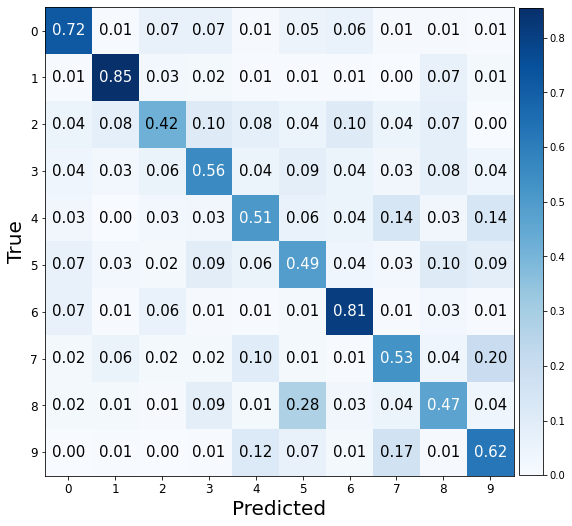

###################

ne: 50, hd:80, wd:0.001, lr: 0.0001, bs:400 
Valid Evaluation loss: 1.3209768533706665. f1:0.6509601099632023 acc: 0.6504999995231628 


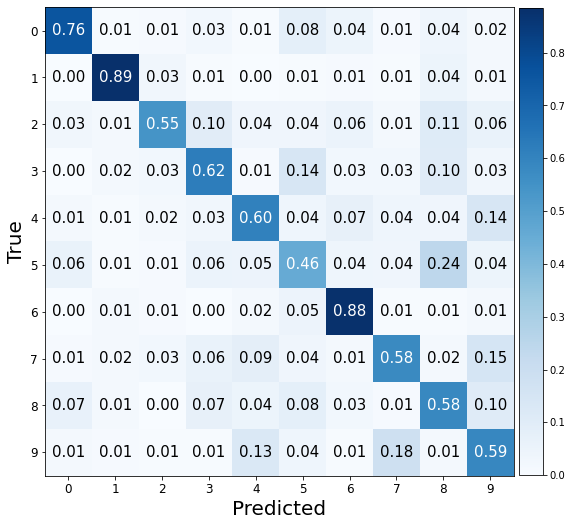

###################

ne: 50, hd:100, wd:0.001, lr: 0.0001, bs:400 
Valid Evaluation loss: 1.0718095302581787. f1:0.7214743561991088 acc: 0.7229999899864197 


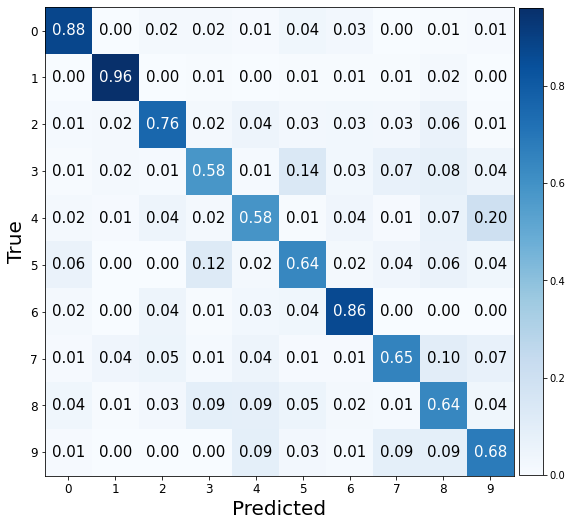

###################

ne: 50, hd:50, wd:0.01, lr: 0.0001, bs:400 
Valid Evaluation loss: 1.603908896446228. f1:0.5808467497439058 acc: 0.5799999833106995 


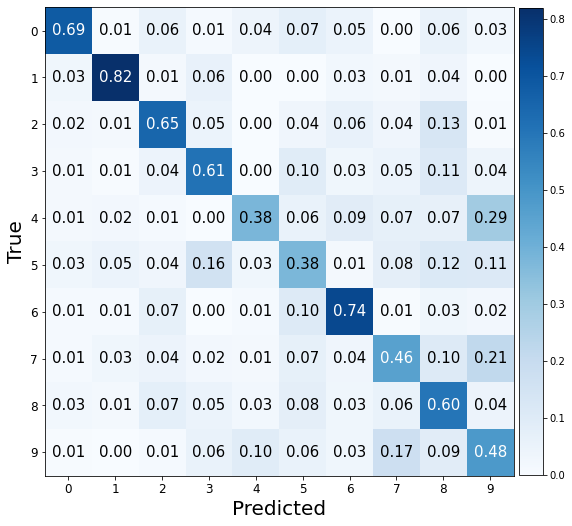

###################

ne: 50, hd:80, wd:0.01, lr: 0.0001, bs:400 
Valid Evaluation loss: 1.3406695127487183. f1:0.6479700061288052 acc: 0.6510000228881836 


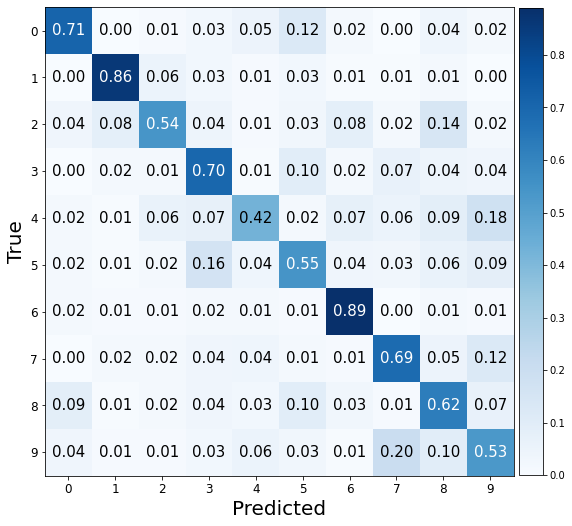

###################

ne: 50, hd:100, wd:0.01, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.9969553351402283. f1:0.7372638236071767 acc: 0.7384999990463257 


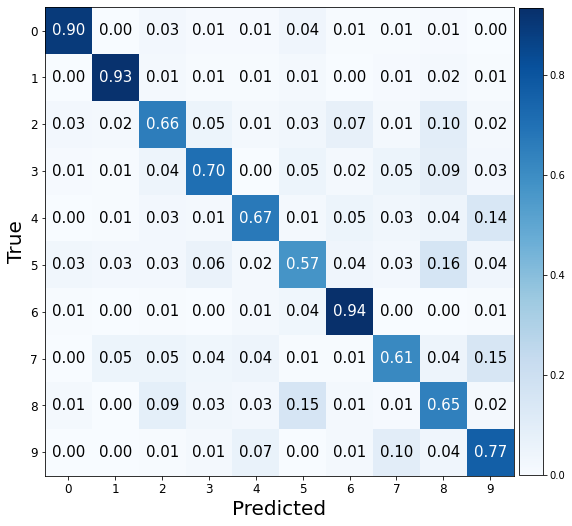

###################

ne: 50, hd:50, wd:0.1, lr: 0.0001, bs:400 
Valid Evaluation loss: 1.7911425828933716. f1:0.46299869257486465 acc: 0.4645000100135803 


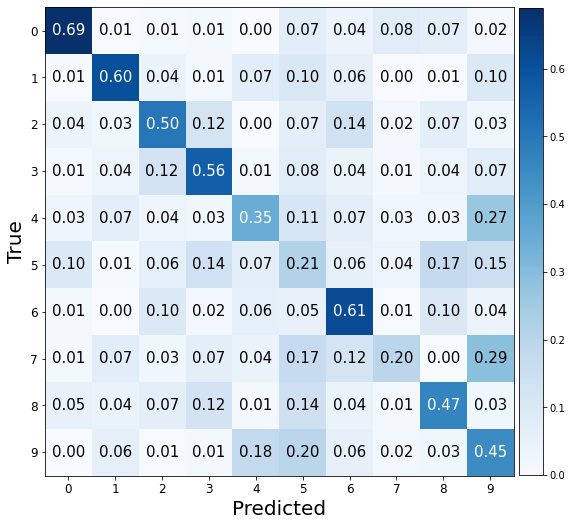

###################

ne: 50, hd:80, wd:0.1, lr: 0.0001, bs:400 
Valid Evaluation loss: 1.6779779195785522. f1:0.5465597410371296 acc: 0.5525000095367432 


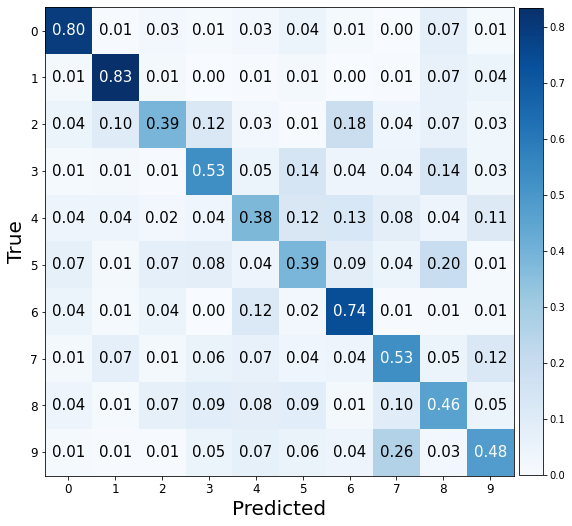

###################

ne: 50, hd:100, wd:0.1, lr: 0.0001, bs:400 
Valid Evaluation loss: 1.0733404159545898. f1:0.7170583101811409 acc: 0.715499997138977 


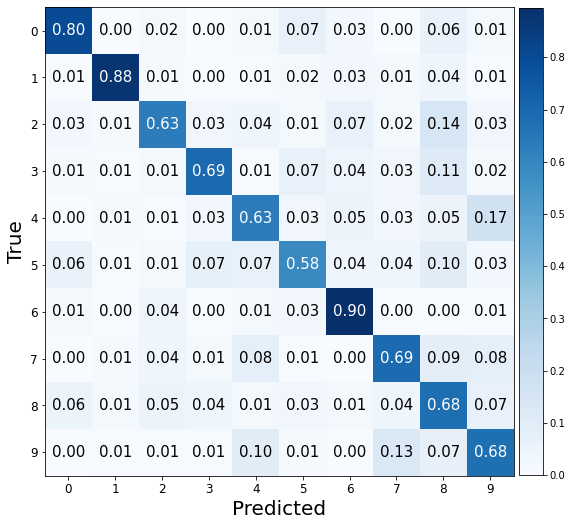

###################

ne: 50, hd:50, wd:0.001, lr: 0.001, bs:400 
Valid Evaluation loss: 0.45873862504959106. f1:0.8691964914013426 acc: 0.8694999814033508 


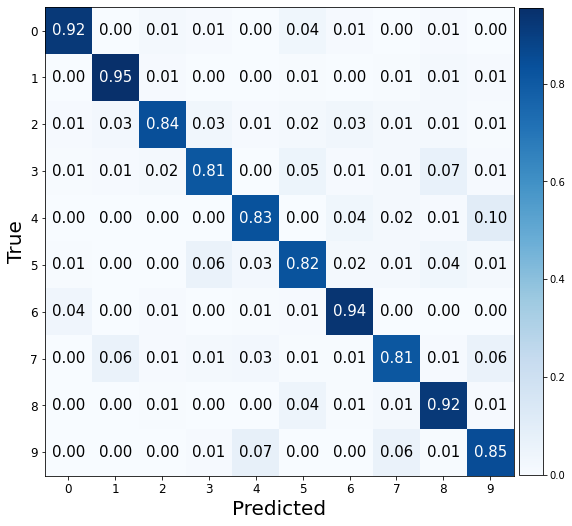

###################

ne: 50, hd:80, wd:0.001, lr: 0.001, bs:400 
Valid Evaluation loss: 0.44501030445098877. f1:0.870928990636245 acc: 0.8709999918937683 


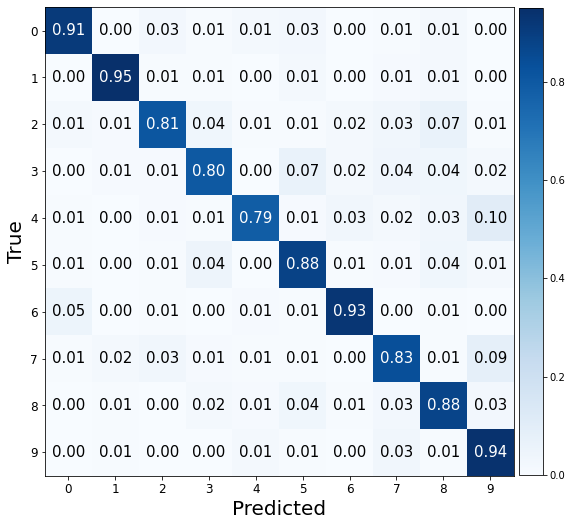

###################

ne: 50, hd:100, wd:0.001, lr: 0.001, bs:400 
Valid Evaluation loss: 0.42698463797569275. f1:0.8806224627208433 acc: 0.8809999823570251 


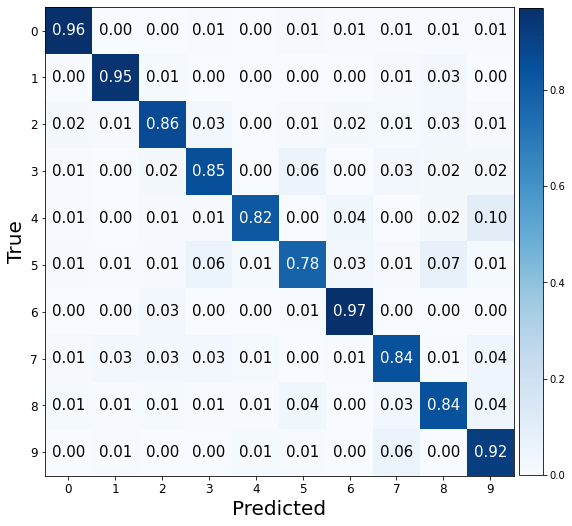

###################

ne: 50, hd:50, wd:0.01, lr: 0.001, bs:400 
Valid Evaluation loss: 0.48941516876220703. f1:0.8594707806550772 acc: 0.8600000143051147 


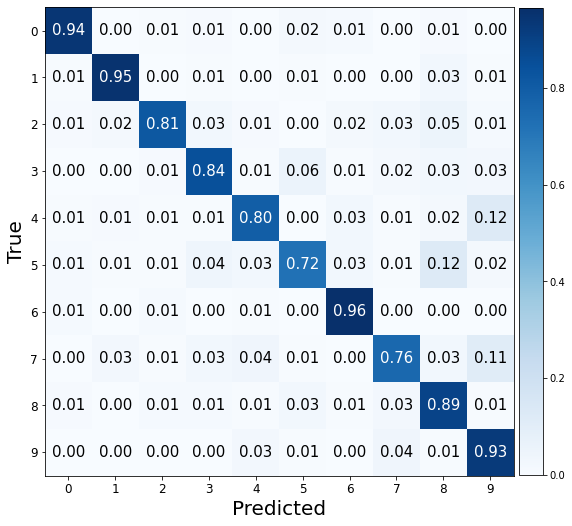

###################

ne: 50, hd:80, wd:0.01, lr: 0.001, bs:400 
Valid Evaluation loss: 0.469370037317276. f1:0.8619283842911276 acc: 0.8619999885559082 


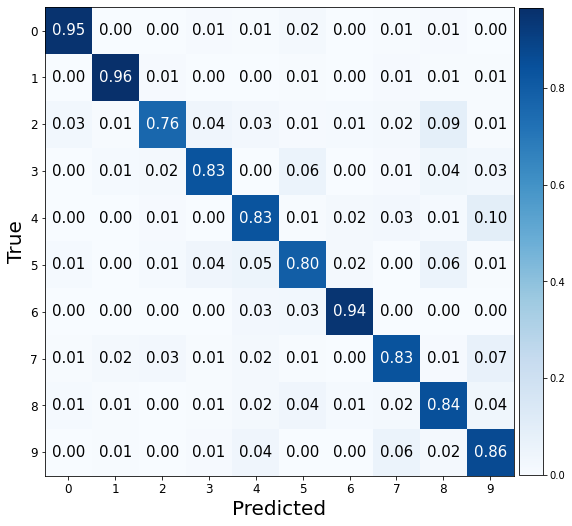

###################

ne: 50, hd:100, wd:0.01, lr: 0.001, bs:400 
Valid Evaluation loss: 0.3913349509239197. f1:0.8866121890782045 acc: 0.8865000009536743 


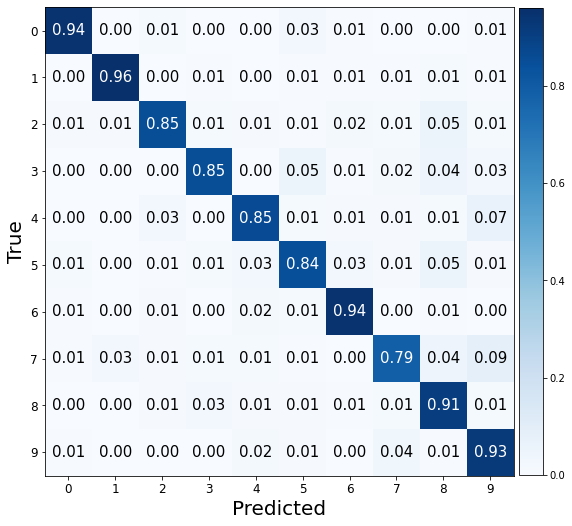

###################

ne: 50, hd:50, wd:0.1, lr: 0.001, bs:400 
Valid Evaluation loss: 0.3669823110103607. f1:0.8931413929311048 acc: 0.8934999704360962 


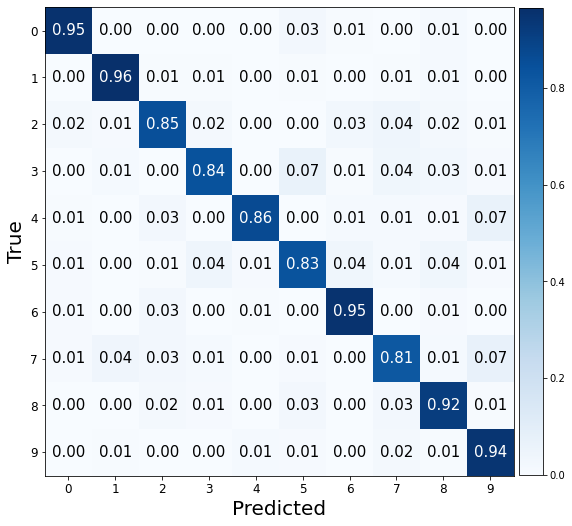

###################

ne: 50, hd:80, wd:0.1, lr: 0.001, bs:400 
Valid Evaluation loss: 0.40878114104270935. f1:0.8857818984990098 acc: 0.8855000138282776 


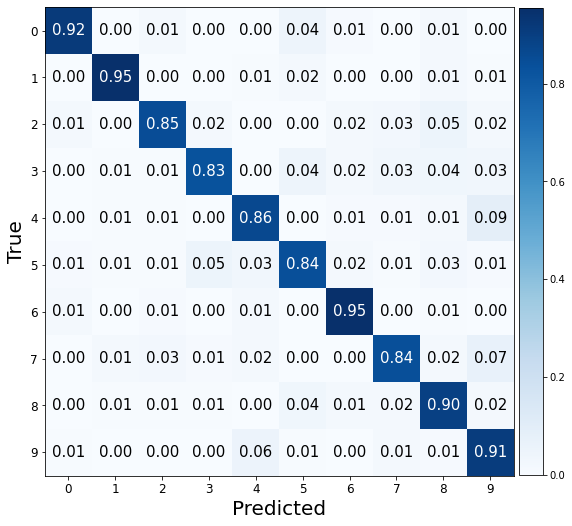

###################

ne: 50, hd:100, wd:0.1, lr: 0.001, bs:400 
Valid Evaluation loss: 0.39779871702194214. f1:0.8752661974107614 acc: 0.875 


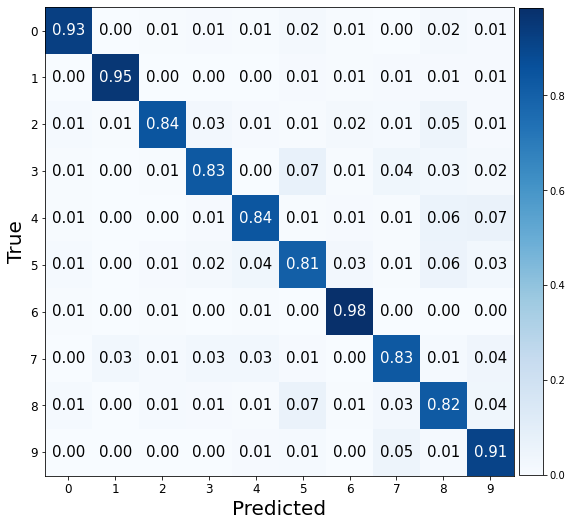

###################

ne: 50, hd:50, wd:0.001, lr: 0.01, bs:400 
Valid Evaluation loss: 1.1634020805358887. f1:0.6283396610772792 acc: 0.6255000233650208 


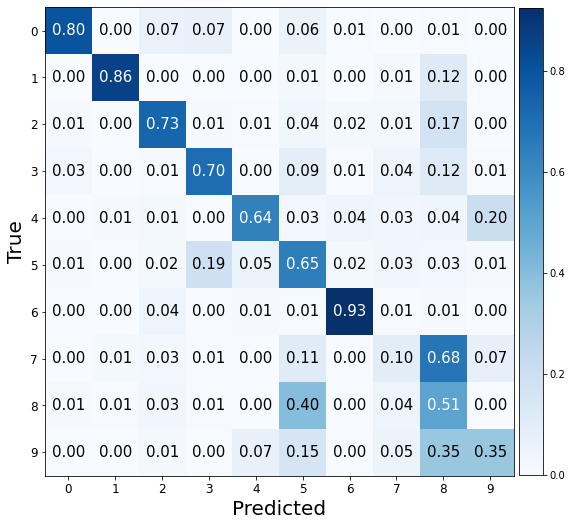

###################

ne: 50, hd:80, wd:0.001, lr: 0.01, bs:400 
Valid Evaluation loss: 0.9360600113868713. f1:0.6715082214073409 acc: 0.6875 


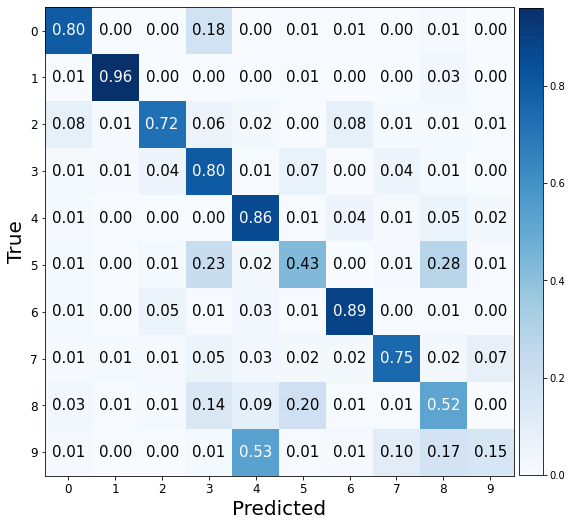

###################

ne: 50, hd:100, wd:0.001, lr: 0.01, bs:400 
Valid Evaluation loss: 1.3199387788772583. f1:0.5475359741548101 acc: 0.5665000081062317 


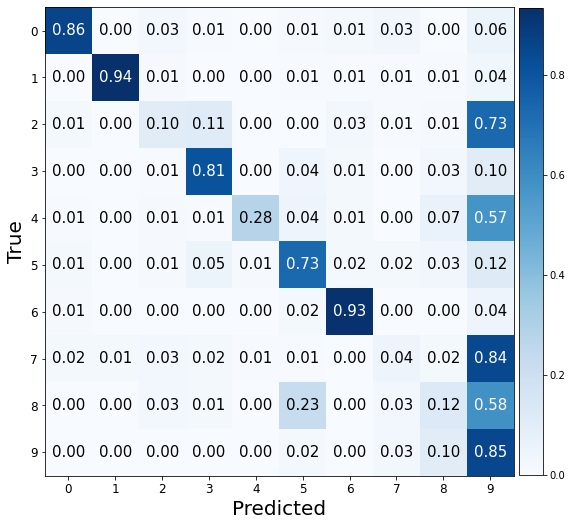

###################

ne: 50, hd:50, wd:0.01, lr: 0.01, bs:400 
Valid Evaluation loss: 0.9172167778015137. f1:0.7294984918810278 acc: 0.7315000295639038 


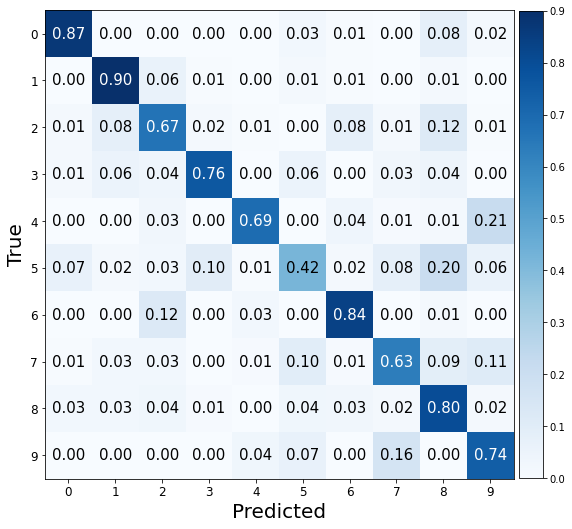

###################

ne: 50, hd:80, wd:0.01, lr: 0.01, bs:400 
Valid Evaluation loss: 1.786238670349121. f1:0.3744096584201463 acc: 0.3970000147819519 


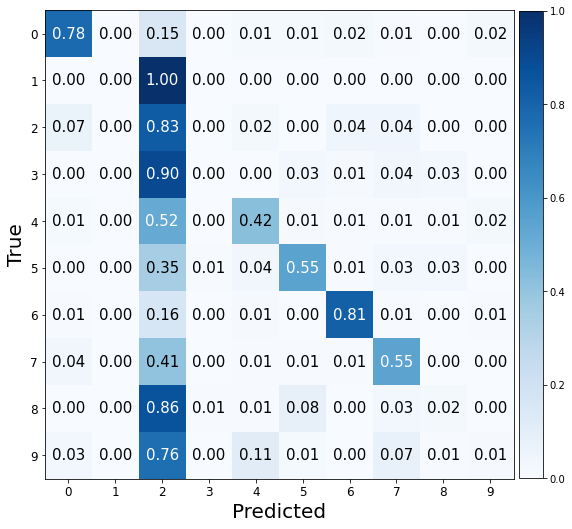

###################

ne: 50, hd:100, wd:0.01, lr: 0.01, bs:400 
Valid Evaluation loss: 0.6970665454864502. f1:0.7982332483793732 acc: 0.7979999780654907 


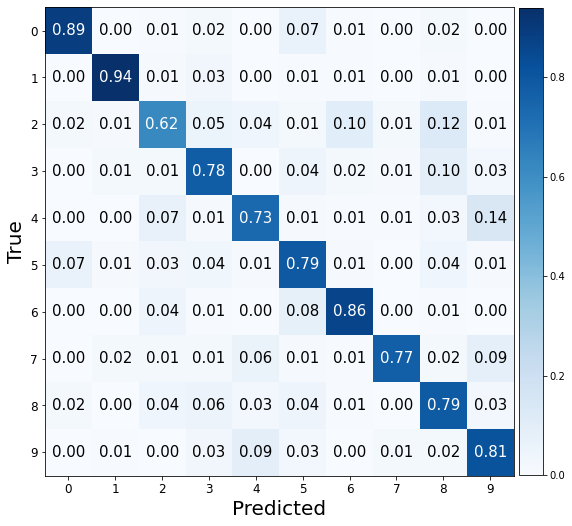

###################

ne: 50, hd:50, wd:0.1, lr: 0.01, bs:400 
Valid Evaluation loss: 1.073490858078003. f1:0.6289179050345554 acc: 0.652999997138977 


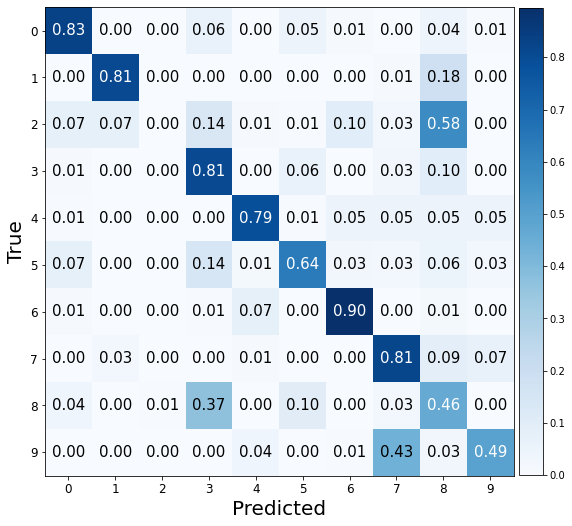

###################

ne: 50, hd:80, wd:0.1, lr: 0.01, bs:400 
Valid Evaluation loss: 0.9271711111068726. f1:0.6819973668027497 acc: 0.703000009059906 


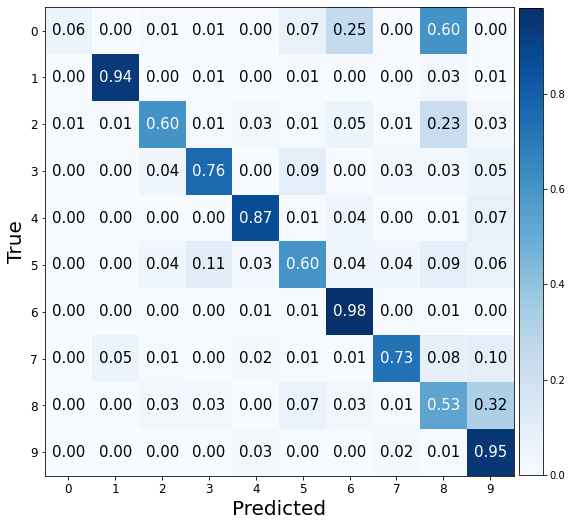

###################

ne: 50, hd:100, wd:0.1, lr: 0.01, bs:400 
Valid Evaluation loss: 0.5822498202323914. f1:0.8330284273788813 acc: 0.8320000171661377 


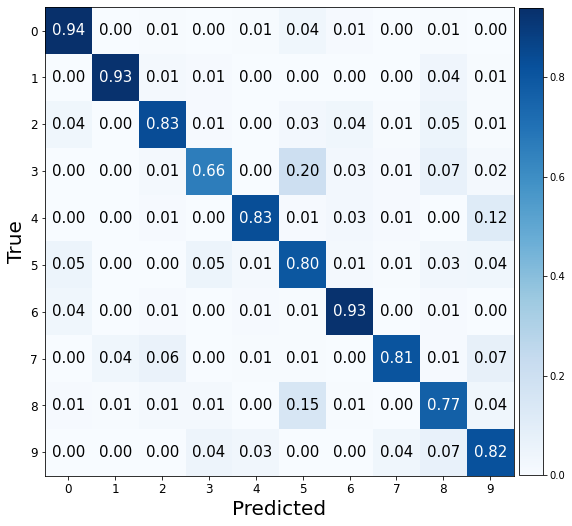

###################

ne: 50, hd:50, wd:0.001, lr: 0.0001, bs:720 
Valid Evaluation loss: 1.6941235065460205. f1:0.5246163585431434 acc: 0.5249999761581421 


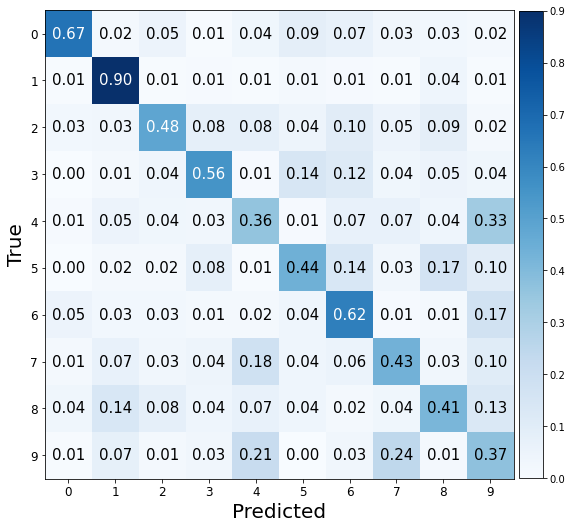

###################

ne: 50, hd:80, wd:0.001, lr: 0.0001, bs:720 
Valid Evaluation loss: 1.3021105527877808. f1:0.6351487000463245 acc: 0.6384999752044678 


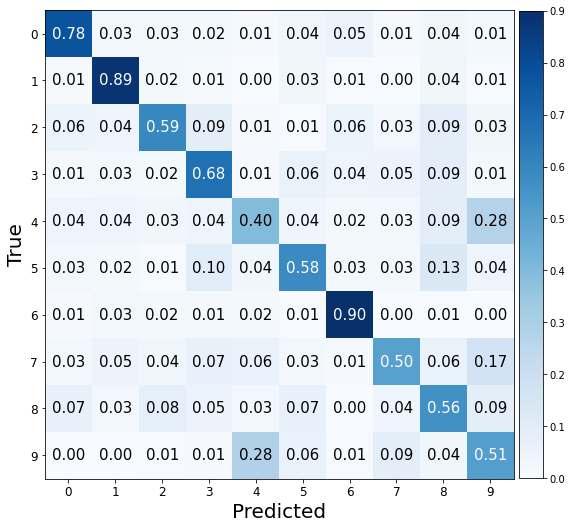

###################

ne: 50, hd:100, wd:0.001, lr: 0.0001, bs:720 
Valid Evaluation loss: 1.2469091415405273. f1:0.6914717268164169 acc: 0.6880000233650208 


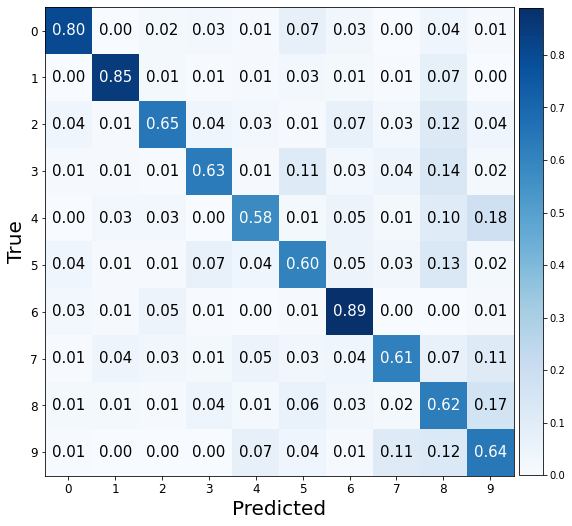

###################

ne: 50, hd:50, wd:0.01, lr: 0.0001, bs:720 
Valid Evaluation loss: 1.5384949445724487. f1:0.5326273405644403 acc: 0.5385000109672546 


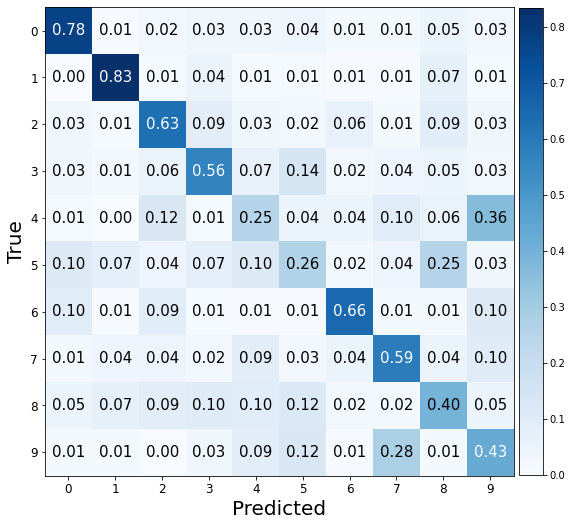

###################

ne: 50, hd:80, wd:0.01, lr: 0.0001, bs:720 
Valid Evaluation loss: 1.5478476285934448. f1:0.5957743090003409 acc: 0.6014999747276306 


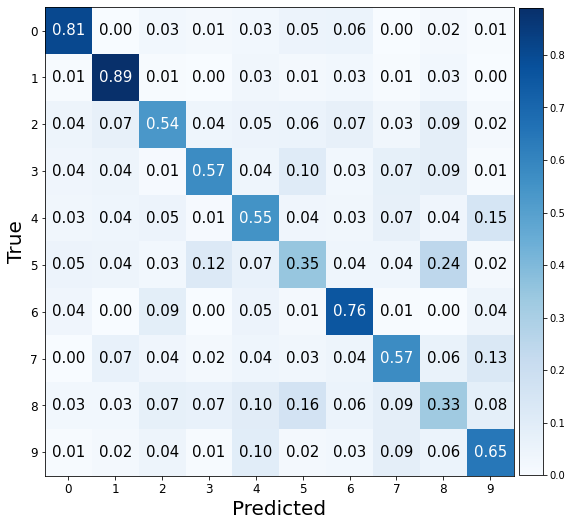

###################

ne: 50, hd:100, wd:0.01, lr: 0.0001, bs:720 
Valid Evaluation loss: 1.1678082942962646. f1:0.6847898684201927 acc: 0.6894999742507935 


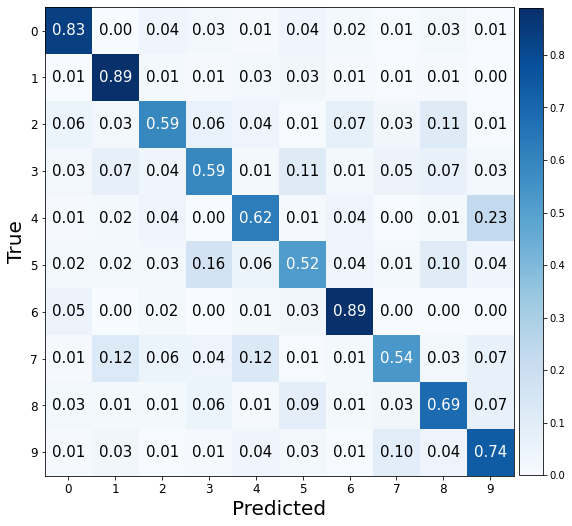

###################

ne: 50, hd:50, wd:0.1, lr: 0.0001, bs:720 
Valid Evaluation loss: 1.5517390966415405. f1:0.5290207728056571 acc: 0.5264999866485596 


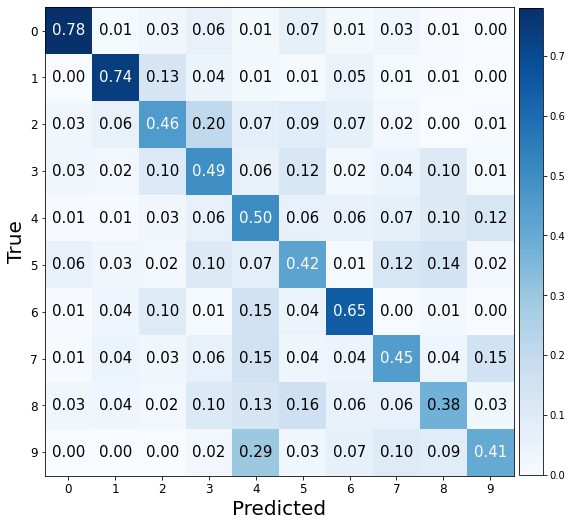

###################

ne: 50, hd:80, wd:0.1, lr: 0.0001, bs:720 
Valid Evaluation loss: 1.3200509548187256. f1:0.6658530206224383 acc: 0.6664999723434448 


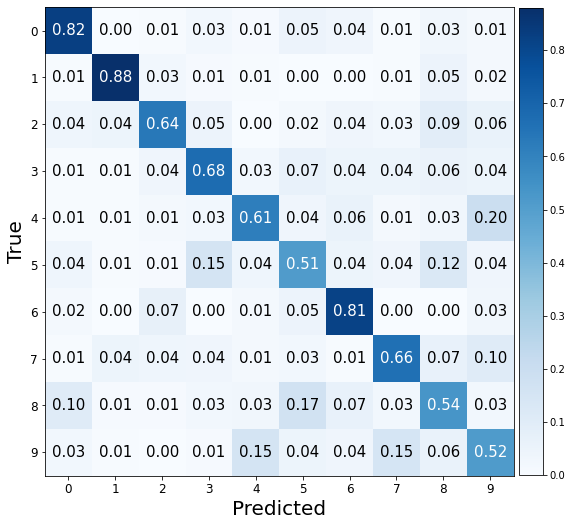

###################

ne: 50, hd:100, wd:0.1, lr: 0.0001, bs:720 
Valid Evaluation loss: 1.1363556385040283. f1:0.6788285543865599 acc: 0.6779999732971191 


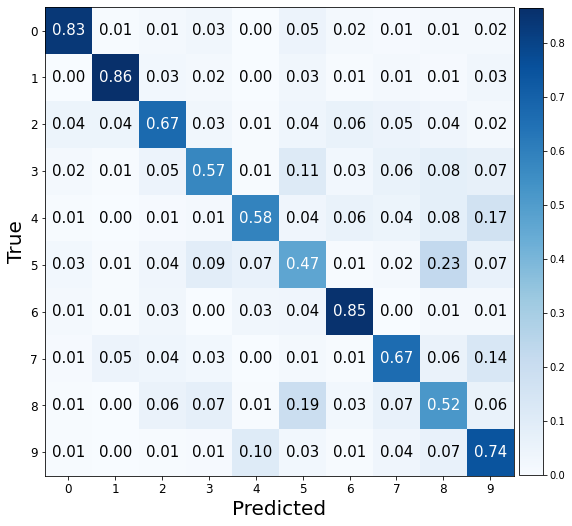

###################

ne: 50, hd:50, wd:0.001, lr: 0.001, bs:720 
Valid Evaluation loss: 0.4328199625015259. f1:0.8722685146199577 acc: 0.871999979019165 


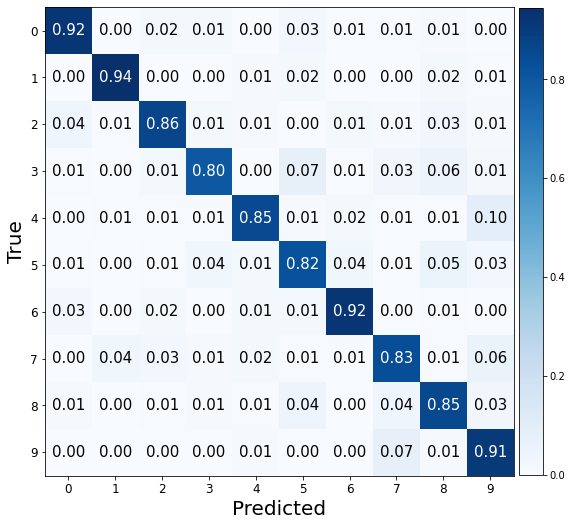

###################

ne: 50, hd:80, wd:0.001, lr: 0.001, bs:720 
Valid Evaluation loss: 0.4076915681362152. f1:0.8890452106645277 acc: 0.8889999985694885 


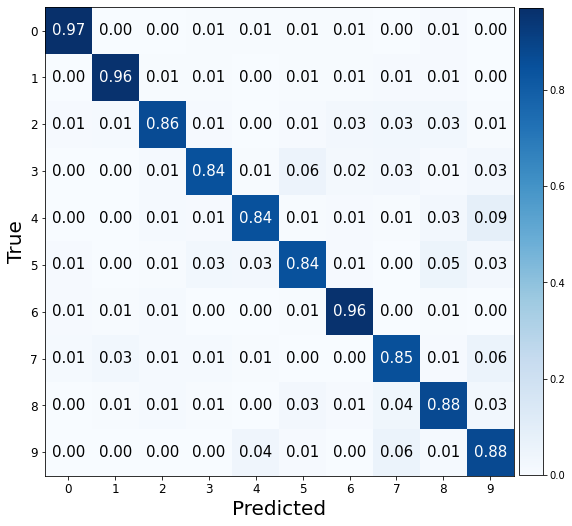

###################

ne: 50, hd:100, wd:0.001, lr: 0.001, bs:720 
Valid Evaluation loss: 0.3249913454055786. f1:0.899237065667978 acc: 0.8995000123977661 


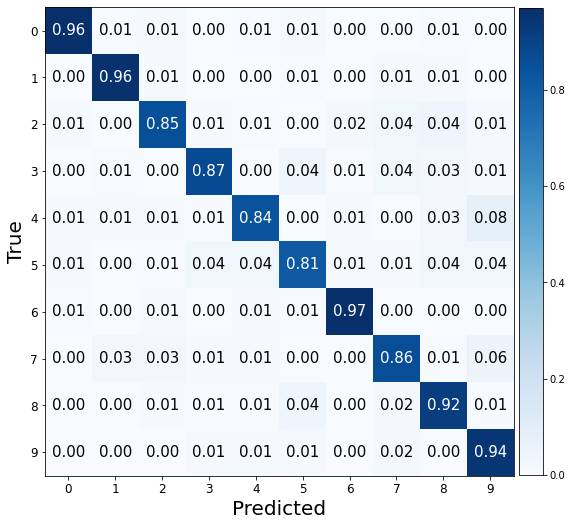

###################

ne: 50, hd:50, wd:0.01, lr: 0.001, bs:720 
Valid Evaluation loss: 0.43693792819976807. f1:0.8702859049467498 acc: 0.8705000281333923 


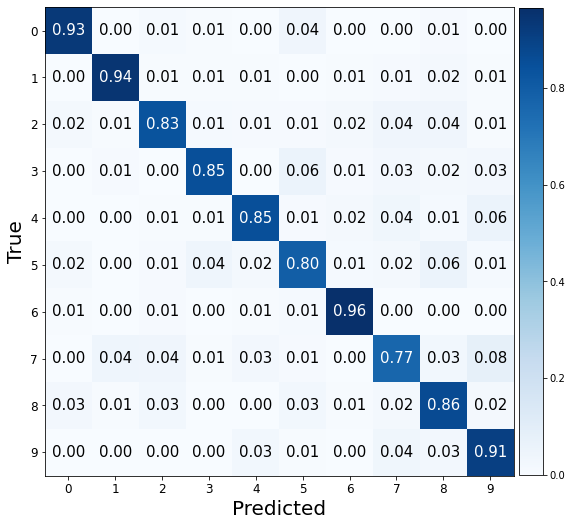

###################

ne: 50, hd:80, wd:0.01, lr: 0.001, bs:720 
Valid Evaluation loss: 0.42549821734428406. f1:0.8810571870140432 acc: 0.8809999823570251 


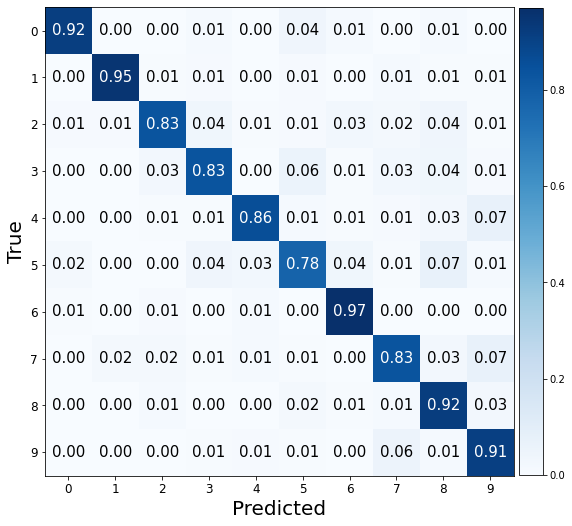

###################

ne: 50, hd:100, wd:0.01, lr: 0.001, bs:720 
Valid Evaluation loss: 0.4346097409725189. f1:0.8827053116072408 acc: 0.8830000162124634 


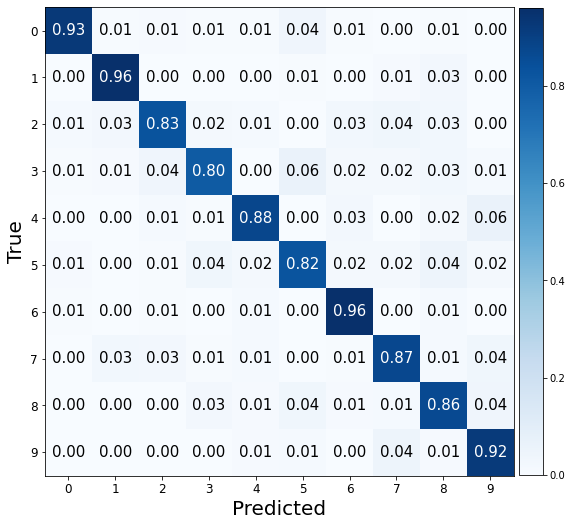

###################

ne: 50, hd:50, wd:0.1, lr: 0.001, bs:720 
Valid Evaluation loss: 0.68217933177948. f1:0.7880026045361864 acc: 0.7885000109672546 


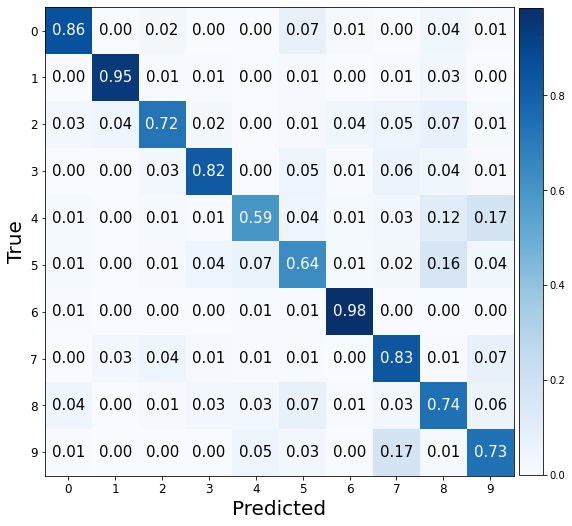

###################

ne: 50, hd:80, wd:0.1, lr: 0.001, bs:720 
Valid Evaluation loss: 0.36893895268440247. f1:0.8870563988373197 acc: 0.8870000243186951 


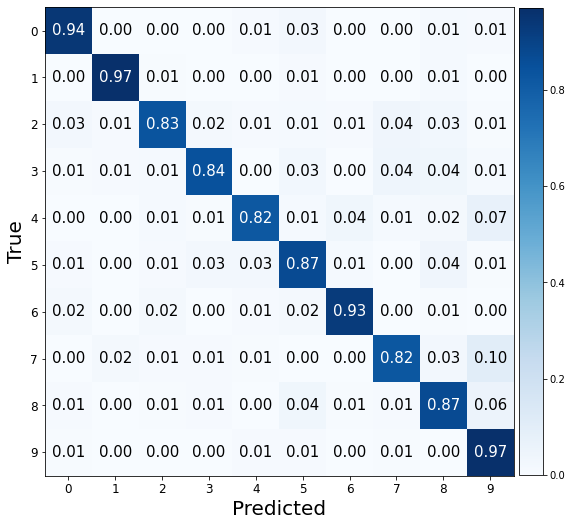

###################

ne: 50, hd:100, wd:0.1, lr: 0.001, bs:720 
Valid Evaluation loss: 0.40866050124168396. f1:0.876449748290888 acc: 0.8759999871253967 


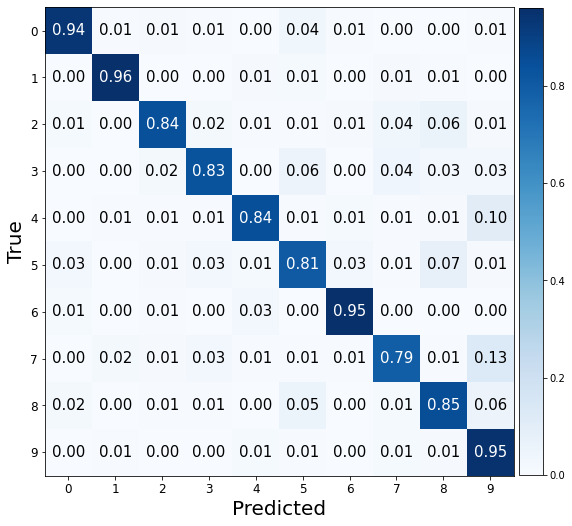

###################

ne: 50, hd:50, wd:0.001, lr: 0.01, bs:720 
Valid Evaluation loss: 1.4332841634750366. f1:0.5239062975563731 acc: 0.5899999737739563 


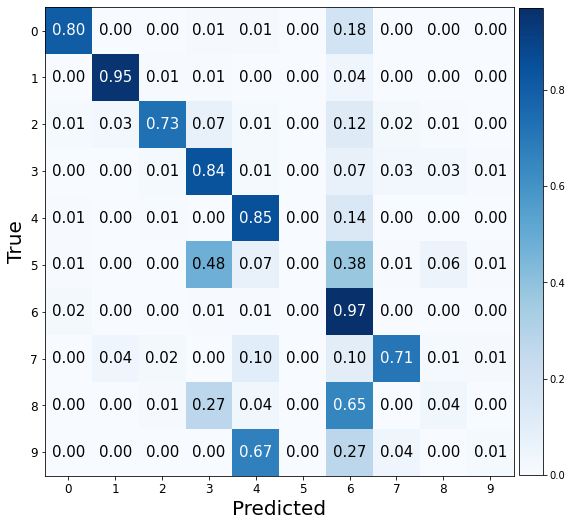

###################

ne: 50, hd:80, wd:0.001, lr: 0.01, bs:720 
Valid Evaluation loss: 0.8704673647880554. f1:0.7662763514789117 acc: 0.7615000009536743 


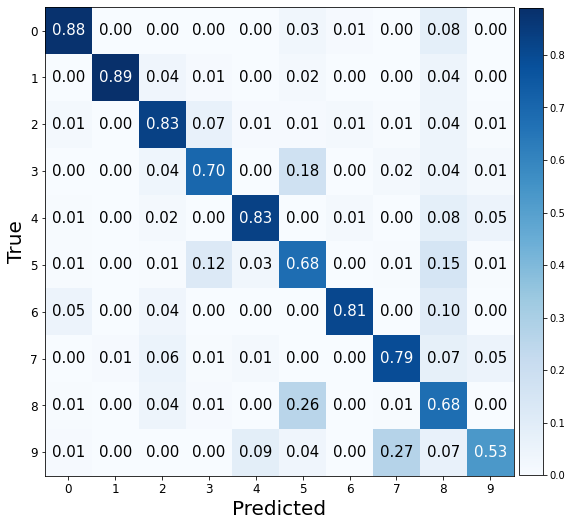

###################

ne: 50, hd:100, wd:0.001, lr: 0.01, bs:720 
Valid Evaluation loss: 0.8533766865730286. f1:0.7395095877842293 acc: 0.734499990940094 


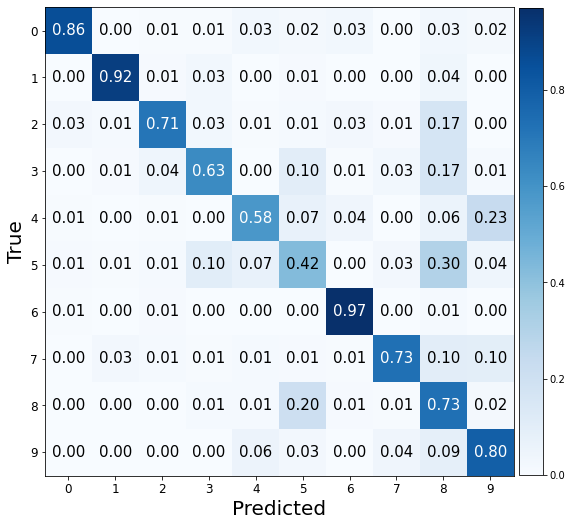

###################

ne: 50, hd:50, wd:0.01, lr: 0.01, bs:720 
Valid Evaluation loss: 0.9677056074142456. f1:0.6817816048139763 acc: 0.6965000033378601 


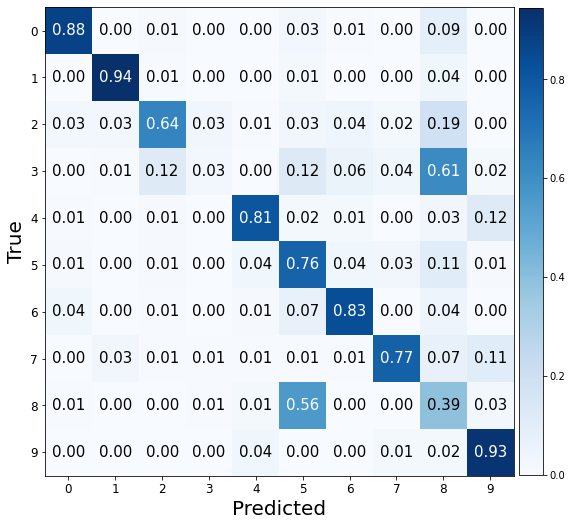

###################

ne: 50, hd:80, wd:0.01, lr: 0.01, bs:720 
Valid Evaluation loss: 0.6425124406814575. f1:0.8356702272362803 acc: 0.8349999785423279 


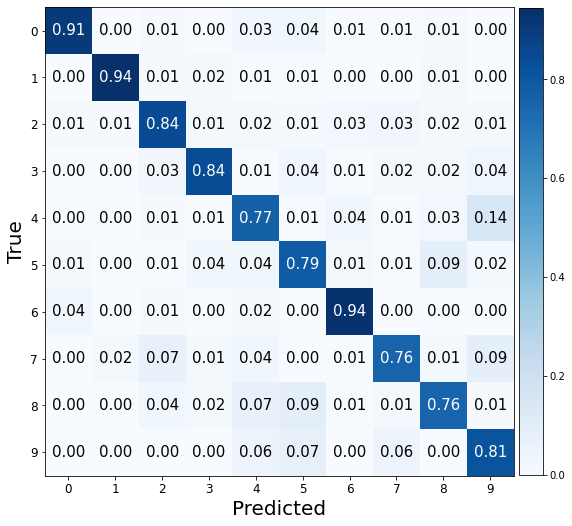

###################

ne: 50, hd:100, wd:0.01, lr: 0.01, bs:720 
Valid Evaluation loss: 1.781622290611267. f1:0.26865573138307125 acc: 0.32499998807907104 


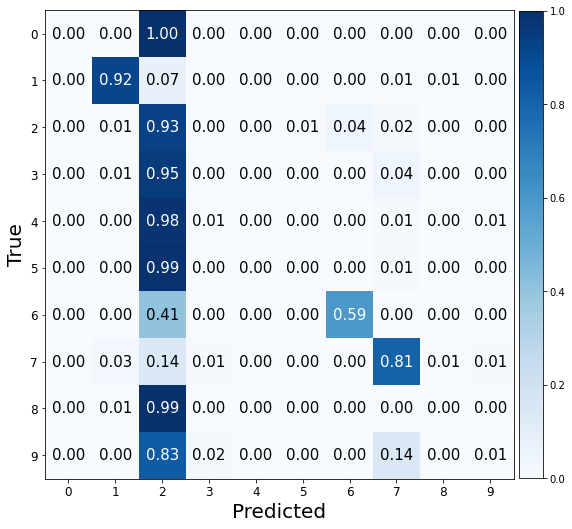

###################

ne: 50, hd:50, wd:0.1, lr: 0.01, bs:720 
Valid Evaluation loss: 0.8280352354049683. f1:0.7337950663359122 acc: 0.7649999856948853 


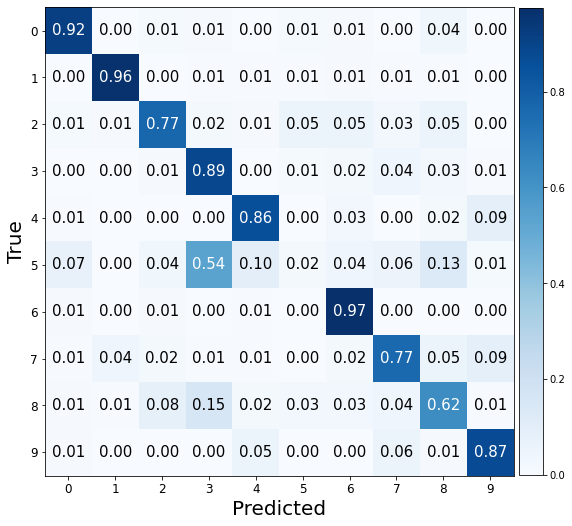

###################

ne: 50, hd:80, wd:0.1, lr: 0.01, bs:720 
Valid Evaluation loss: 0.6492776274681091. f1:0.8082629786693387 acc: 0.8109999895095825 


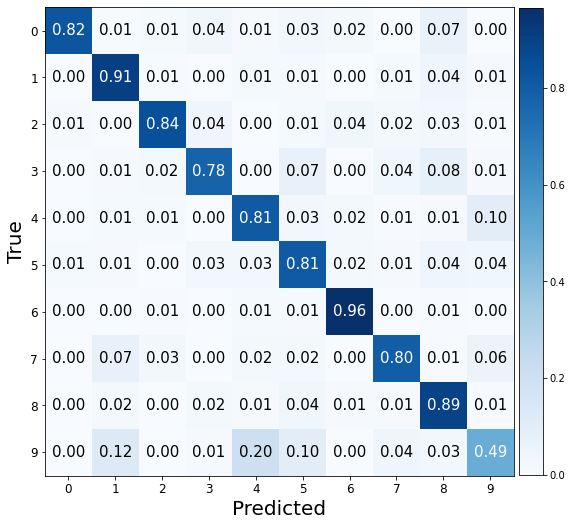

###################

ne: 50, hd:100, wd:0.1, lr: 0.01, bs:720 
Valid Evaluation loss: 0.6473008394241333. f1:0.788532033340195 acc: 0.7894999980926514 


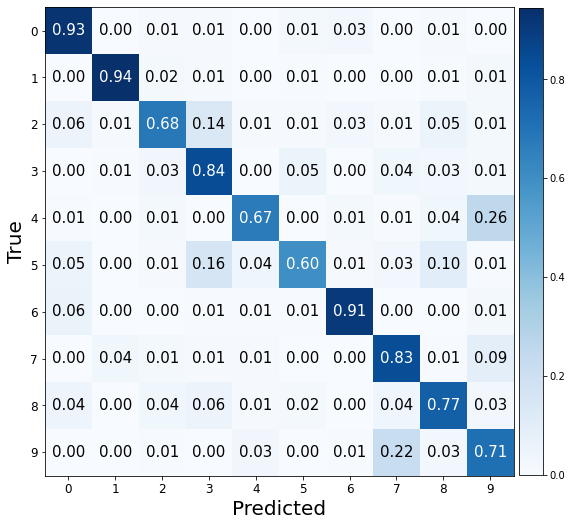

###################

ne: 50, hd:50, wd:0.001, lr: 0.0001, bs:1024 
Valid Evaluation loss: 1.6515145301818848. f1:0.5427479241393975 acc: 0.5485000014305115 


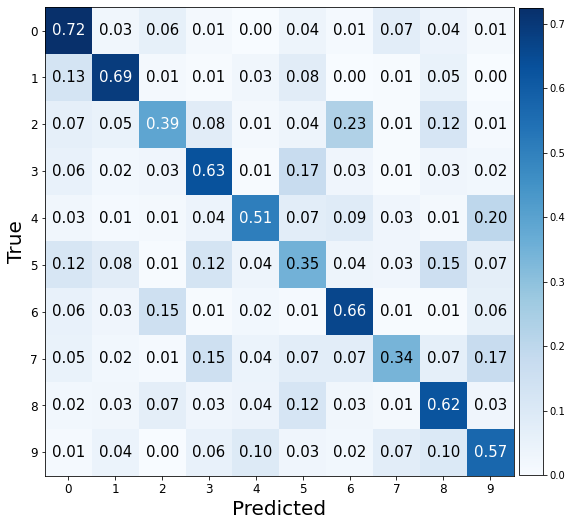

###################

ne: 50, hd:80, wd:0.001, lr: 0.0001, bs:1024 
Valid Evaluation loss: 1.3247209787368774. f1:0.6310671641804959 acc: 0.6334999799728394 


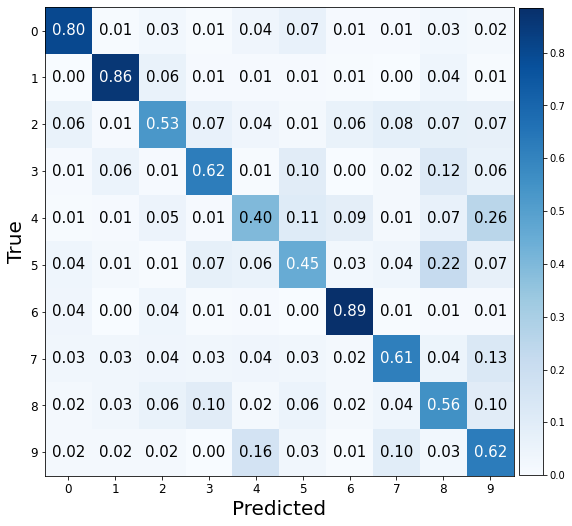

###################

ne: 50, hd:100, wd:0.001, lr: 0.0001, bs:1024 
Valid Evaluation loss: 1.203351616859436. f1:0.687652669947669 acc: 0.6890000104904175 


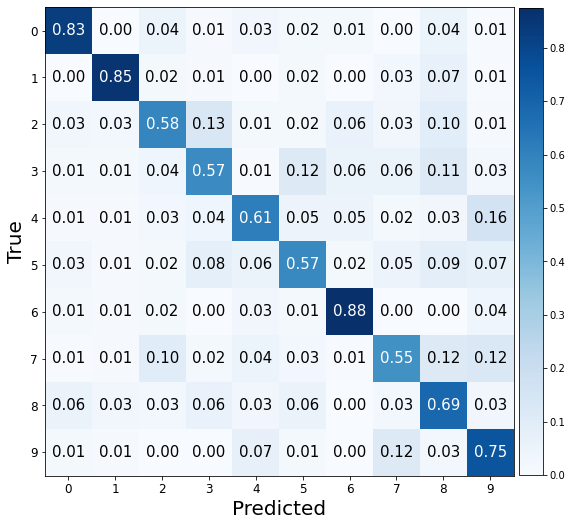

###################

ne: 50, hd:50, wd:0.01, lr: 0.0001, bs:1024 
Valid Evaluation loss: 1.8405952453613281. f1:0.47186309714671293 acc: 0.4830000102519989 


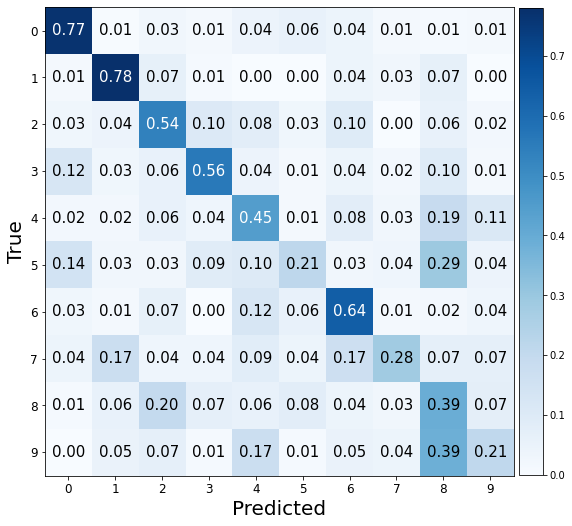

###################

ne: 50, hd:80, wd:0.01, lr: 0.0001, bs:1024 
Valid Evaluation loss: 1.138746738433838. f1:0.6645285718481353 acc: 0.6650000214576721 


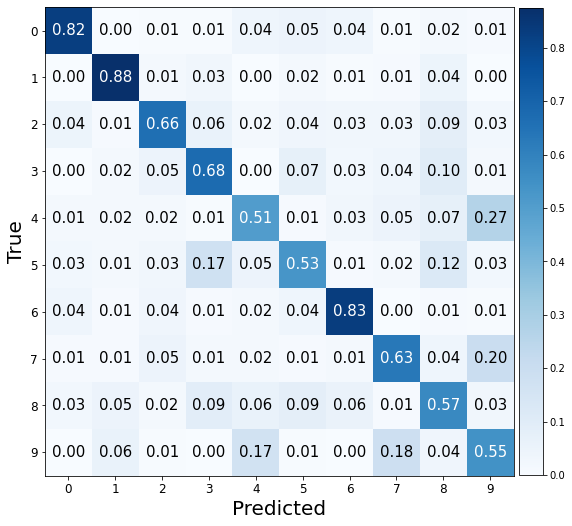

###################

ne: 50, hd:100, wd:0.01, lr: 0.0001, bs:1024 
Valid Evaluation loss: 1.1022000312805176. f1:0.7226888388436031 acc: 0.7239999771118164 


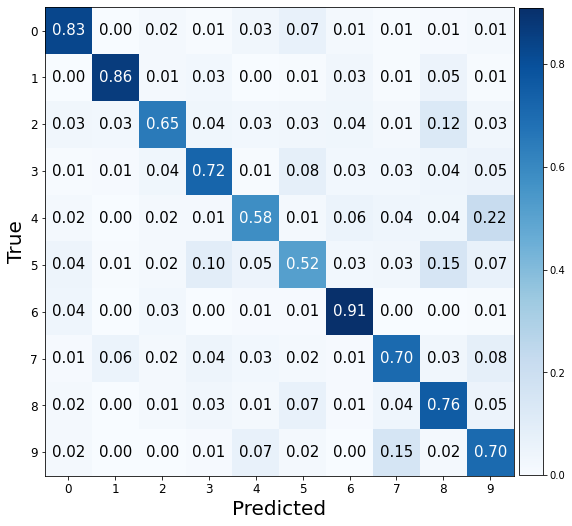

###################

ne: 50, hd:50, wd:0.1, lr: 0.0001, bs:1024 
Valid Evaluation loss: 2.0102367401123047. f1:0.40740487265622083 acc: 0.42399999499320984 


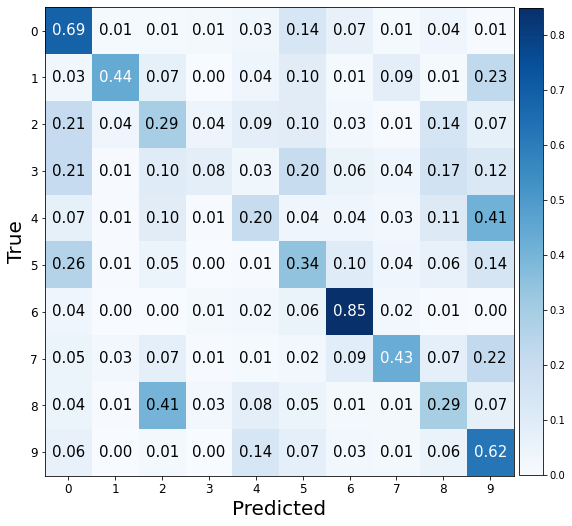

###################

ne: 50, hd:80, wd:0.1, lr: 0.0001, bs:1024 
Valid Evaluation loss: 1.2915198802947998. f1:0.6426492592522473 acc: 0.6460000276565552 


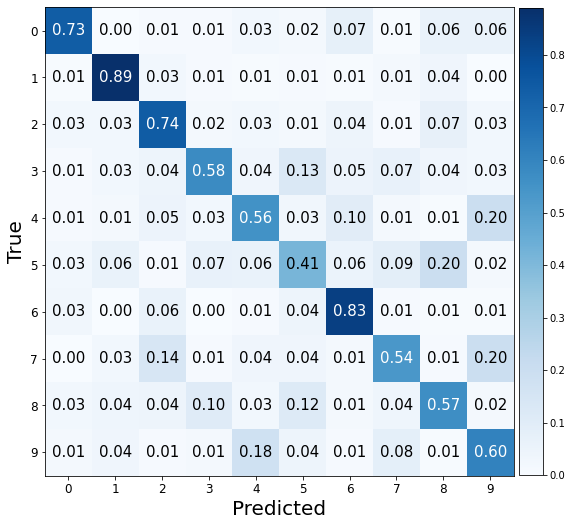

###################

ne: 50, hd:100, wd:0.1, lr: 0.0001, bs:1024 
Valid Evaluation loss: 1.033341407775879. f1:0.7247458411395987 acc: 0.7245000004768372 


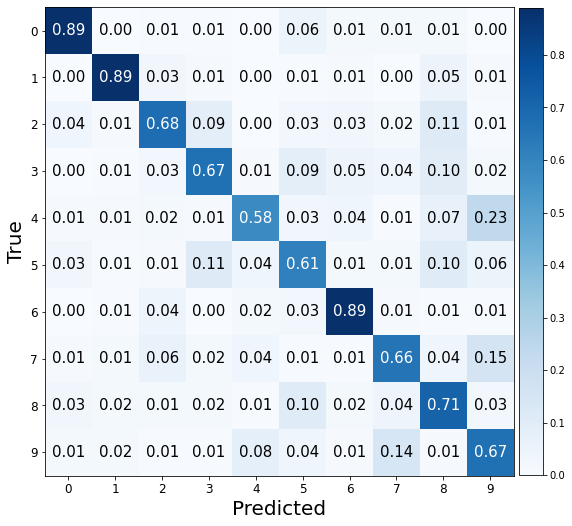

###################

ne: 50, hd:50, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.48669904470443726. f1:0.8676050941428939 acc: 0.8679999709129333 


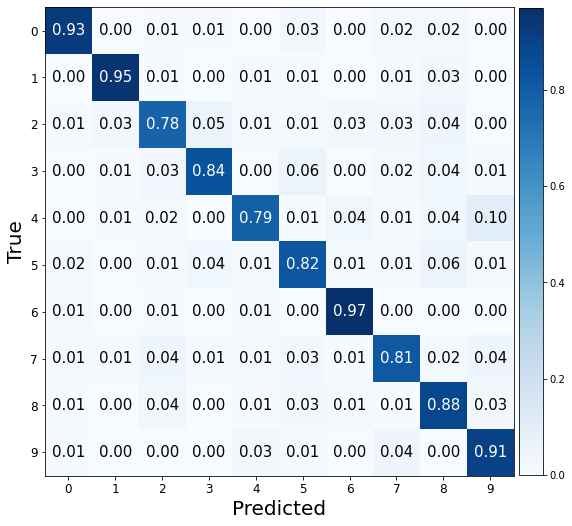

###################

ne: 50, hd:80, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.4087021052837372. f1:0.8922390697169924 acc: 0.8924999833106995 


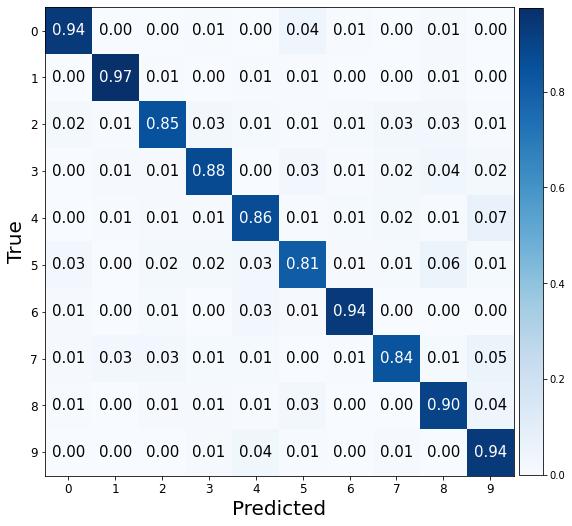

###################

ne: 50, hd:100, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.3993203341960907. f1:0.8897454990978773 acc: 0.8899999856948853 


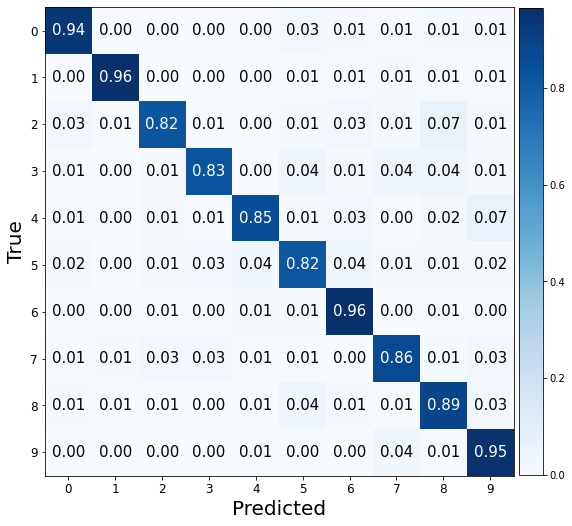

###################

ne: 50, hd:50, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.5044375658035278. f1:0.8592361109663891 acc: 0.859000027179718 


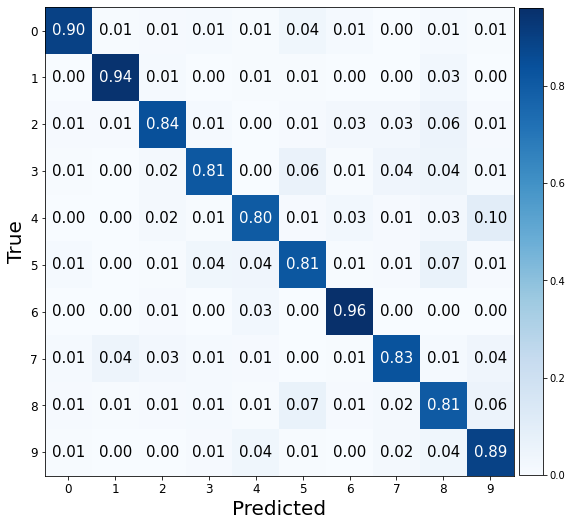

###################

ne: 50, hd:80, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.4722532629966736. f1:0.8705393266030106 acc: 0.8700000047683716 


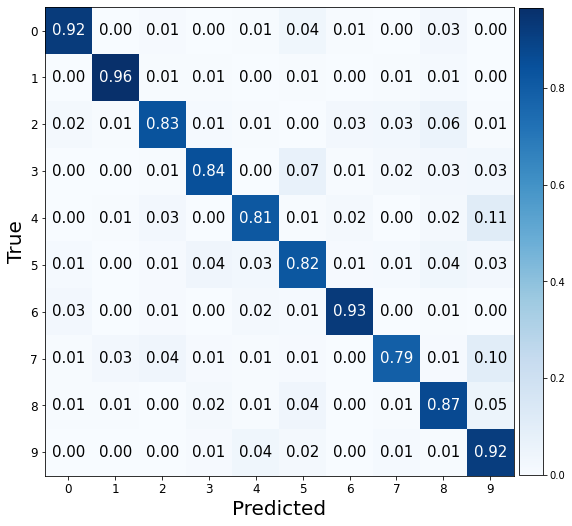

###################

ne: 50, hd:100, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.39000722765922546. f1:0.8902876723820968 acc: 0.890500009059906 


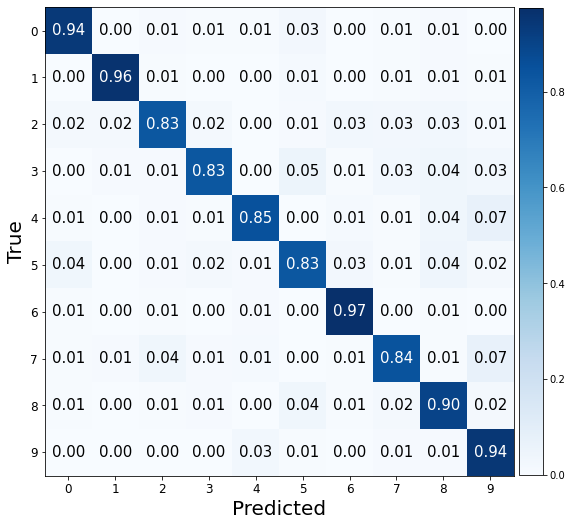

###################

ne: 50, hd:50, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.4606824815273285. f1:0.8588871957437249 acc: 0.859000027179718 


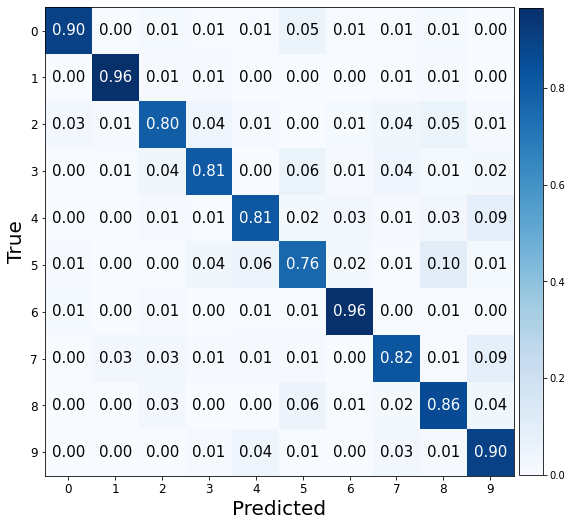

###################

ne: 50, hd:80, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.3739916980266571. f1:0.8904349405727826 acc: 0.890500009059906 


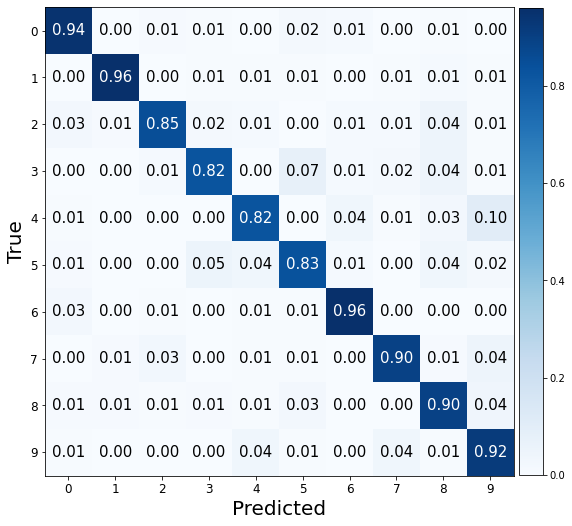

###################

ne: 50, hd:100, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.3129510283470154. f1:0.9063781254957902 acc: 0.906499981880188 


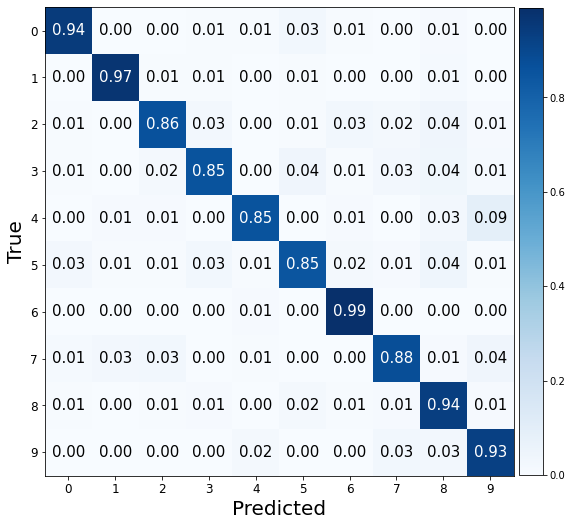

###################

ne: 50, hd:50, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.6529440879821777. f1:0.33250211635553273 acc: 0.41499999165534973 


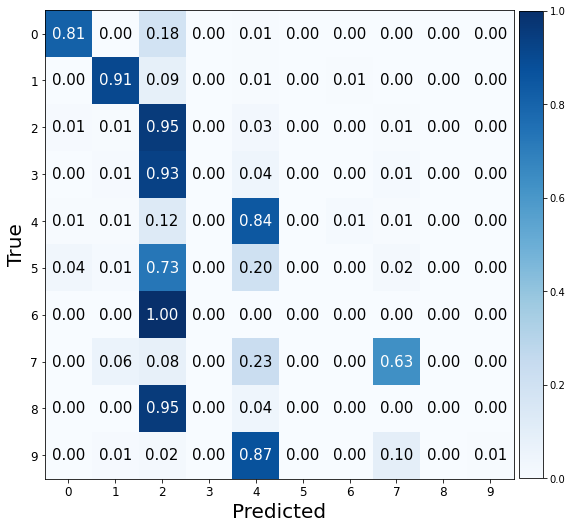

###################

ne: 50, hd:80, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.0516847372055054. f1:0.5996129143846636 acc: 0.6169999837875366 


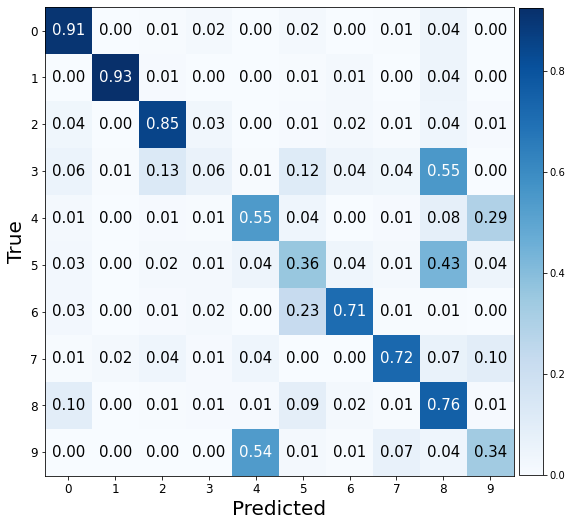

###################

ne: 50, hd:100, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.7021790146827698. f1:0.7969796963916844 acc: 0.7960000038146973 


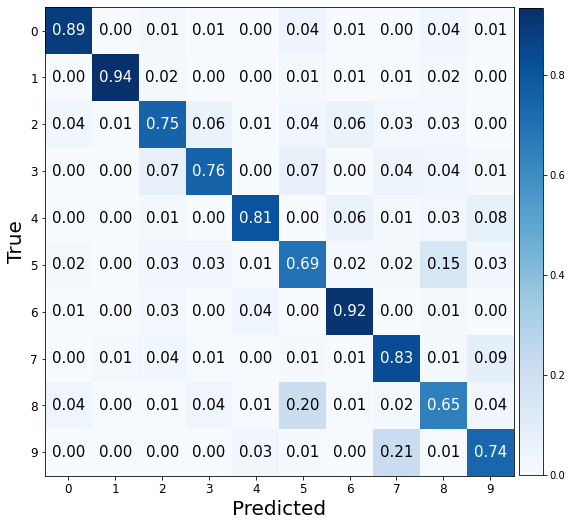

###################

ne: 50, hd:50, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.8928414583206177. f1:0.21742185904291045 acc: 0.2745000123977661 


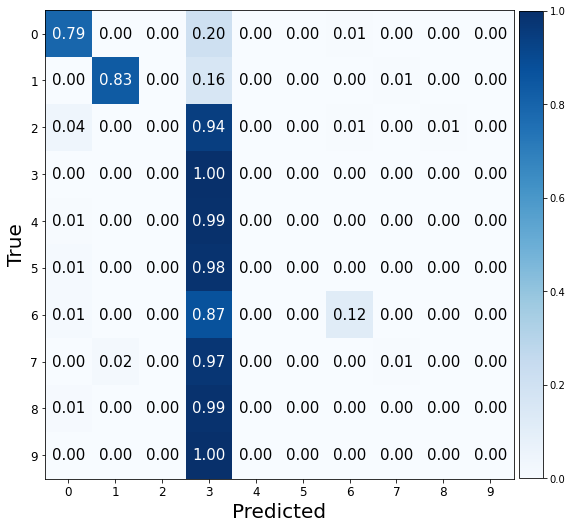

###################

ne: 50, hd:80, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.6938248872756958. f1:0.7690835270511481 acc: 0.7674999833106995 


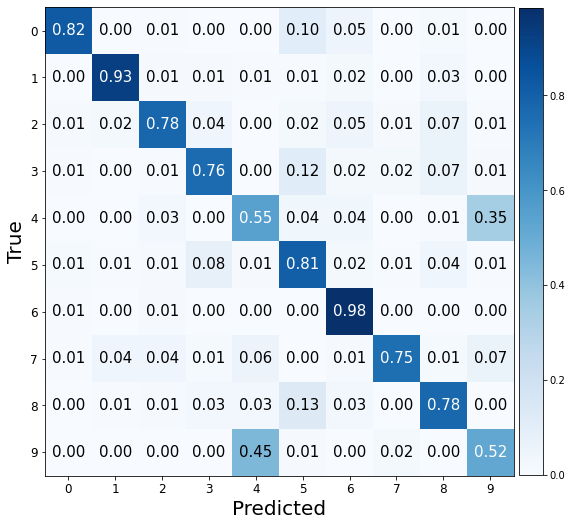

###################

ne: 50, hd:100, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.6965078711509705. f1:0.7795656243361355 acc: 0.7820000052452087 


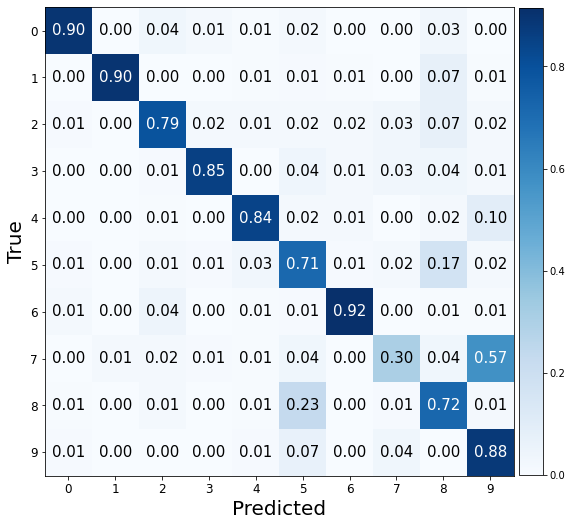

###################

ne: 50, hd:50, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.7401220202445984. f1:0.7611430946700476 acc: 0.7615000009536743 


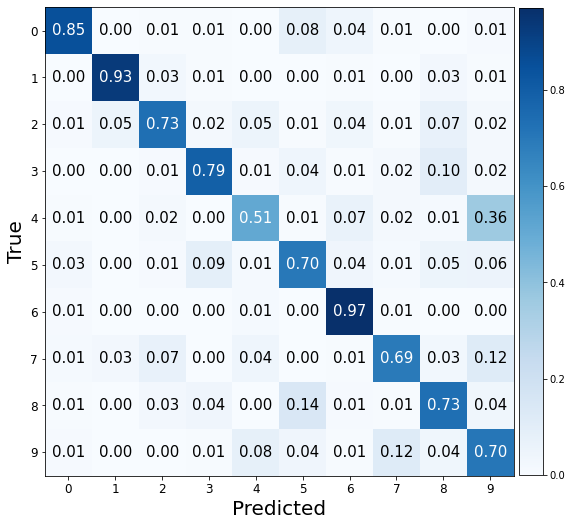

###################

ne: 50, hd:80, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.7308920621871948. f1:0.7992601022435754 acc: 0.8004999756813049 


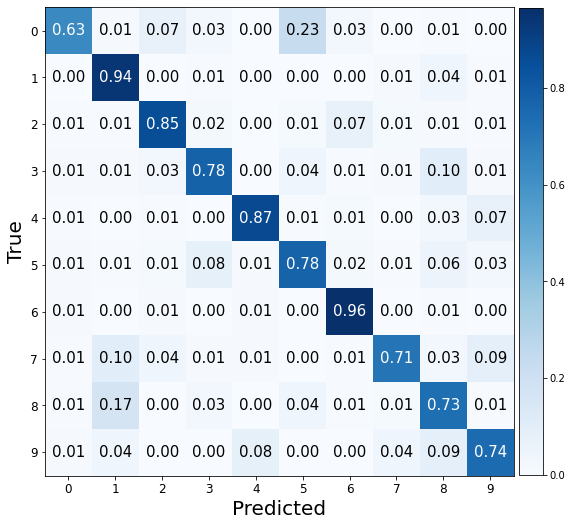

###################

ne: 50, hd:100, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.41438403725624084. f1:0.873805164651077 acc: 0.8734999895095825 


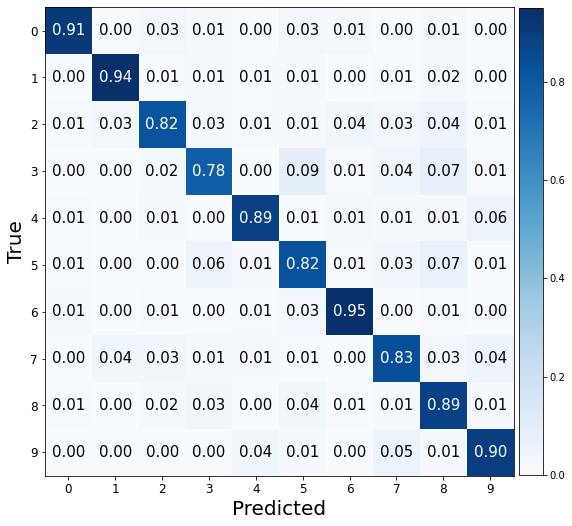

###################

ne: 100, hd:50, wd:0.001, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.737436056137085. f1:0.7839381045707163 acc: 0.7854999899864197 


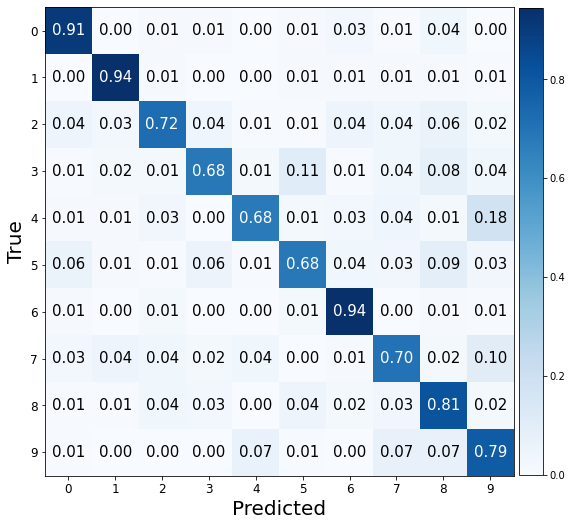

###################

ne: 100, hd:80, wd:0.001, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.8229556083679199. f1:0.7717009229731681 acc: 0.7730000019073486 


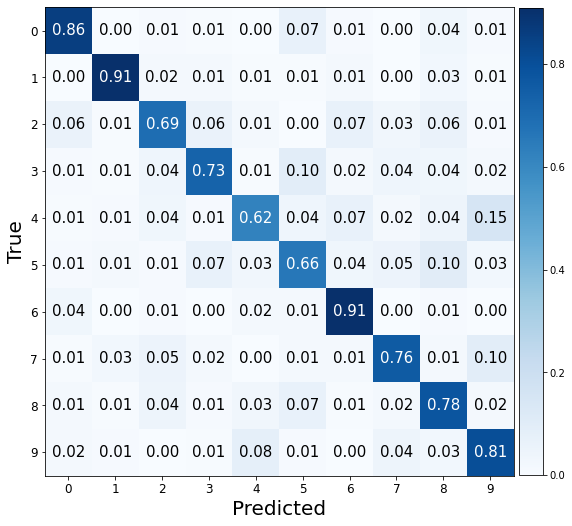

###################

ne: 100, hd:100, wd:0.001, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.7241583466529846. f1:0.8059347752188766 acc: 0.8075000047683716 


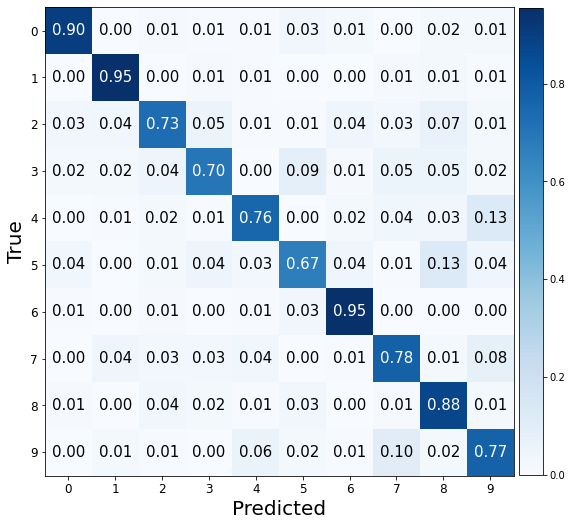

###################

ne: 100, hd:50, wd:0.01, lr: 0.0001, bs:400 
Valid Evaluation loss: 1.1942983865737915. f1:0.6752875332830051 acc: 0.6790000200271606 


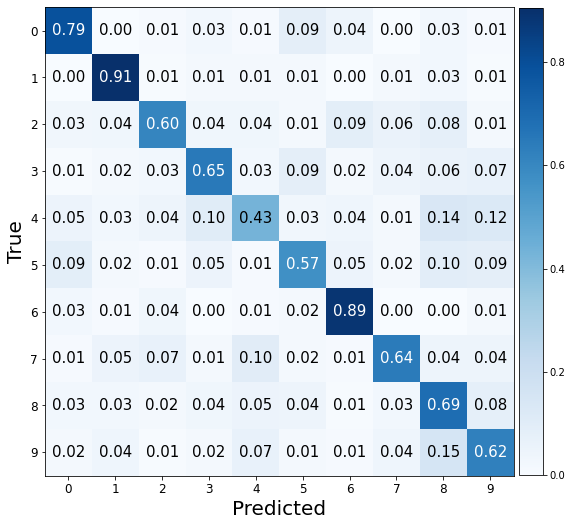

###################

ne: 100, hd:80, wd:0.01, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.822750449180603. f1:0.789059827297076 acc: 0.7894999980926514 


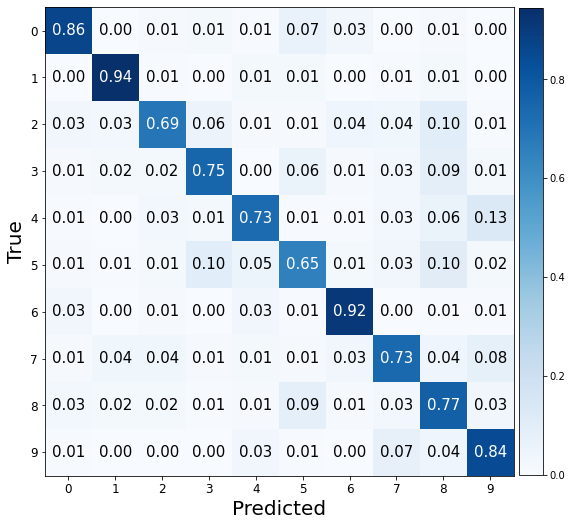

###################

ne: 100, hd:100, wd:0.01, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.6795985698699951. f1:0.8089378490367356 acc: 0.809499979019165 


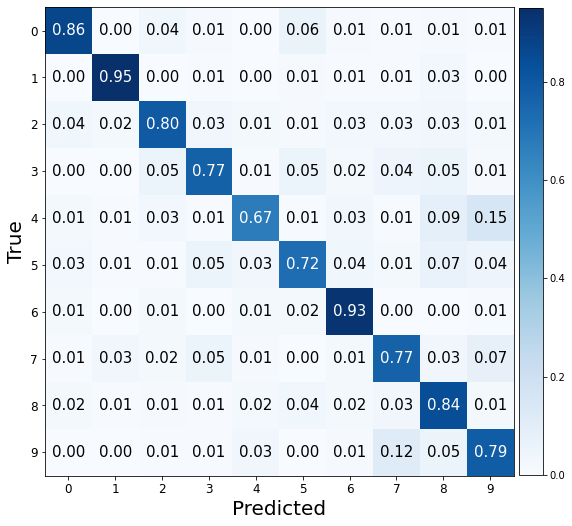

###################

ne: 100, hd:50, wd:0.1, lr: 0.0001, bs:400 
Valid Evaluation loss: 1.1711406707763672. f1:0.6746289275536398 acc: 0.6744999885559082 


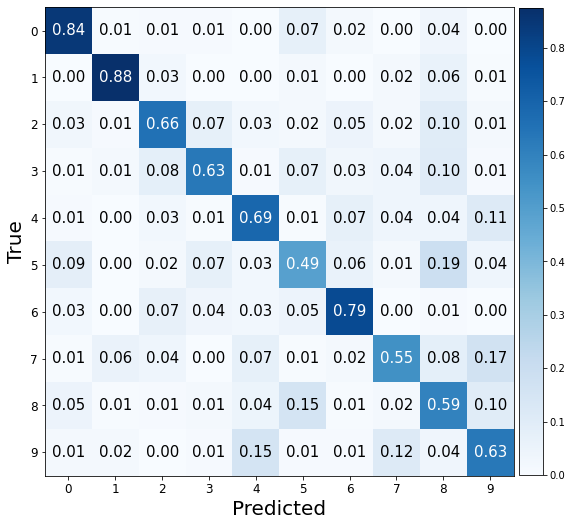

###################

ne: 100, hd:80, wd:0.1, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.6985716223716736. f1:0.7980013677473138 acc: 0.7990000247955322 


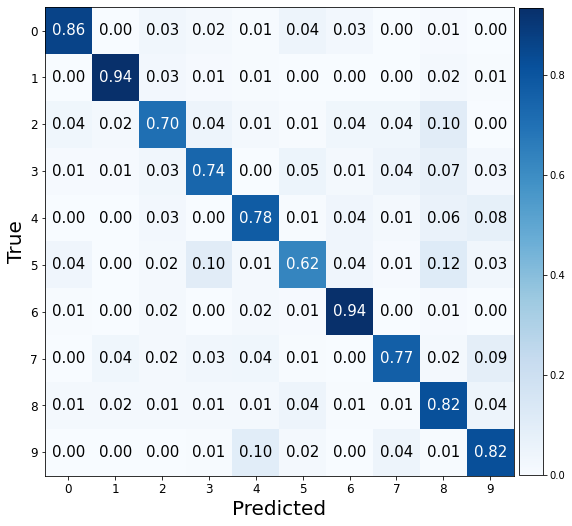

###################

ne: 100, hd:100, wd:0.1, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.756352961063385. f1:0.8066647837841885 acc: 0.8075000047683716 


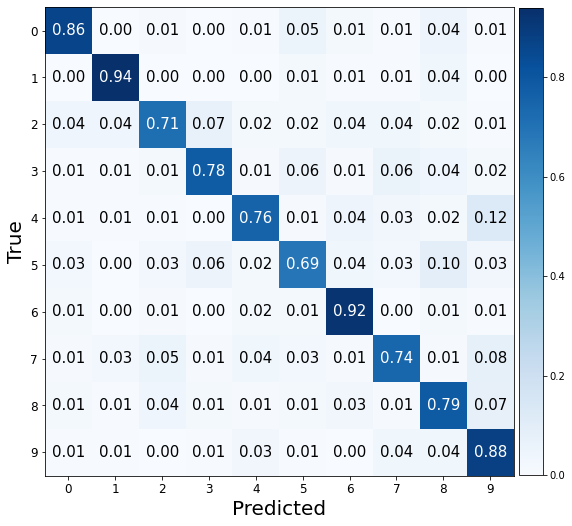

###################

ne: 100, hd:50, wd:0.001, lr: 0.001, bs:400 
Valid Evaluation loss: 0.42071494460105896. f1:0.8946304690339852 acc: 0.8949999809265137 


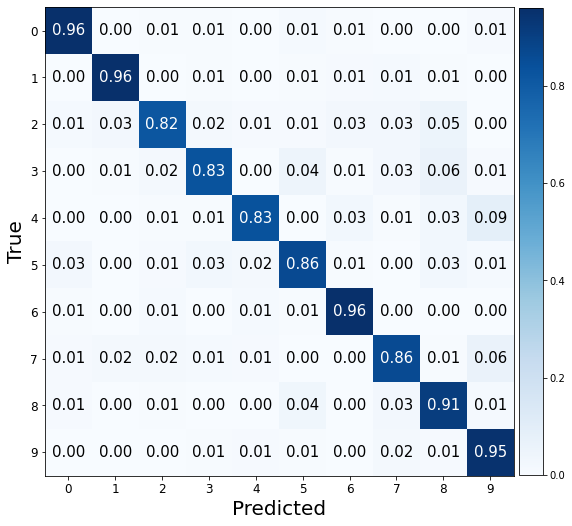

###################

ne: 100, hd:80, wd:0.001, lr: 0.001, bs:400 
Valid Evaluation loss: 0.37489446997642517. f1:0.8934461635025475 acc: 0.8934999704360962 


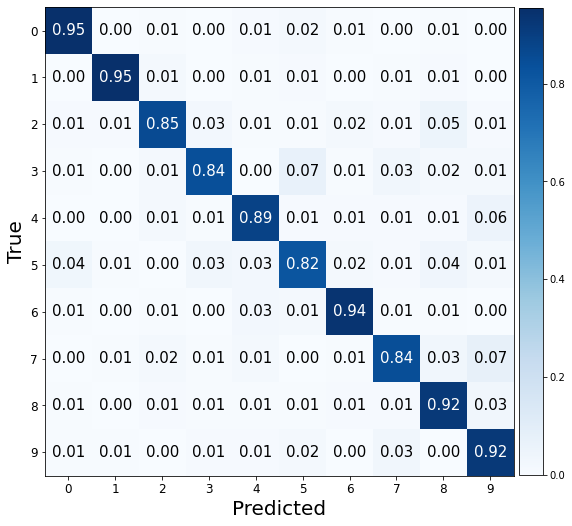

###################

ne: 100, hd:100, wd:0.001, lr: 0.001, bs:400 
Valid Evaluation loss: 0.3847084641456604. f1:0.9043814452535719 acc: 0.9045000076293945 


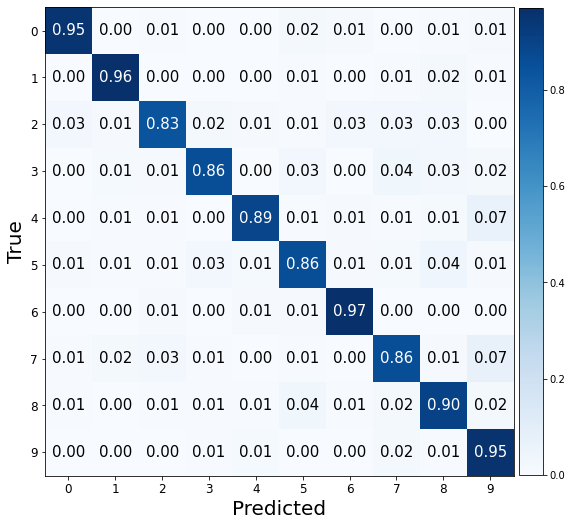

###################

ne: 100, hd:50, wd:0.01, lr: 0.001, bs:400 
Valid Evaluation loss: 0.39641135931015015. f1:0.9015025439441076 acc: 0.9020000100135803 


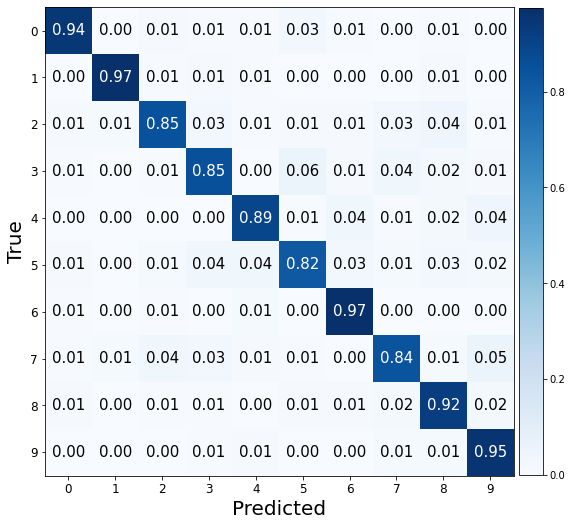

###################

ne: 100, hd:80, wd:0.01, lr: 0.001, bs:400 
Valid Evaluation loss: 0.32865503430366516. f1:0.9104299467984246 acc: 0.9104999899864197 


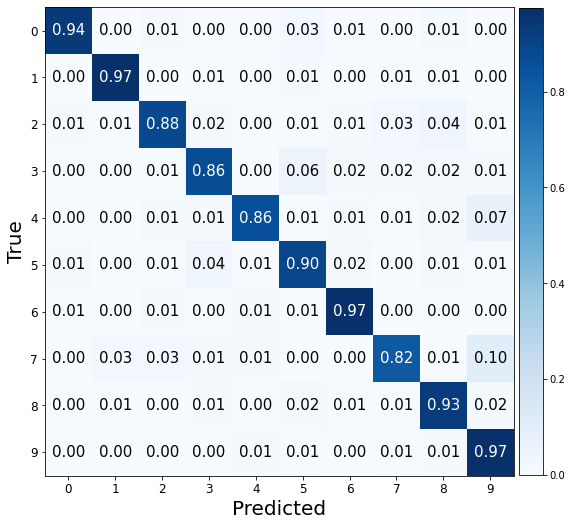

###################

ne: 100, hd:100, wd:0.01, lr: 0.001, bs:400 
Valid Evaluation loss: 0.33525344729423523. f1:0.9132128553868437 acc: 0.9135000109672546 


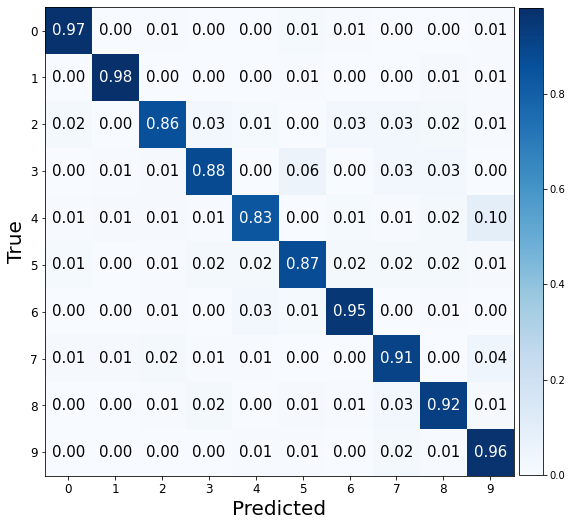

###################

ne: 100, hd:50, wd:0.1, lr: 0.001, bs:400 
Valid Evaluation loss: 0.3635578453540802. f1:0.8854462248509964 acc: 0.8855000138282776 


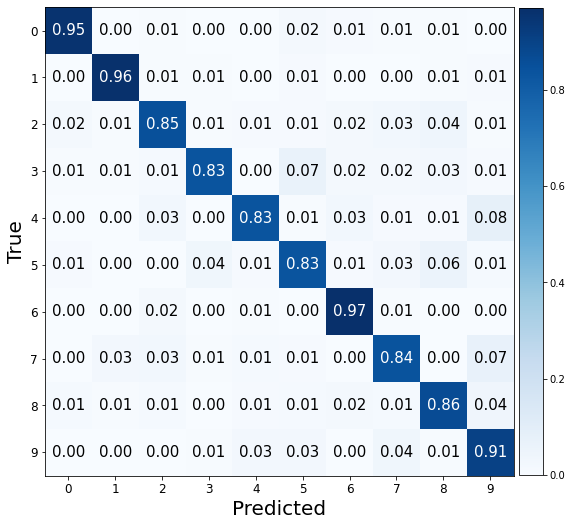

###################

ne: 100, hd:80, wd:0.1, lr: 0.001, bs:400 
Valid Evaluation loss: 0.3166348934173584. f1:0.9034615786091844 acc: 0.9035000205039978 


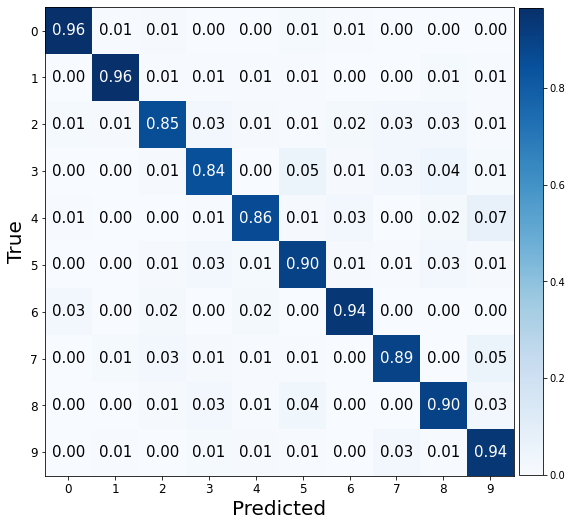

###################

ne: 100, hd:100, wd:0.1, lr: 0.001, bs:400 
Valid Evaluation loss: 0.2963627576828003. f1:0.9058881584106349 acc: 0.906000018119812 


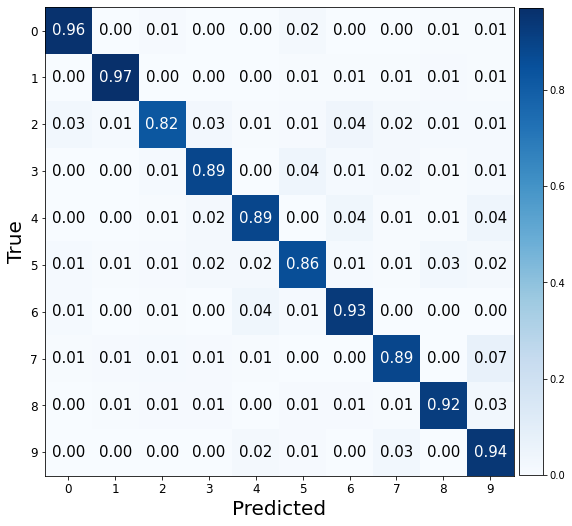

###################

ne: 100, hd:50, wd:0.001, lr: 0.01, bs:400 
Valid Evaluation loss: 0.5794408917427063. f1:0.8387357241212674 acc: 0.8389999866485596 


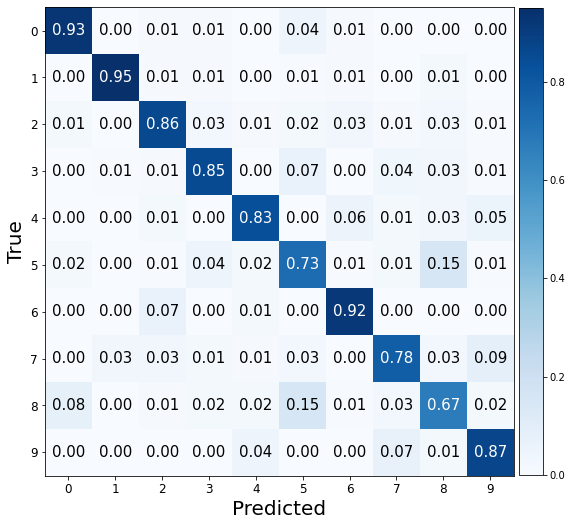

###################

ne: 100, hd:80, wd:0.001, lr: 0.01, bs:400 
Valid Evaluation loss: 0.6289758086204529. f1:0.8507281040802104 acc: 0.8495000004768372 


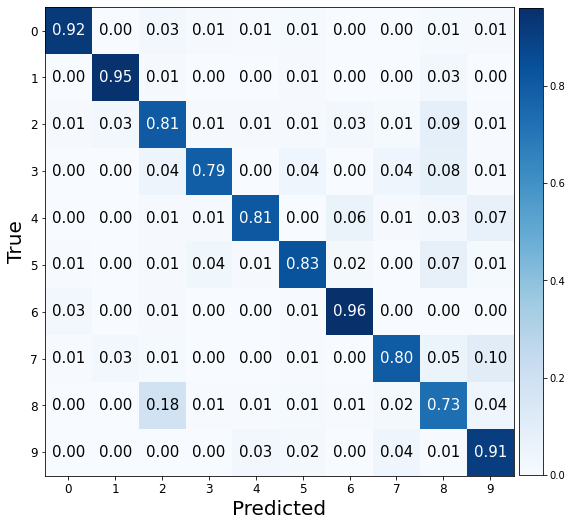

###################

ne: 100, hd:100, wd:0.001, lr: 0.01, bs:400 
Valid Evaluation loss: 0.6704583764076233. f1:0.8397444156450524 acc: 0.8395000100135803 


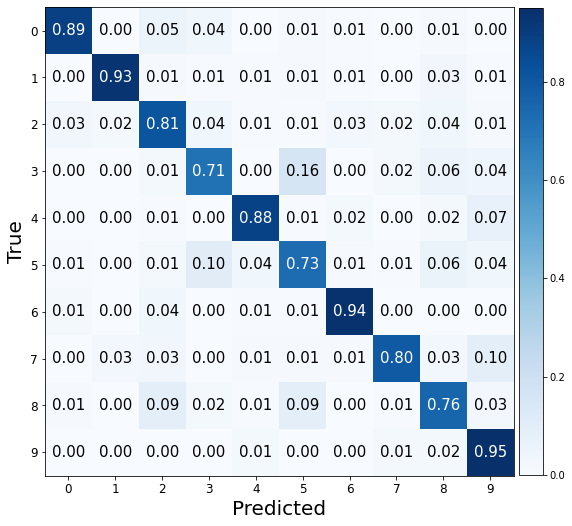

###################

ne: 100, hd:50, wd:0.01, lr: 0.01, bs:400 
Valid Evaluation loss: 0.5908558368682861. f1:0.8370650248535225 acc: 0.8364999890327454 


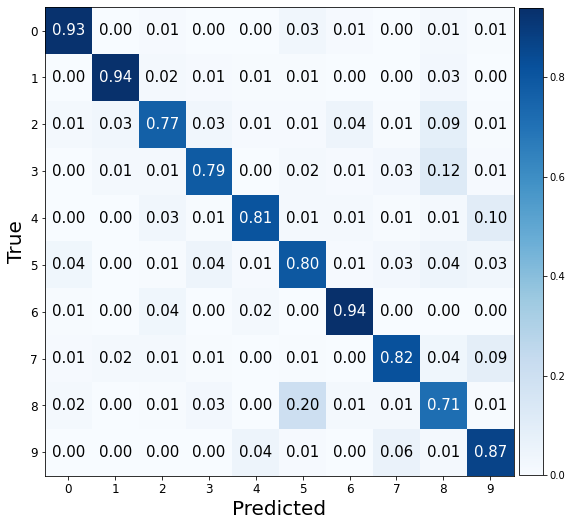

###################

ne: 100, hd:80, wd:0.01, lr: 0.01, bs:400 
Valid Evaluation loss: 0.7169826030731201. f1:0.7539002223353461 acc: 0.7599999904632568 


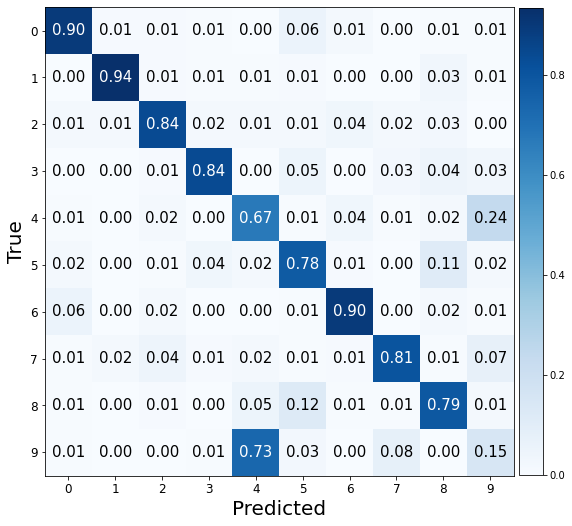

###################

ne: 100, hd:100, wd:0.01, lr: 0.01, bs:400 
Valid Evaluation loss: 0.4718479812145233. f1:0.8815767493713297 acc: 0.8815000057220459 


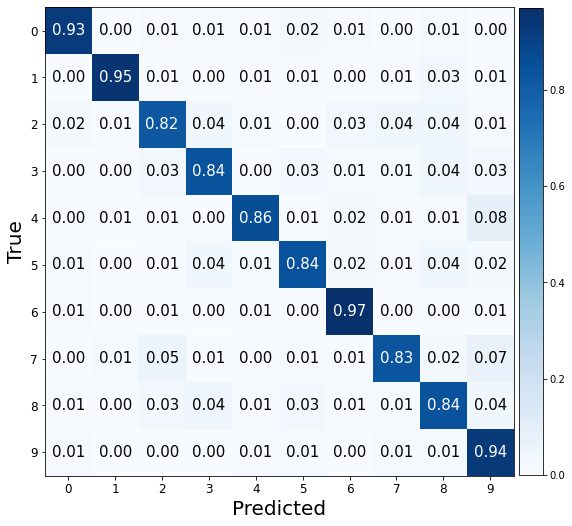

###################

ne: 100, hd:50, wd:0.1, lr: 0.01, bs:400 
Valid Evaluation loss: 0.5436848998069763. f1:0.8313336406134175 acc: 0.8309999704360962 


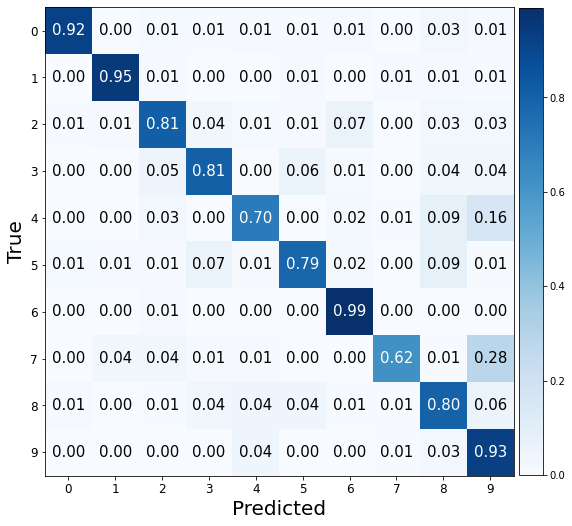

###################

ne: 100, hd:80, wd:0.1, lr: 0.01, bs:400 
Valid Evaluation loss: 0.27597448229789734. f1:0.9160239817471678 acc: 0.9160000085830688 


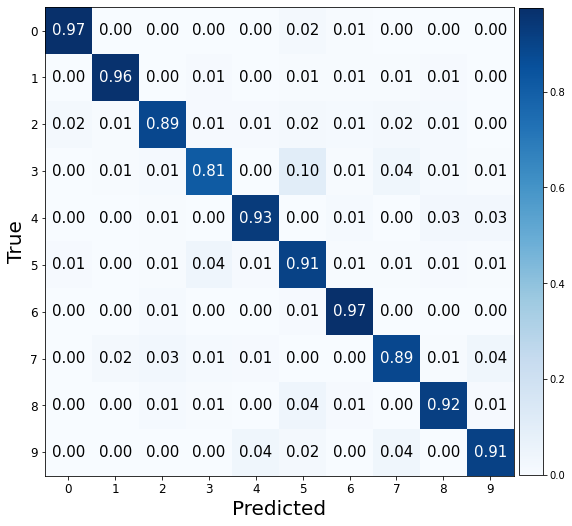

###################

ne: 100, hd:100, wd:0.1, lr: 0.01, bs:400 
Valid Evaluation loss: 0.3243007957935333. f1:0.8973535246471547 acc: 0.8974999785423279 


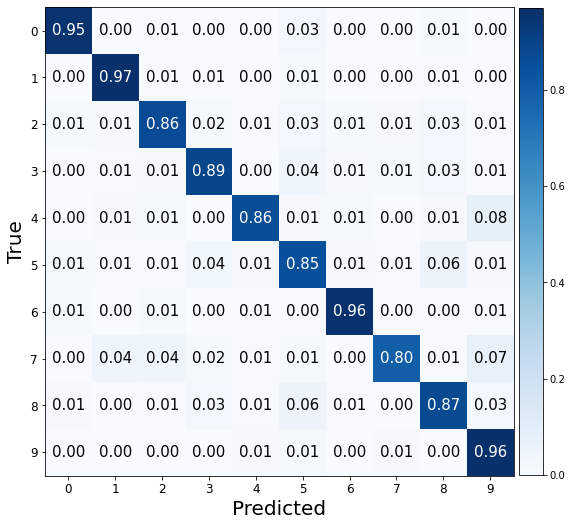

###################

ne: 100, hd:50, wd:0.001, lr: 0.0001, bs:720 
Valid Evaluation loss: 1.0678654909133911. f1:0.6776115101881016 acc: 0.6815000176429749 


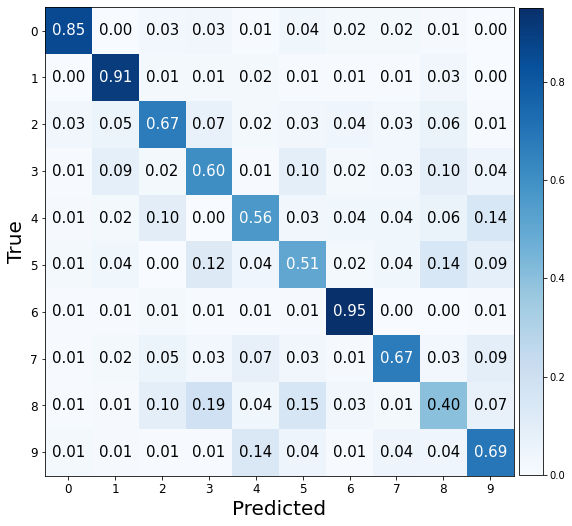

###################

ne: 100, hd:80, wd:0.001, lr: 0.0001, bs:720 
Valid Evaluation loss: 0.7101734280586243. f1:0.8174060870377018 acc: 0.8180000185966492 


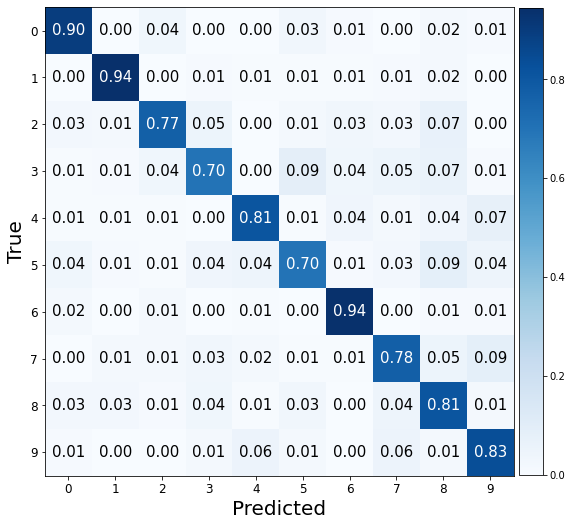

###################

ne: 100, hd:100, wd:0.001, lr: 0.0001, bs:720 
Valid Evaluation loss: 0.6159241199493408. f1:0.8352762689469053 acc: 0.8355000019073486 


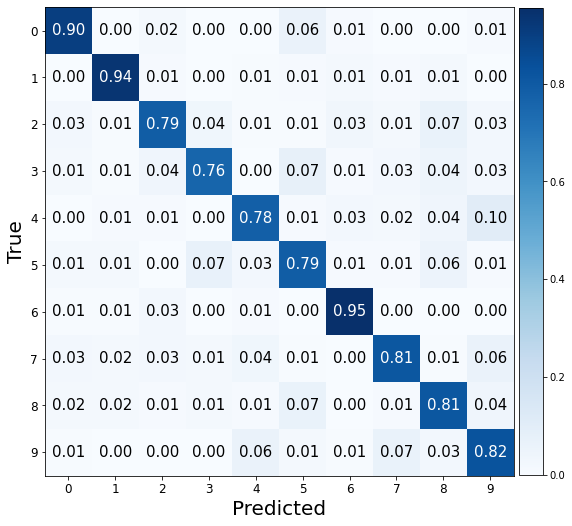

###################

ne: 100, hd:50, wd:0.01, lr: 0.0001, bs:720 
Valid Evaluation loss: 1.291778802871704. f1:0.6618282839517348 acc: 0.6635000109672546 


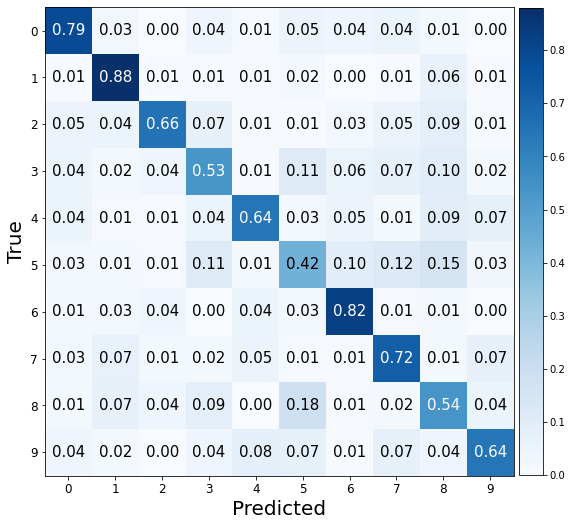

###################

ne: 100, hd:80, wd:0.01, lr: 0.0001, bs:720 
Valid Evaluation loss: 0.8041113018989563. f1:0.7747592758989404 acc: 0.7745000123977661 


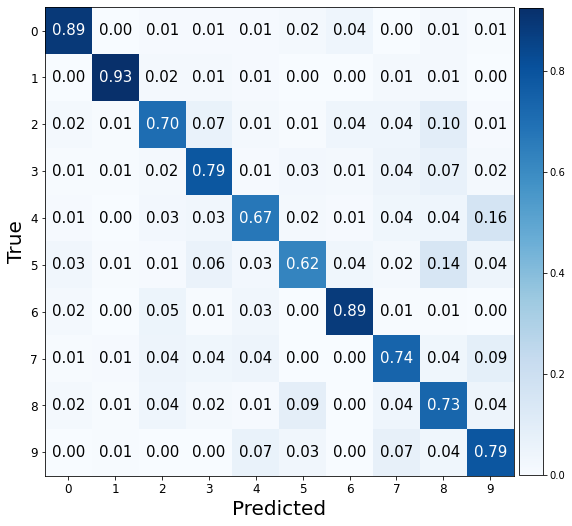

###################

ne: 100, hd:100, wd:0.01, lr: 0.0001, bs:720 
Valid Evaluation loss: 0.7537246346473694. f1:0.7973074985023305 acc: 0.7979999780654907 


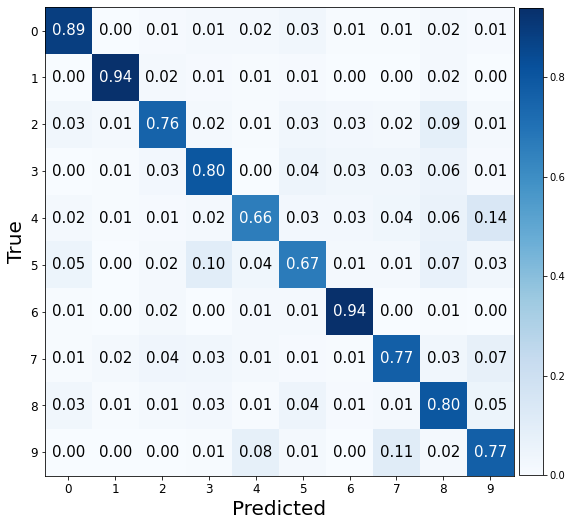

###################

ne: 100, hd:50, wd:0.1, lr: 0.0001, bs:720 
Valid Evaluation loss: 1.0516842603683472. f1:0.7113105428752313 acc: 0.7124999761581421 


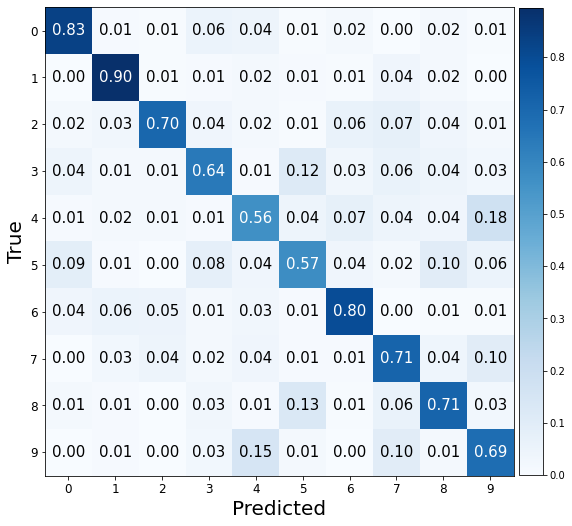

###################

ne: 100, hd:80, wd:0.1, lr: 0.0001, bs:720 
Valid Evaluation loss: 0.704702615737915. f1:0.7922960575427374 acc: 0.7925000190734863 


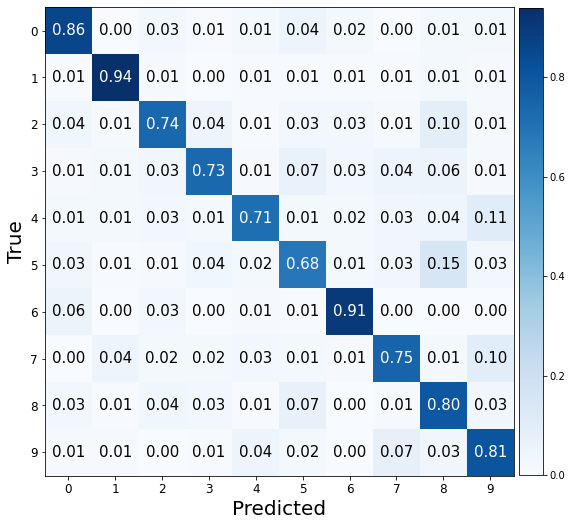

###################

ne: 100, hd:100, wd:0.1, lr: 0.0001, bs:720 
Valid Evaluation loss: 0.6751299500465393. f1:0.8015519180121606 acc: 0.8025000095367432 


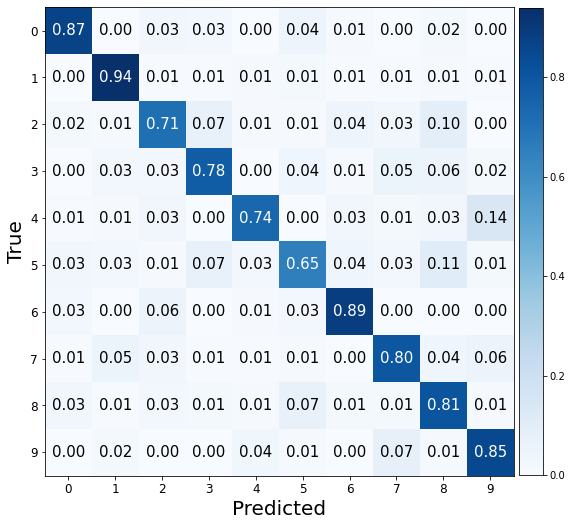

###################

ne: 100, hd:50, wd:0.001, lr: 0.001, bs:720 
Valid Evaluation loss: 0.4289635717868805. f1:0.8846952801410639 acc: 0.8855000138282776 


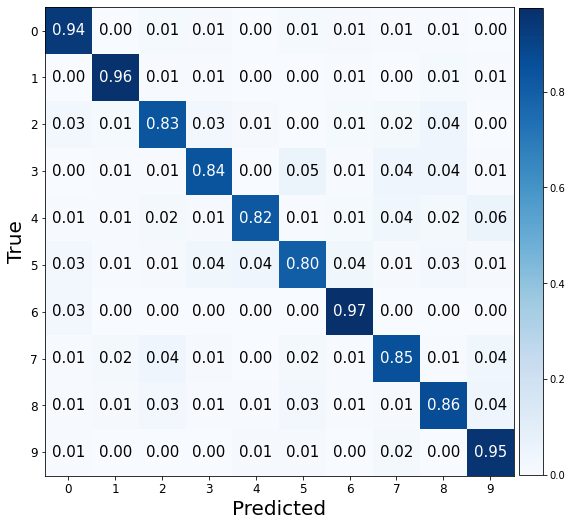

###################

ne: 100, hd:80, wd:0.001, lr: 0.001, bs:720 
Valid Evaluation loss: 0.35437214374542236. f1:0.9077262294811991 acc: 0.9079999923706055 


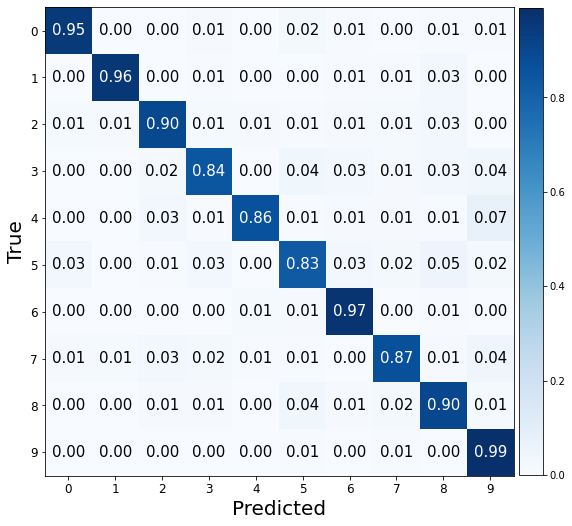

###################

ne: 100, hd:100, wd:0.001, lr: 0.001, bs:720 
Valid Evaluation loss: 0.3039202094078064. f1:0.9178817646729323 acc: 0.9179999828338623 


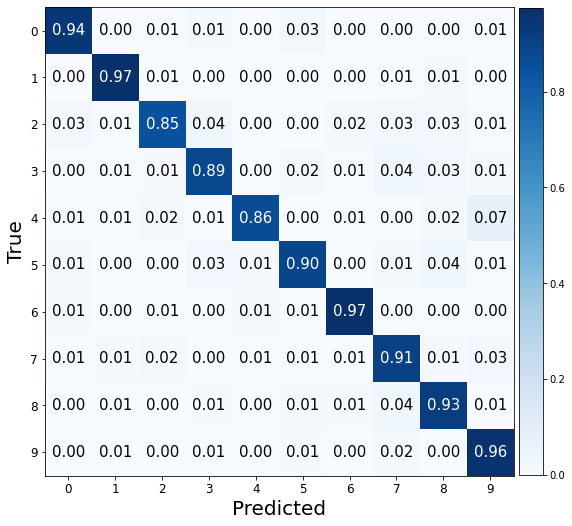

###################

ne: 100, hd:50, wd:0.01, lr: 0.001, bs:720 
Valid Evaluation loss: 0.41564643383026123. f1:0.8839134627784491 acc: 0.8845000267028809 


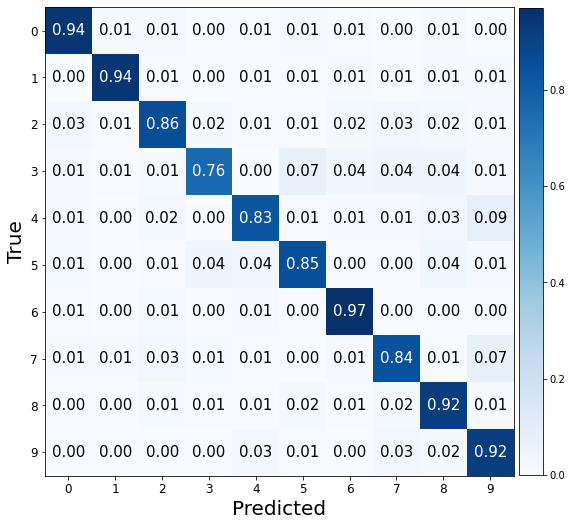

###################

ne: 100, hd:80, wd:0.01, lr: 0.001, bs:720 
Valid Evaluation loss: 0.38332217931747437. f1:0.9017751756497578 acc: 0.9020000100135803 


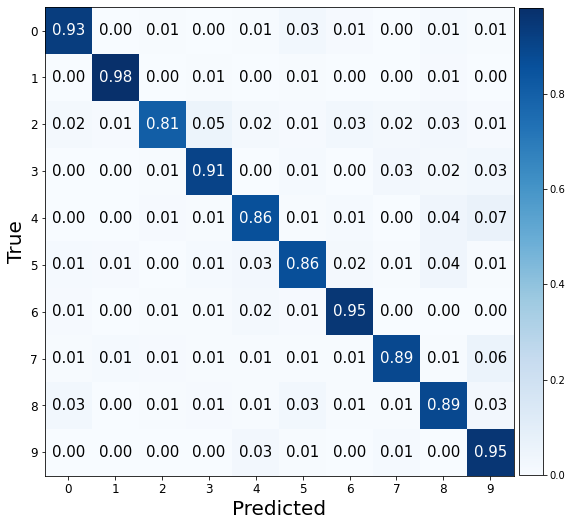

###################

ne: 100, hd:100, wd:0.01, lr: 0.001, bs:720 
Valid Evaluation loss: 0.313620001077652. f1:0.9119168927918905 acc: 0.9120000004768372 


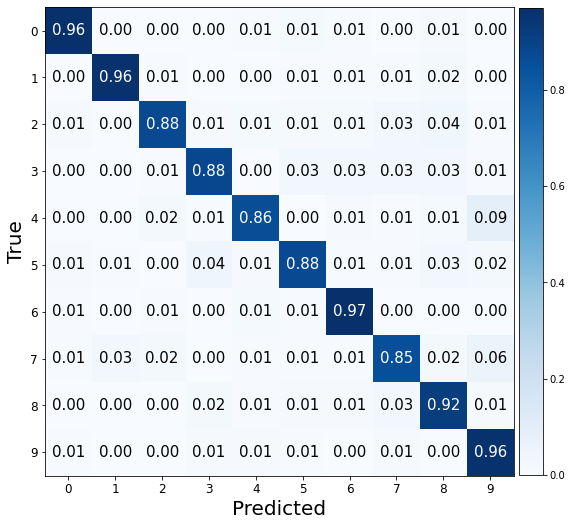

###################

ne: 100, hd:50, wd:0.1, lr: 0.001, bs:720 
Valid Evaluation loss: 0.32395634055137634. f1:0.8973312005083092 acc: 0.8974999785423279 


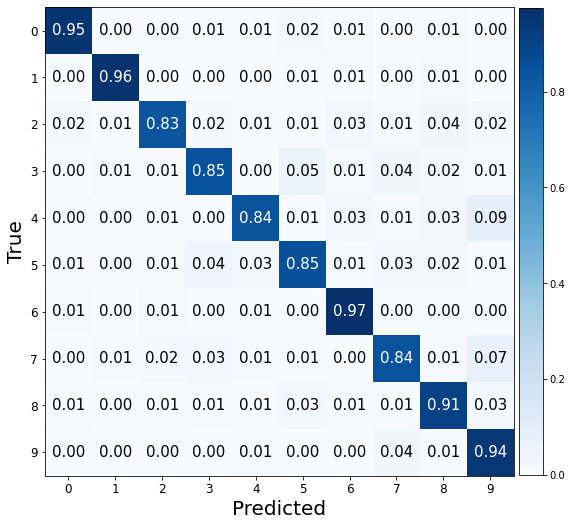

###################

ne: 100, hd:80, wd:0.1, lr: 0.001, bs:720 
Valid Evaluation loss: 0.30906936526298523. f1:0.9048647120676041 acc: 0.9054999947547913 


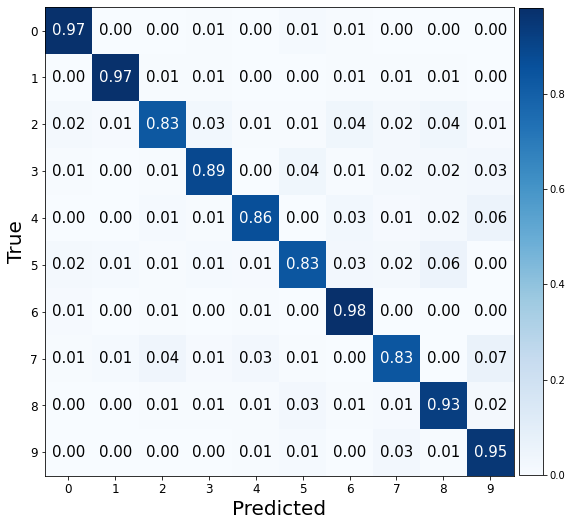

###################

ne: 100, hd:100, wd:0.1, lr: 0.001, bs:720 
Valid Evaluation loss: 0.28830042481422424. f1:0.9084983993084235 acc: 0.9085000157356262 


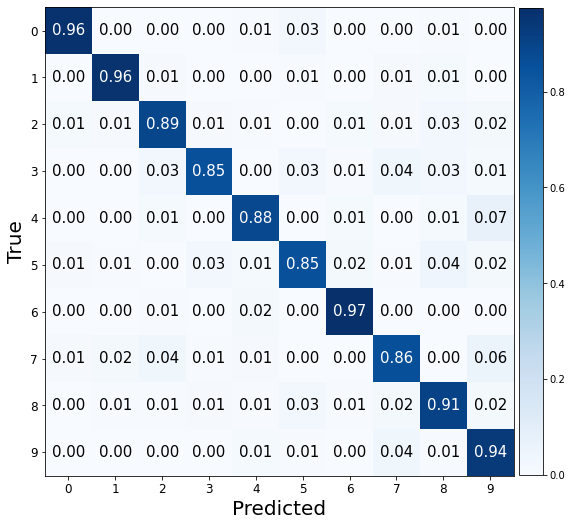

###################

ne: 100, hd:50, wd:0.001, lr: 0.01, bs:720 
Valid Evaluation loss: 0.9005314707756042. f1:0.7271260534878715 acc: 0.7480000257492065 


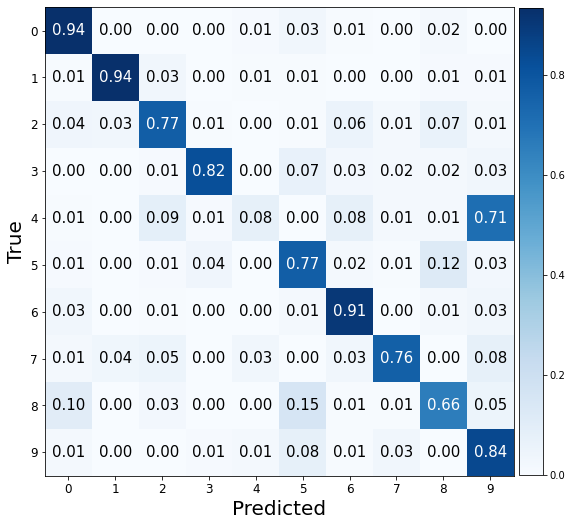

###################

ne: 100, hd:80, wd:0.001, lr: 0.01, bs:720 
Valid Evaluation loss: 0.5086948275566101. f1:0.8678125154228489 acc: 0.8669999837875366 


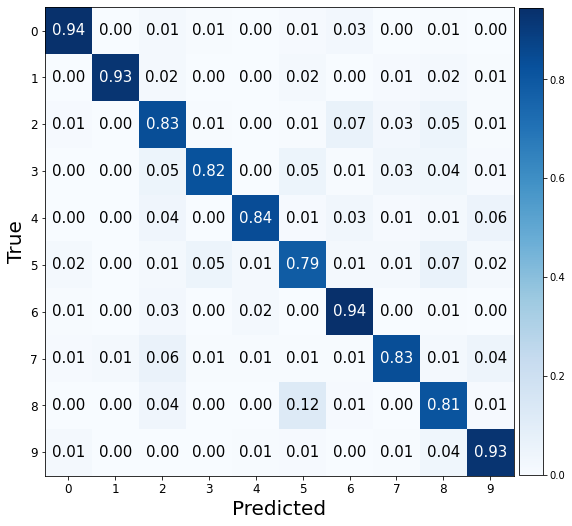

###################

ne: 100, hd:100, wd:0.001, lr: 0.01, bs:720 
Valid Evaluation loss: 1.4480664730072021. f1:0.41712406861419904 acc: 0.45750001072883606 


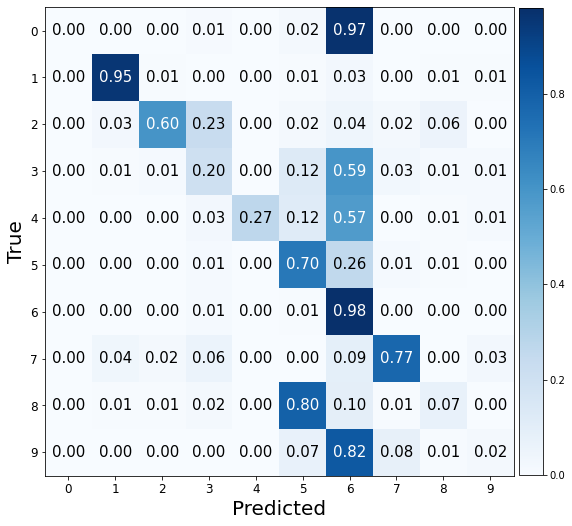

###################

ne: 100, hd:50, wd:0.01, lr: 0.01, bs:720 
Valid Evaluation loss: 0.5001643896102905. f1:0.8530725731906663 acc: 0.8529999852180481 


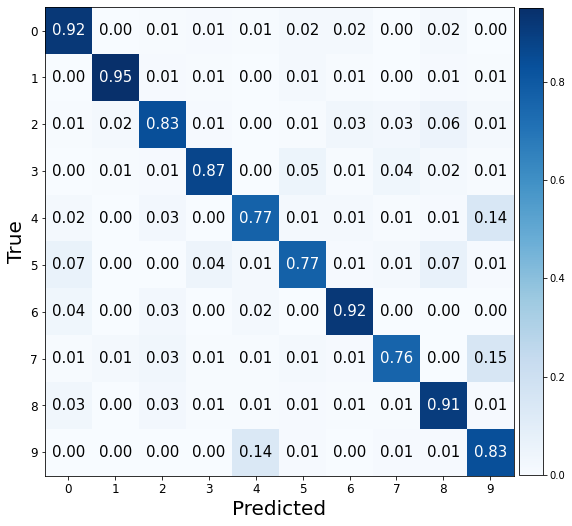

###################

ne: 100, hd:80, wd:0.01, lr: 0.01, bs:720 
Valid Evaluation loss: 0.7536656260490417. f1:0.7926967078884164 acc: 0.7929999828338623 


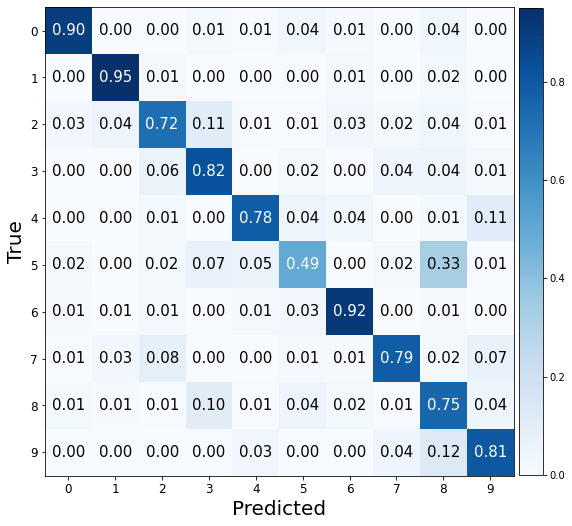

###################

ne: 100, hd:100, wd:0.01, lr: 0.01, bs:720 
Valid Evaluation loss: 0.8077672719955444. f1:0.726490900141725 acc: 0.737500011920929 


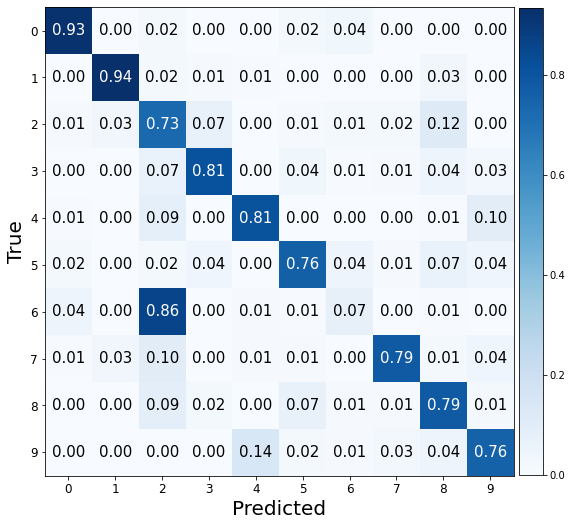

###################

ne: 100, hd:50, wd:0.1, lr: 0.01, bs:720 
Valid Evaluation loss: 0.4062274396419525. f1:0.8790708674745182 acc: 0.8790000081062317 


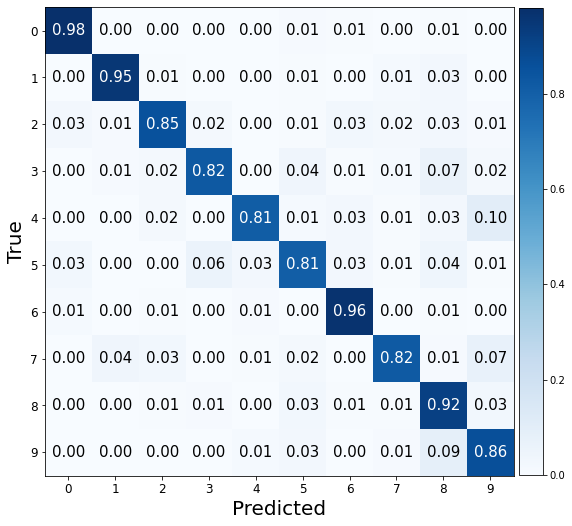

###################

ne: 100, hd:80, wd:0.1, lr: 0.01, bs:720 
Valid Evaluation loss: 0.354763388633728. f1:0.890654723802448 acc: 0.8914999961853027 


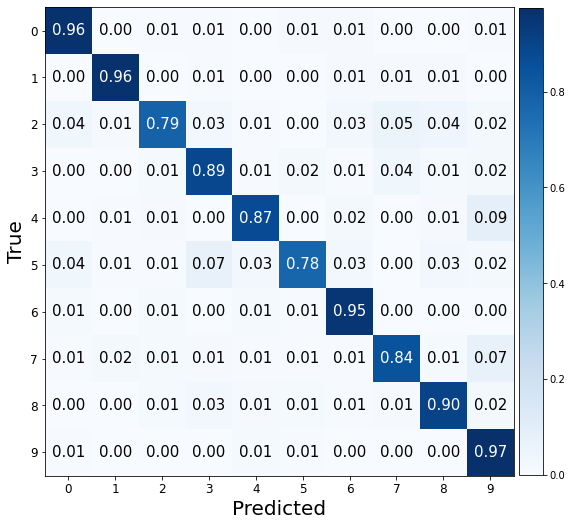

###################

ne: 100, hd:100, wd:0.1, lr: 0.01, bs:720 
Valid Evaluation loss: 0.3335813581943512. f1:0.896508856918339 acc: 0.8970000147819519 


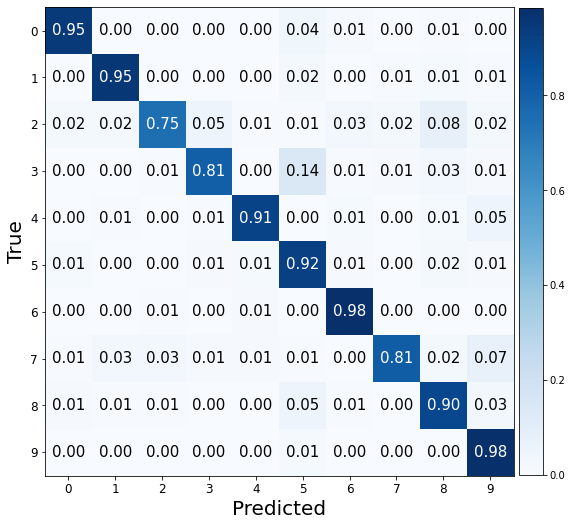

###################

ne: 100, hd:50, wd:0.001, lr: 0.0001, bs:1024 
Valid Evaluation loss: 1.1799554824829102. f1:0.6293896811523545 acc: 0.6294999718666077 


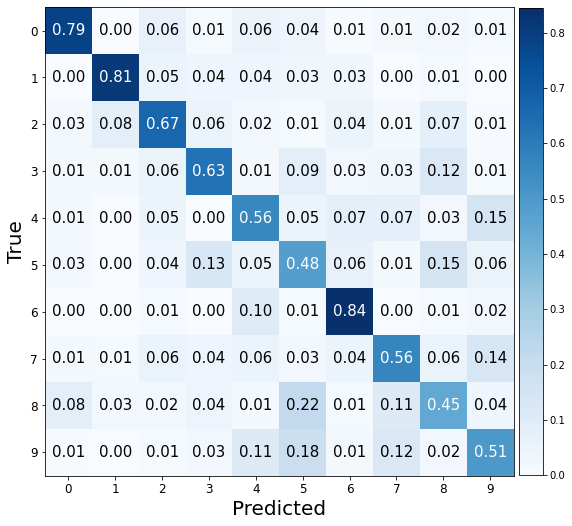

###################

ne: 100, hd:80, wd:0.001, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.6253120303153992. f1:0.8201447741391459 acc: 0.8215000033378601 


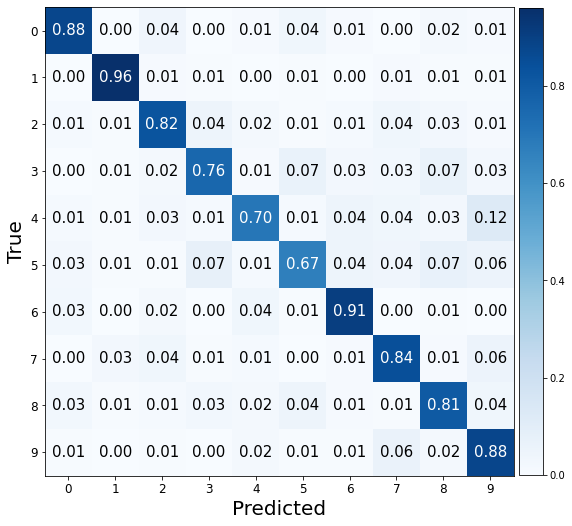

###################

ne: 100, hd:100, wd:0.001, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.7117215991020203. f1:0.7893867414277174 acc: 0.7894999980926514 


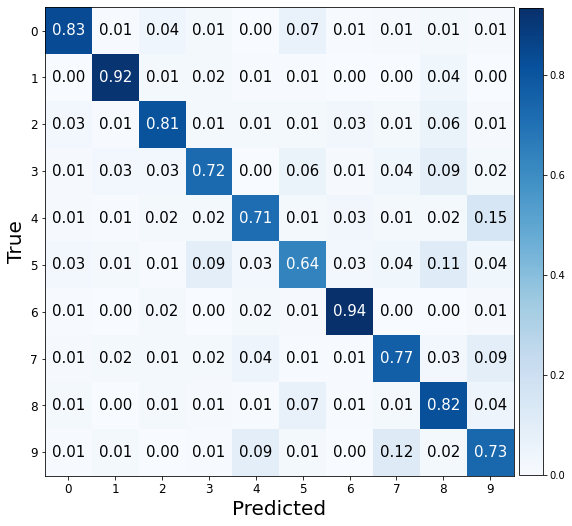

###################

ne: 100, hd:50, wd:0.01, lr: 0.0001, bs:1024 
Valid Evaluation loss: 1.1730600595474243. f1:0.6928439421900203 acc: 0.6955000162124634 


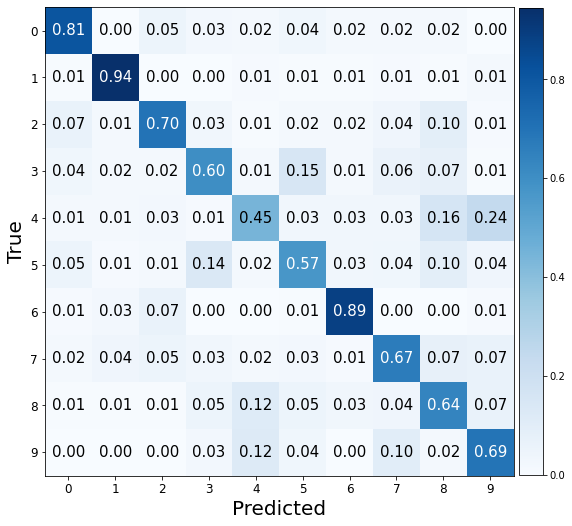

###################

ne: 100, hd:80, wd:0.01, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.6462537050247192. f1:0.8163894066033031 acc: 0.8169999718666077 


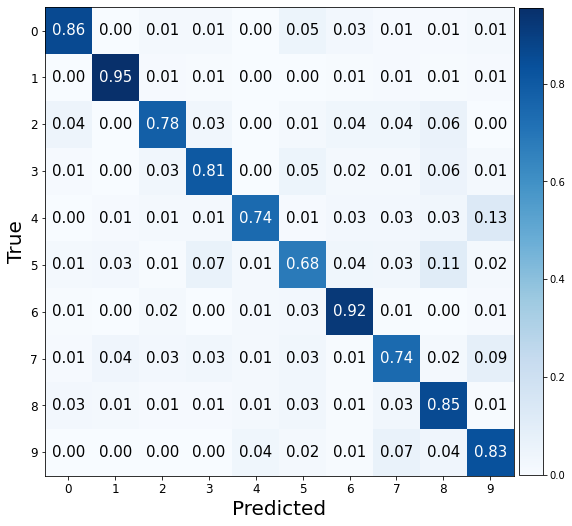

###################

ne: 100, hd:100, wd:0.01, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.8044769167900085. f1:0.7823007589549267 acc: 0.7829999923706055 


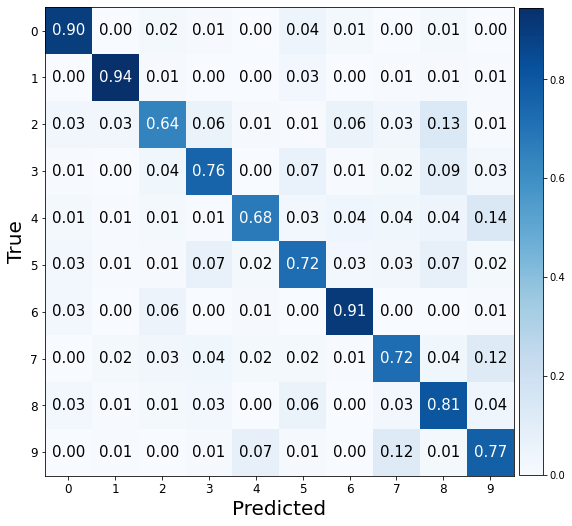

###################

ne: 100, hd:50, wd:0.1, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.861941933631897. f1:0.7495944109605966 acc: 0.7509999871253967 


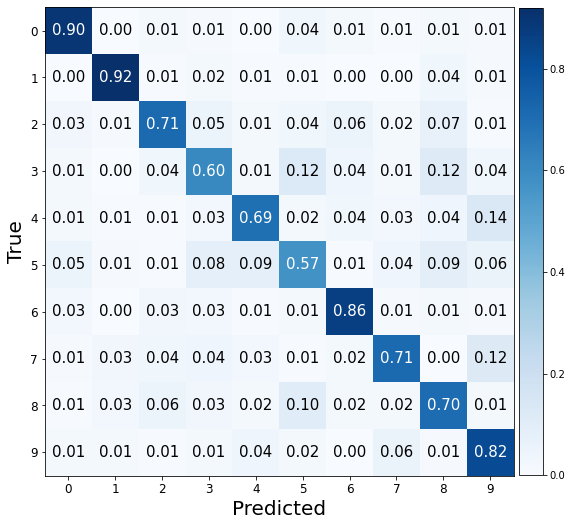

###################

ne: 100, hd:80, wd:0.1, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.7662457227706909. f1:0.7757030257258941 acc: 0.7760000228881836 


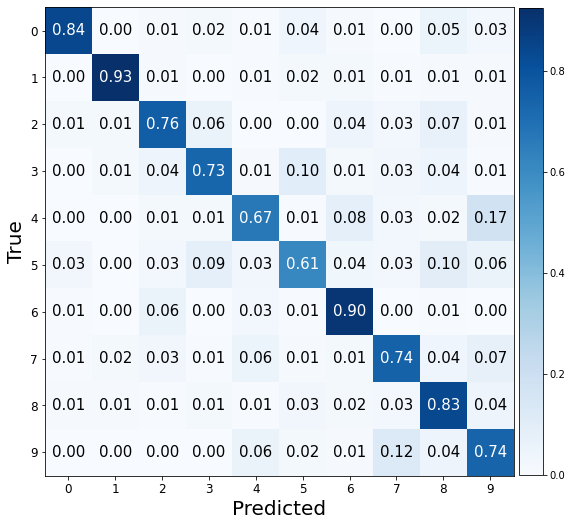

###################

ne: 100, hd:100, wd:0.1, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.6971989274024963. f1:0.8059942716163917 acc: 0.8065000176429749 


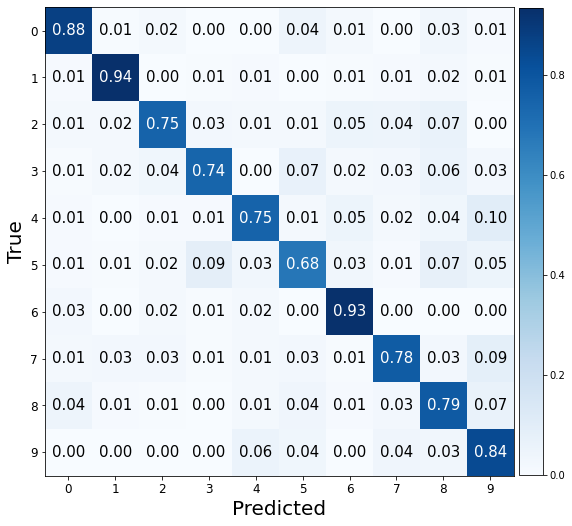

###################

ne: 100, hd:50, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.4562990367412567. f1:0.8705520756439371 acc: 0.8705000281333923 


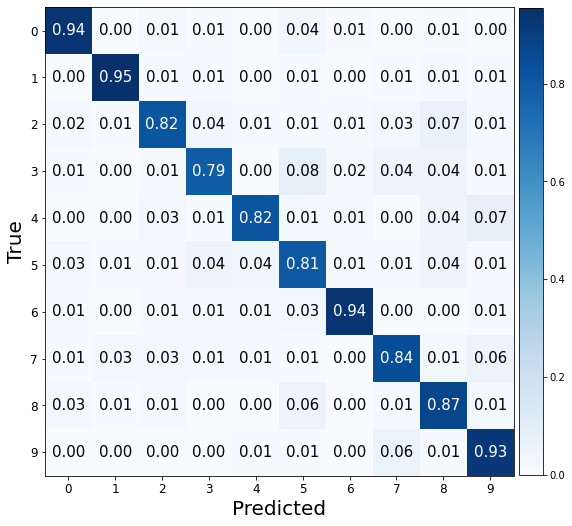

###################

ne: 100, hd:80, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.3423232138156891. f1:0.911498148660151 acc: 0.9114999771118164 


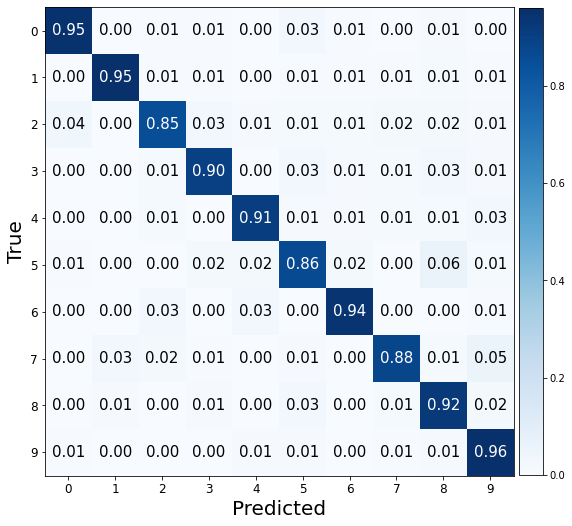

###################

ne: 100, hd:100, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.36665213108062744. f1:0.9032843549269856 acc: 0.9035000205039978 


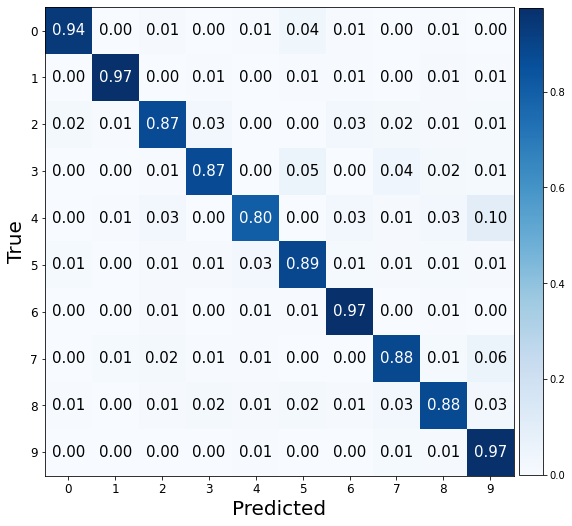

###################

ne: 100, hd:50, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.39683231711387634. f1:0.8893179426680554 acc: 0.8895000219345093 


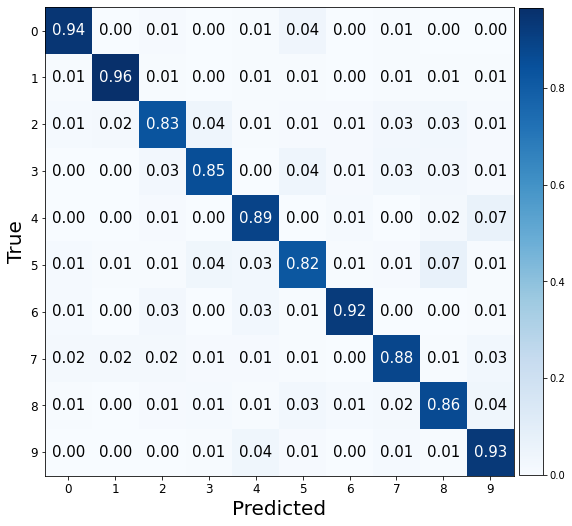

###################

ne: 100, hd:80, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.32694360613822937. f1:0.9045348705435291 acc: 0.9045000076293945 


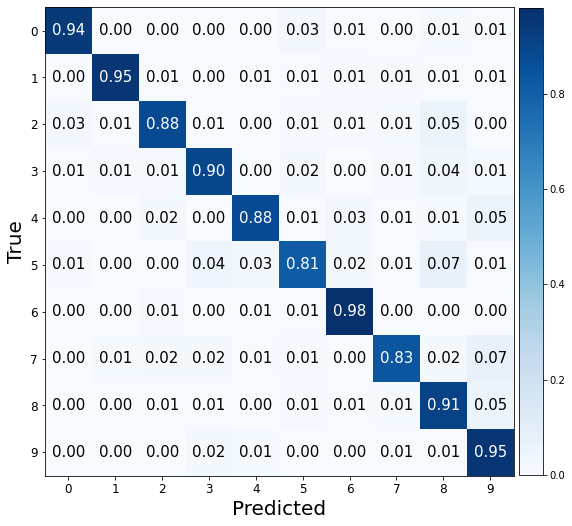

###################

ne: 100, hd:100, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.3664577305316925. f1:0.9047144978768389 acc: 0.9049999713897705 


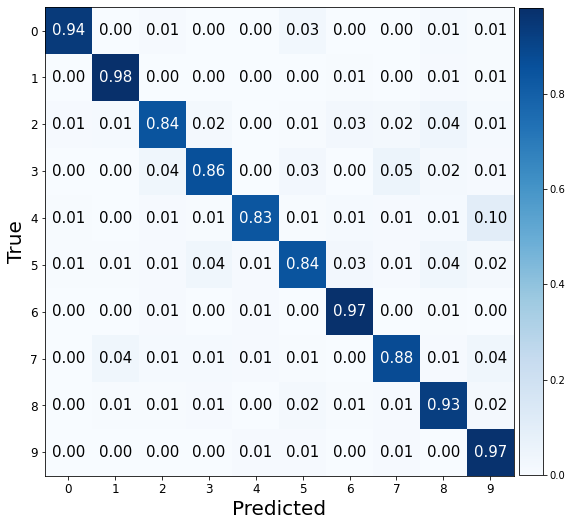

###################

ne: 100, hd:50, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.3529438376426697. f1:0.8956574077920154 acc: 0.8960000276565552 


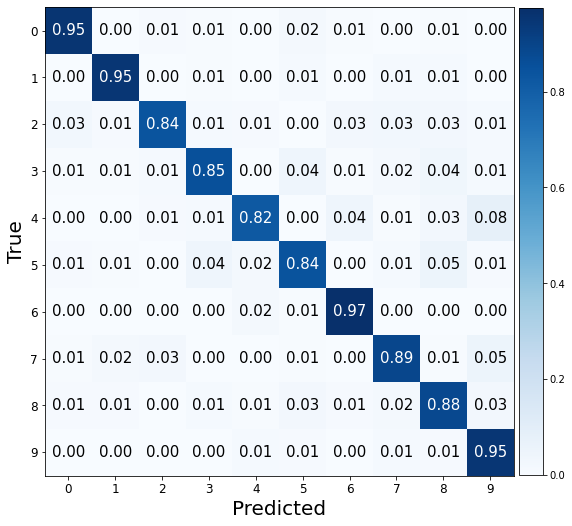

###################

ne: 100, hd:80, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.25253763794898987. f1:0.9250100037783641 acc: 0.925000011920929 


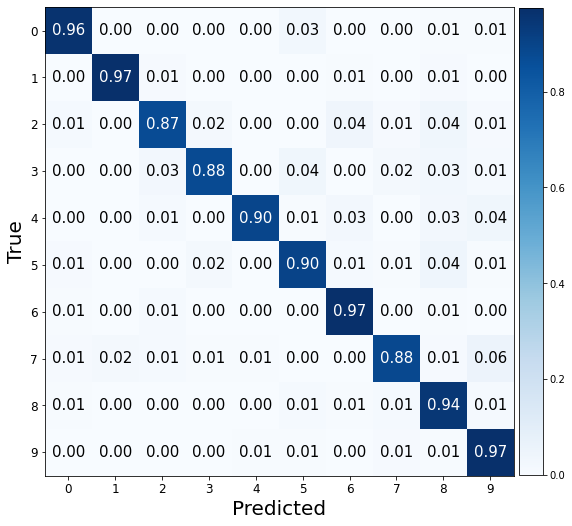

###################

ne: 100, hd:100, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.2945495545864105. f1:0.9140139484398558 acc: 0.9139999747276306 


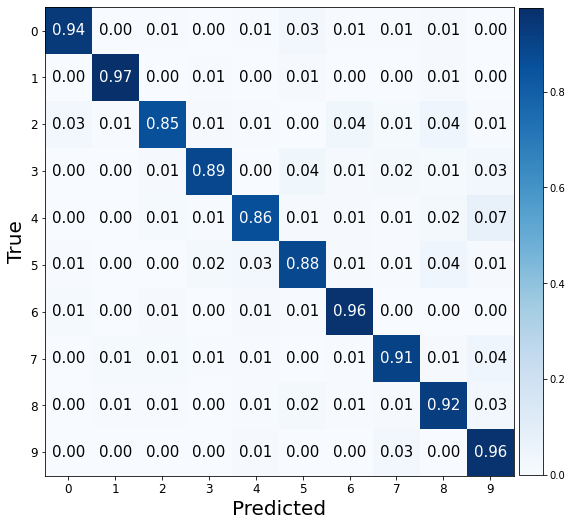

###################

ne: 100, hd:50, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.7293241024017334. f1:0.7721413713139885 acc: 0.7764999866485596 


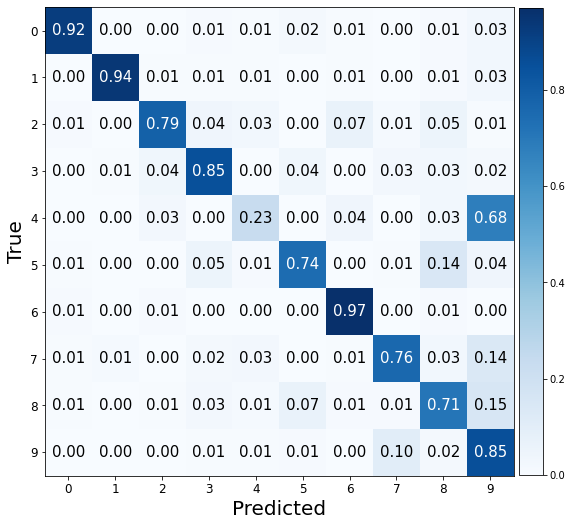

###################

ne: 100, hd:80, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.6925280690193176. f1:0.8385718621465715 acc: 0.8349999785423279 


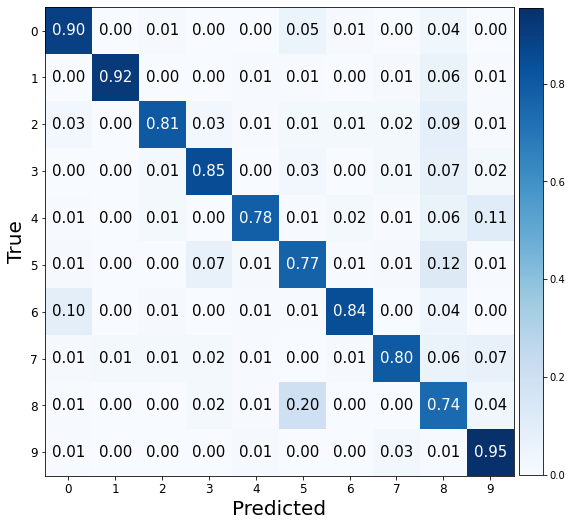

###################

ne: 100, hd:100, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.7583134174346924. f1:0.790300581967942 acc: 0.7929999828338623 


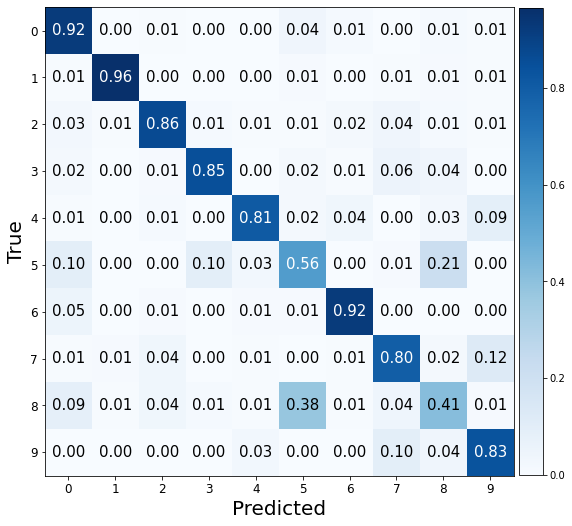

###################

ne: 100, hd:50, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.48581740260124207. f1:0.8533083906794886 acc: 0.8535000085830688 


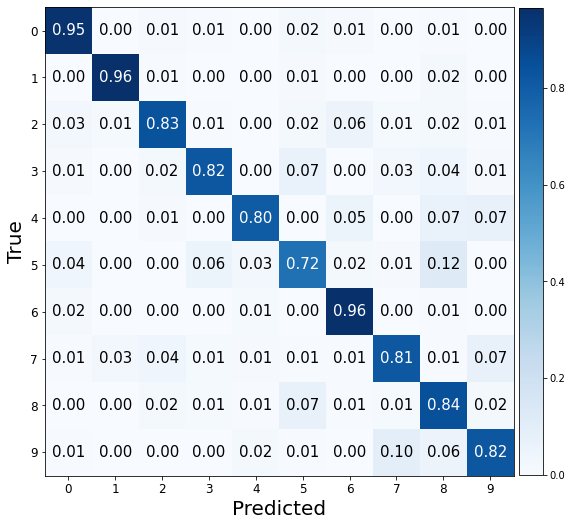

###################

ne: 100, hd:80, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.4567081928253174. f1:0.3954233372268573 acc: 0.44749999046325684 


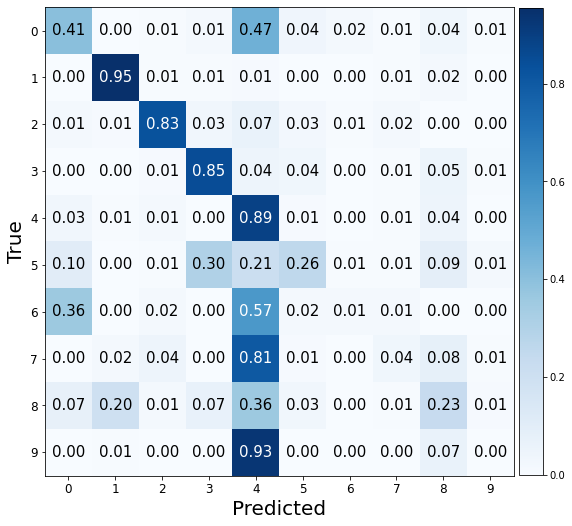

###################

ne: 100, hd:100, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.5996139645576477. f1:0.8306776922195926 acc: 0.8305000066757202 


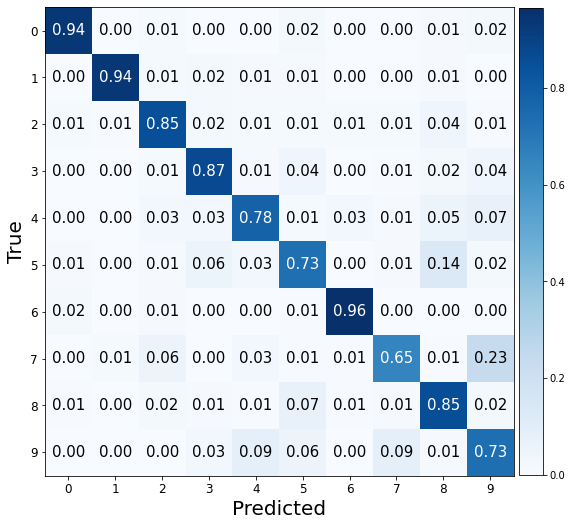

###################

ne: 100, hd:50, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.48983949422836304. f1:0.844600711022194 acc: 0.8454999923706055 


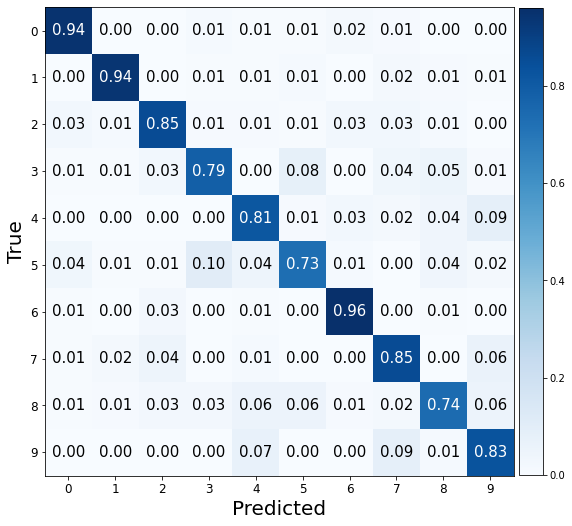

###################

ne: 100, hd:80, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.27401334047317505. f1:0.9089846260232786 acc: 0.9089999794960022 


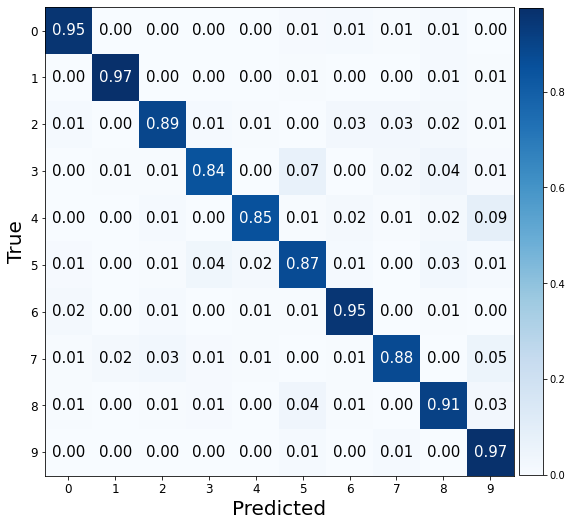

###################

ne: 100, hd:100, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.3528585731983185. f1:0.8929894582659825 acc: 0.8930000066757202 


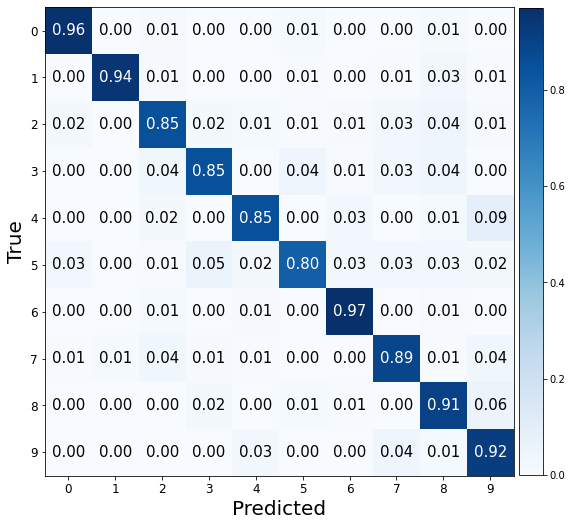

###################

ne: 150, hd:50, wd:0.001, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.6245266795158386. f1:0.8176655037470087 acc: 0.8180000185966492 


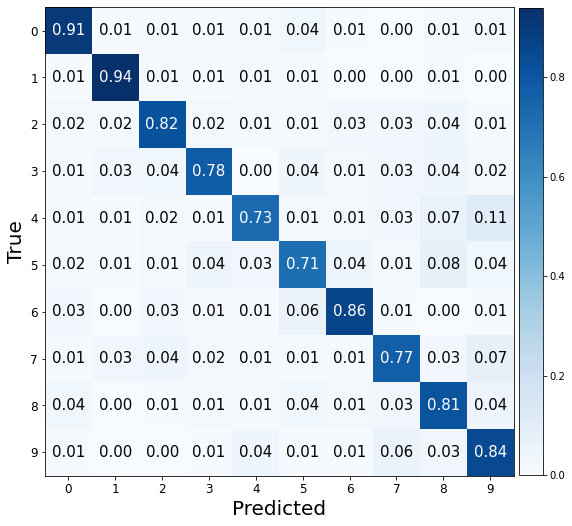

###################

ne: 150, hd:80, wd:0.001, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.580359935760498. f1:0.8342126093545446 acc: 0.8345000147819519 


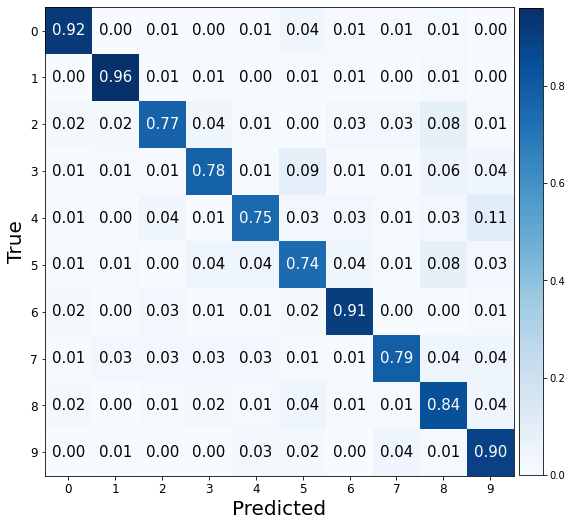

###################

ne: 150, hd:100, wd:0.001, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.5991889238357544. f1:0.8351003842906299 acc: 0.8355000019073486 


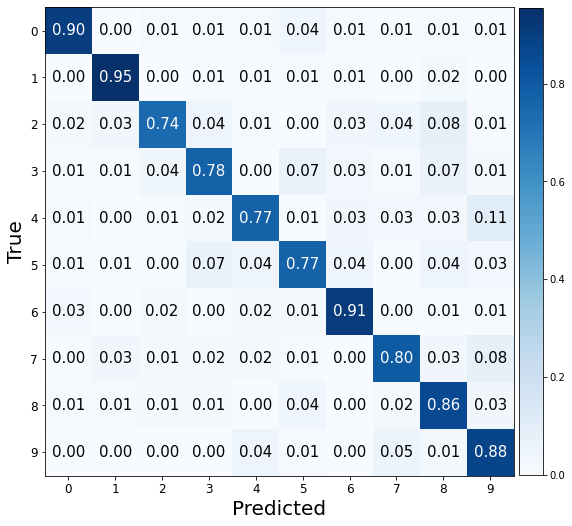

###################

ne: 150, hd:50, wd:0.01, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.6660103797912598. f1:0.8145791553147592 acc: 0.8140000104904175 


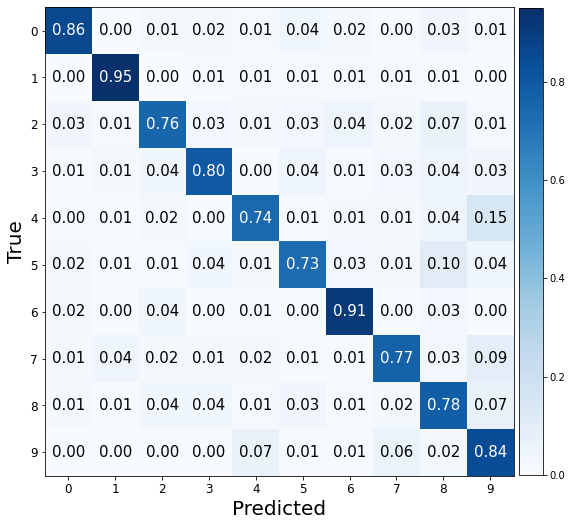

###################

ne: 150, hd:80, wd:0.01, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.6737351417541504. f1:0.8129086786964741 acc: 0.8130000233650208 


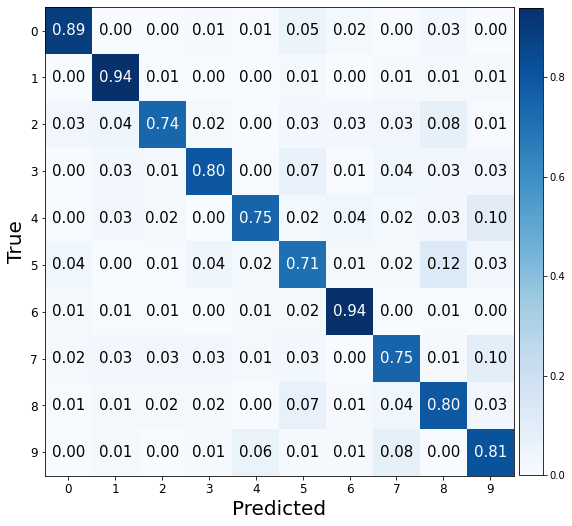

###################

ne: 150, hd:100, wd:0.01, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.516491174697876. f1:0.8604891045137743 acc: 0.8610000014305115 


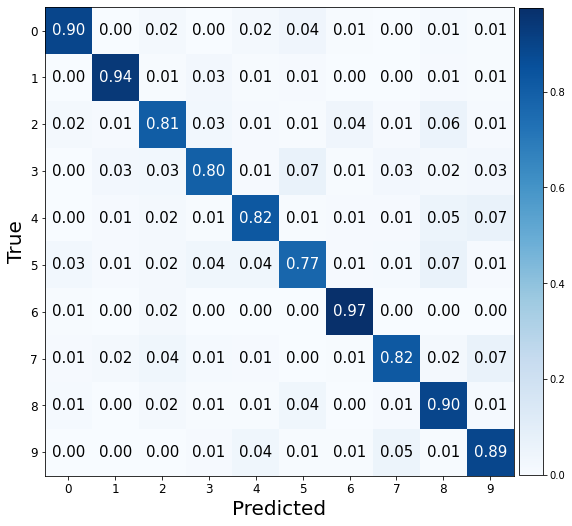

###################

ne: 150, hd:50, wd:0.1, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.7685127854347229. f1:0.7662595388000779 acc: 0.7674999833106995 


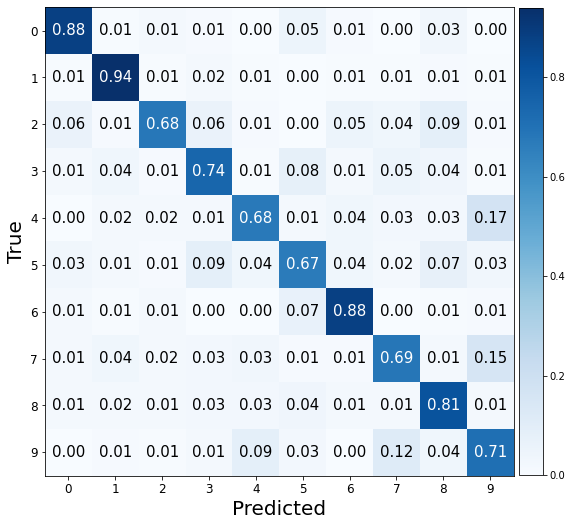

###################

ne: 150, hd:80, wd:0.1, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.6684151887893677. f1:0.8196711537659876 acc: 0.8199999928474426 


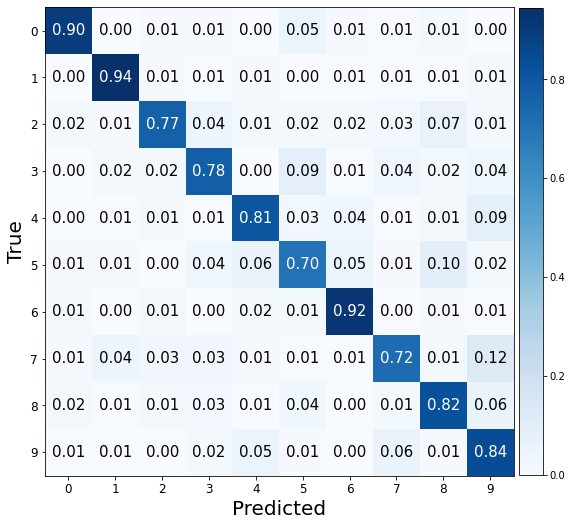

###################

ne: 150, hd:100, wd:0.1, lr: 0.0001, bs:400 
Valid Evaluation loss: 0.507986843585968. f1:0.8574077131249659 acc: 0.8579999804496765 


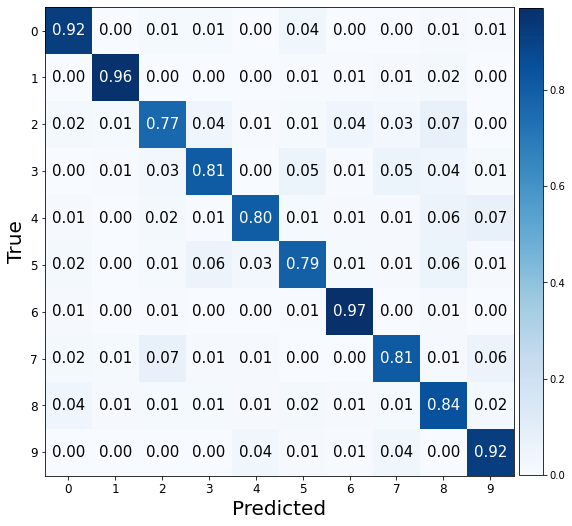

###################

ne: 150, hd:50, wd:0.001, lr: 0.001, bs:400 
Valid Evaluation loss: 0.37668582797050476. f1:0.8987730704851129 acc: 0.8989999890327454 


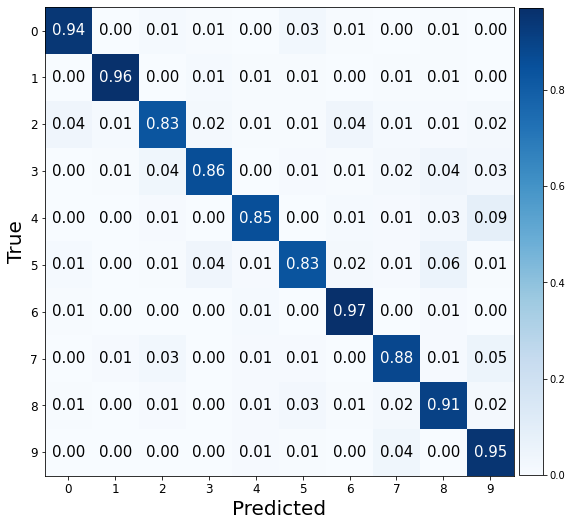

###################

ne: 150, hd:80, wd:0.001, lr: 0.001, bs:400 
Valid Evaluation loss: 0.3501075208187103. f1:0.9169479267151004 acc: 0.9169999957084656 


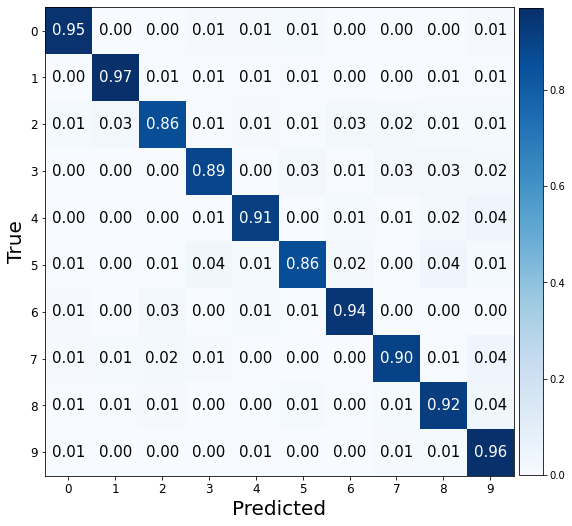

###################

ne: 150, hd:100, wd:0.001, lr: 0.001, bs:400 
Valid Evaluation loss: 0.387445867061615. f1:0.9123101236023409 acc: 0.9125000238418579 


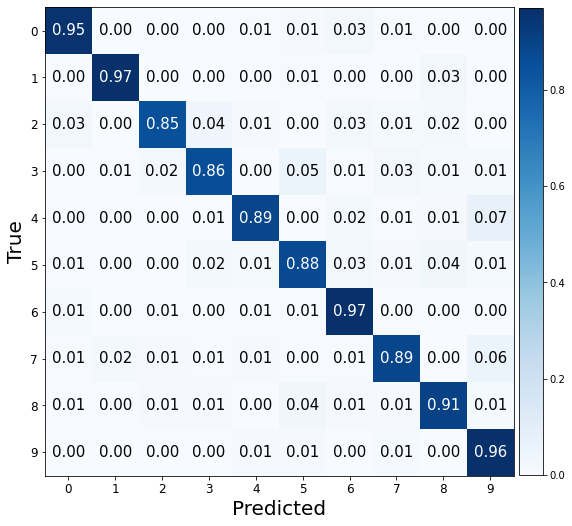

###################

ne: 150, hd:50, wd:0.01, lr: 0.001, bs:400 
Valid Evaluation loss: 0.38813573122024536. f1:0.9002042252214414 acc: 0.9004999995231628 


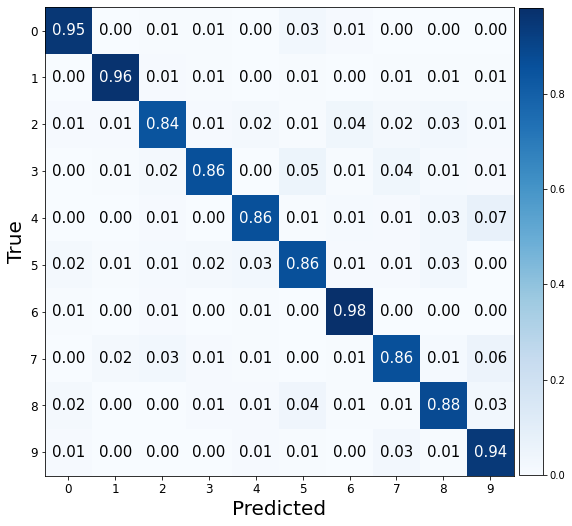

###################

ne: 150, hd:80, wd:0.01, lr: 0.001, bs:400 
Valid Evaluation loss: 0.2948547899723053. f1:0.9138680724721343 acc: 0.9139999747276306 


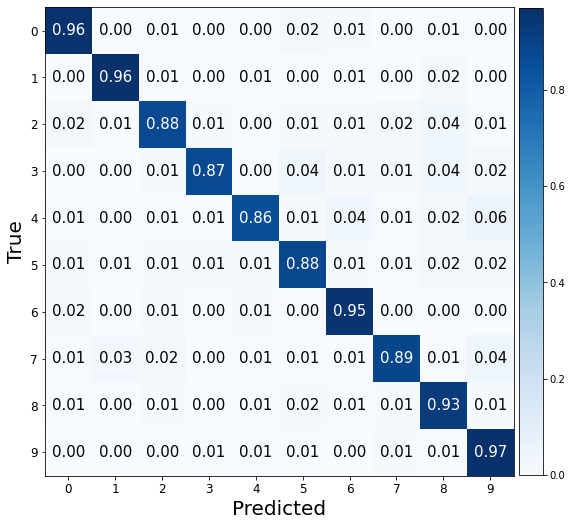

###################

ne: 150, hd:100, wd:0.01, lr: 0.001, bs:400 
Valid Evaluation loss: 0.3024848997592926. f1:0.9184304617867873 acc: 0.9185000061988831 


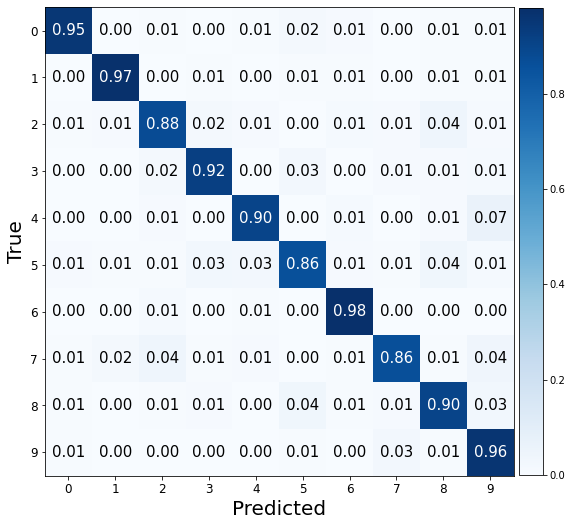

###################

ne: 150, hd:50, wd:0.1, lr: 0.001, bs:400 
Valid Evaluation loss: 0.28226983547210693. f1:0.9177301571921264 acc: 0.9179999828338623 


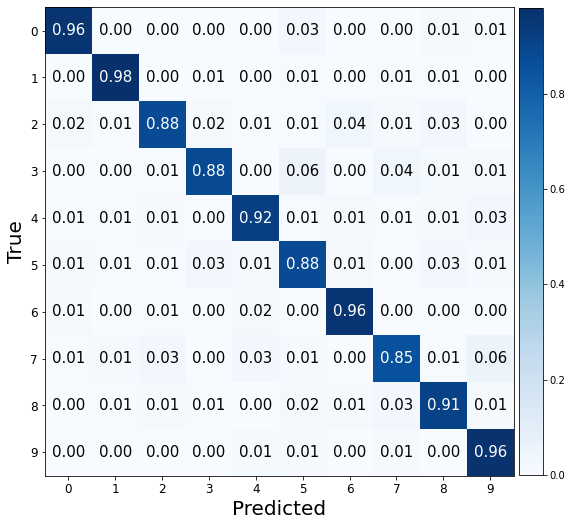

###################

ne: 150, hd:80, wd:0.1, lr: 0.001, bs:400 
Valid Evaluation loss: 0.3345794975757599. f1:0.9012414534543932 acc: 0.9014999866485596 


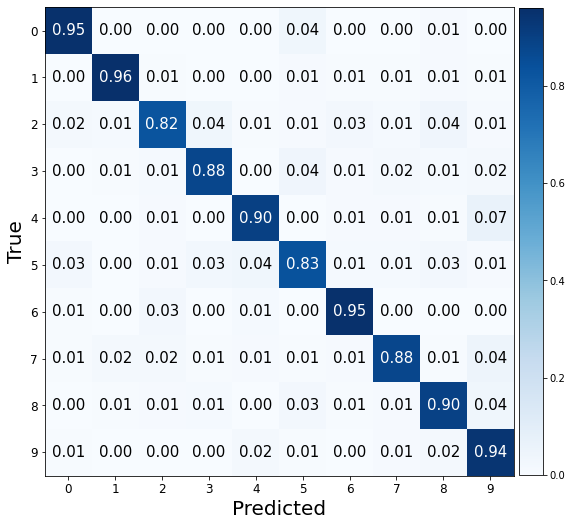

###################

ne: 150, hd:100, wd:0.1, lr: 0.001, bs:400 
Valid Evaluation loss: 0.25300291180610657. f1:0.9150597272088804 acc: 0.9150000214576721 


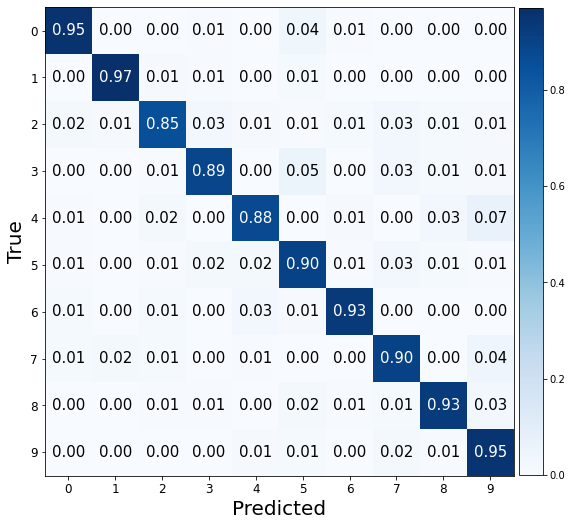

###################

ne: 150, hd:50, wd:0.001, lr: 0.01, bs:400 
Valid Evaluation loss: 0.5893850922584534. f1:0.8445765862689187 acc: 0.843999981880188 


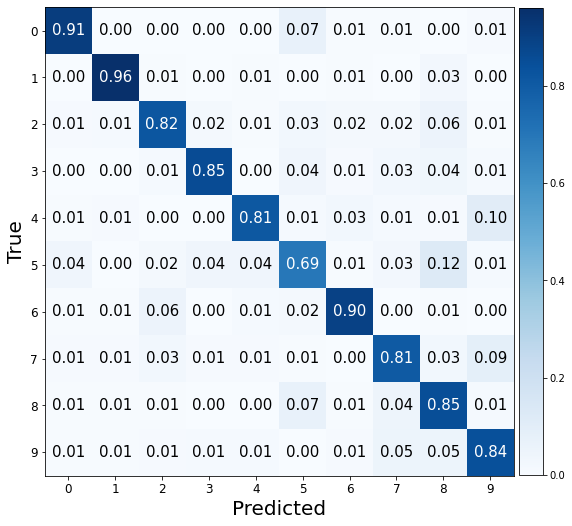

###################

ne: 150, hd:80, wd:0.001, lr: 0.01, bs:400 
Valid Evaluation loss: 0.5068372488021851. f1:0.8779264879902691 acc: 0.8784999847412109 


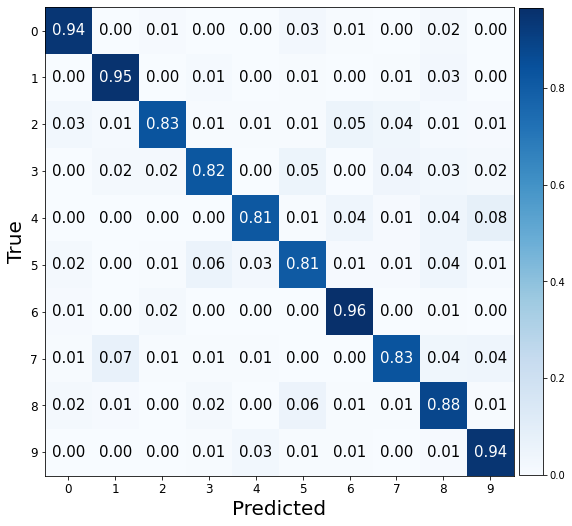

###################

ne: 150, hd:100, wd:0.001, lr: 0.01, bs:400 
Valid Evaluation loss: 0.5002703070640564. f1:0.8978338354403513 acc: 0.8980000019073486 


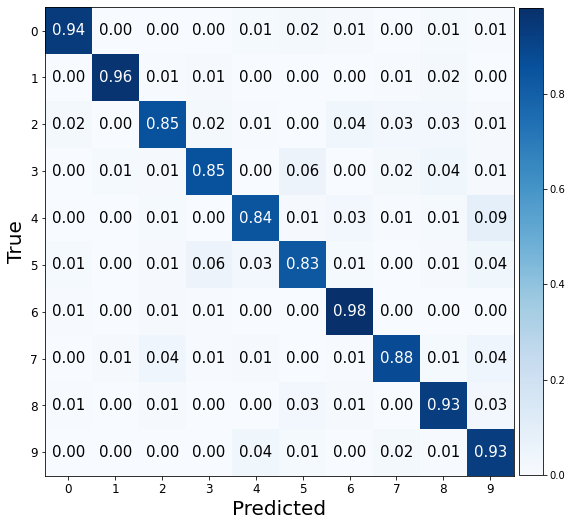

###################

ne: 150, hd:50, wd:0.01, lr: 0.01, bs:400 
Valid Evaluation loss: 0.5243971943855286. f1:0.8701160861311372 acc: 0.8700000047683716 


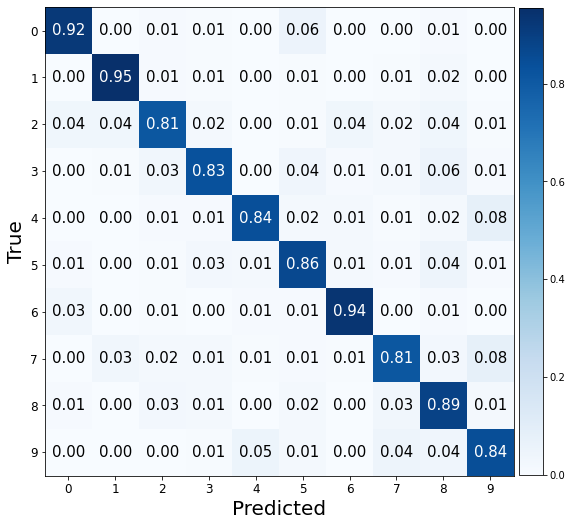

###################

ne: 150, hd:80, wd:0.01, lr: 0.01, bs:400 
Valid Evaluation loss: 0.49907511472702026. f1:0.8929731951627475 acc: 0.8930000066757202 


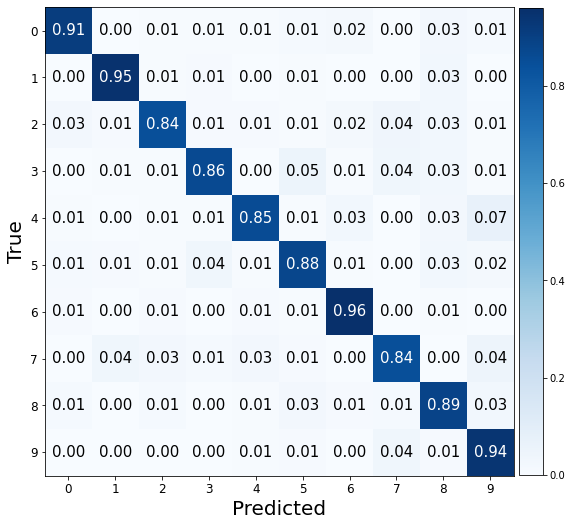

###################

ne: 150, hd:100, wd:0.01, lr: 0.01, bs:400 
Valid Evaluation loss: 0.5411670207977295. f1:0.8815462117643704 acc: 0.8820000290870667 


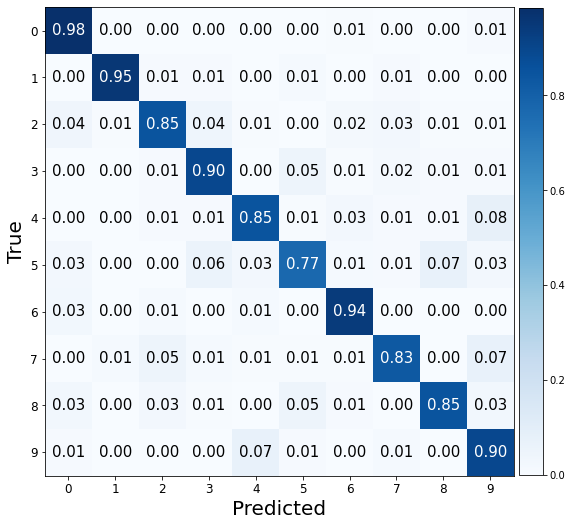

###################

ne: 150, hd:50, wd:0.1, lr: 0.01, bs:400 
Valid Evaluation loss: 0.4305088222026825. f1:0.8715846647960035 acc: 0.8725000023841858 


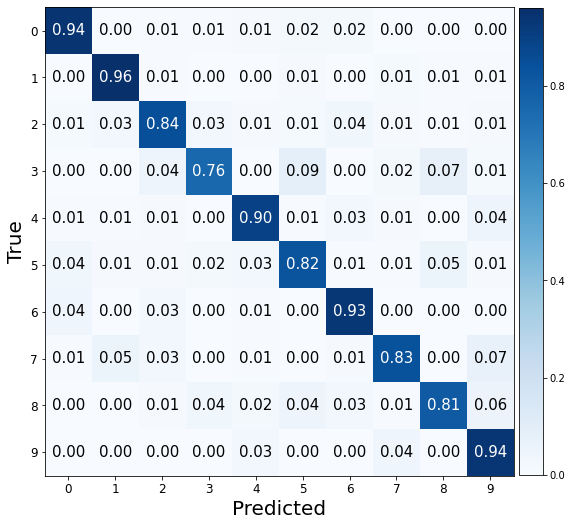

###################

ne: 150, hd:80, wd:0.1, lr: 0.01, bs:400 
Valid Evaluation loss: 0.2934613823890686. f1:0.909694200320974 acc: 0.9100000262260437 


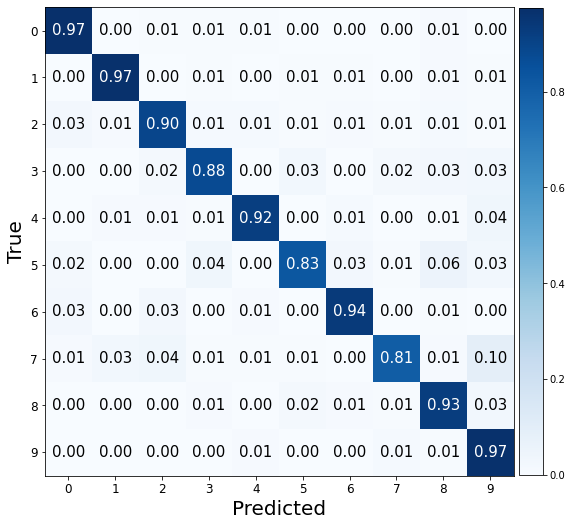

###################

ne: 150, hd:100, wd:0.1, lr: 0.01, bs:400 
Valid Evaluation loss: 0.3977096676826477. f1:0.8730515592913894 acc: 0.8730000257492065 


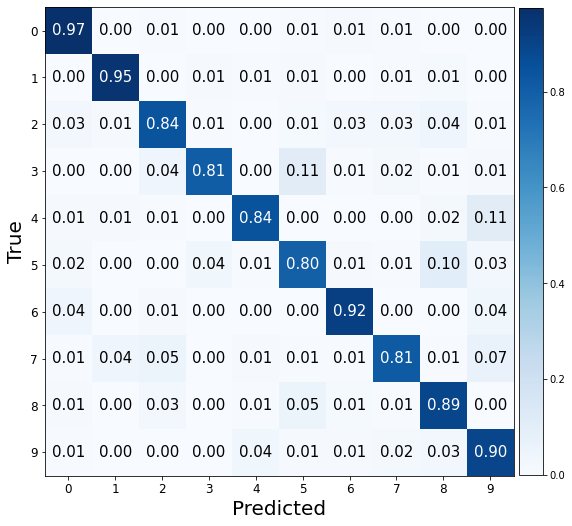

###################

ne: 150, hd:50, wd:0.001, lr: 0.0001, bs:720 
Valid Evaluation loss: 0.6576545238494873. f1:0.8066730585988298 acc: 0.8065000176429749 


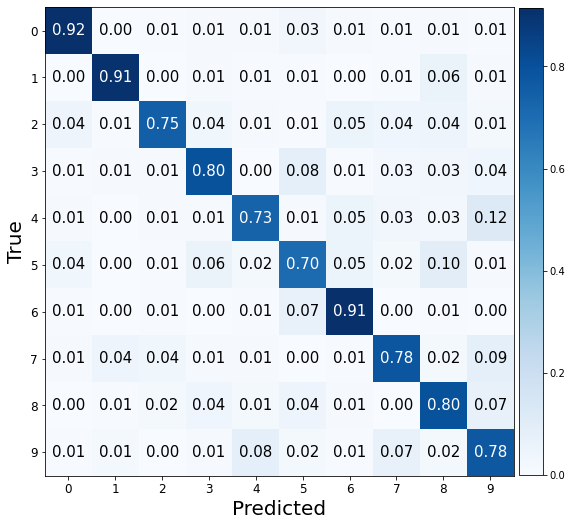

###################

ne: 150, hd:80, wd:0.001, lr: 0.0001, bs:720 
Valid Evaluation loss: 0.6616472005844116. f1:0.8290091596651136 acc: 0.8289999961853027 


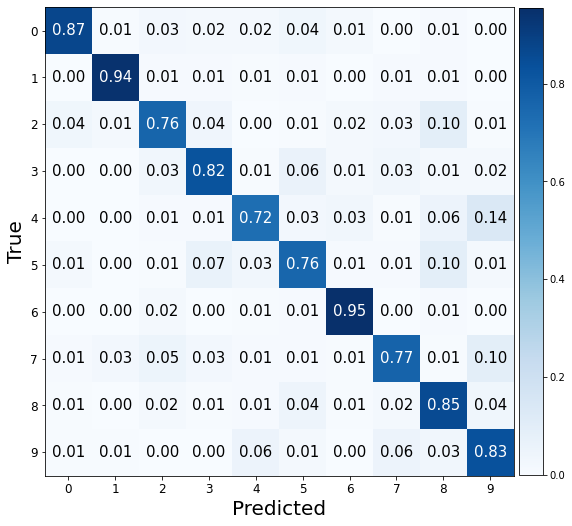

###################

ne: 150, hd:100, wd:0.001, lr: 0.0001, bs:720 
Valid Evaluation loss: 0.496031254529953. f1:0.8557816554625493 acc: 0.8560000061988831 


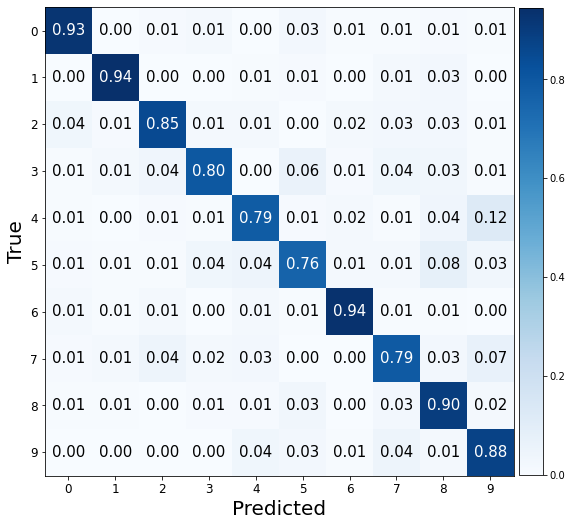

###################

ne: 150, hd:50, wd:0.01, lr: 0.0001, bs:720 
Valid Evaluation loss: 0.7319880723953247. f1:0.8012208523541802 acc: 0.8019999861717224 


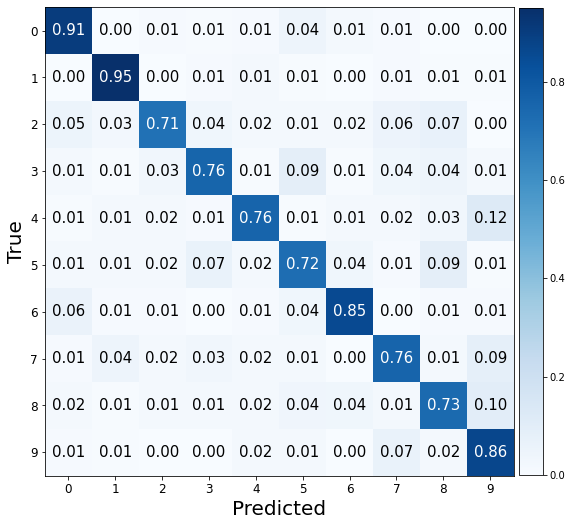

###################

ne: 150, hd:80, wd:0.01, lr: 0.0001, bs:720 
Valid Evaluation loss: 0.5956707000732422. f1:0.8324956418532199 acc: 0.8324999809265137 


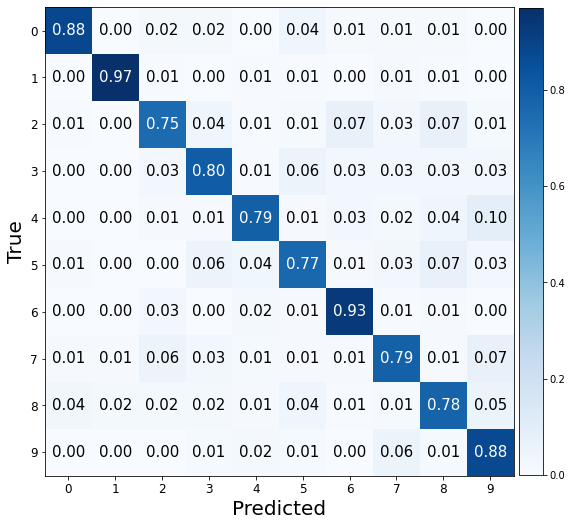

###################

ne: 150, hd:100, wd:0.01, lr: 0.0001, bs:720 
Valid Evaluation loss: 0.6247559785842896. f1:0.8206349640901596 acc: 0.8205000162124634 


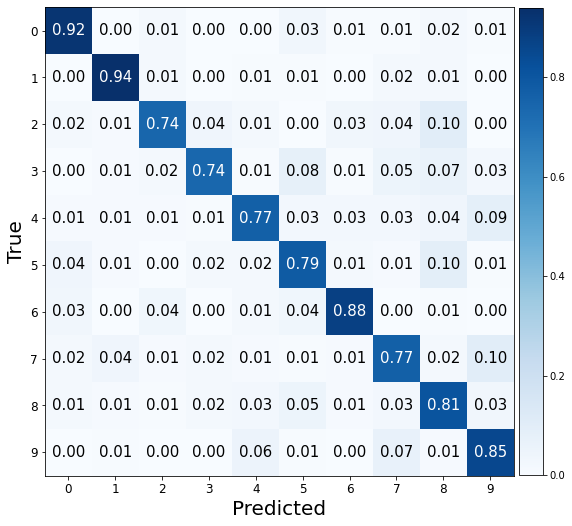

###################

ne: 150, hd:50, wd:0.1, lr: 0.0001, bs:720 
Valid Evaluation loss: 0.7490535378456116. f1:0.7775866130051686 acc: 0.777999997138977 


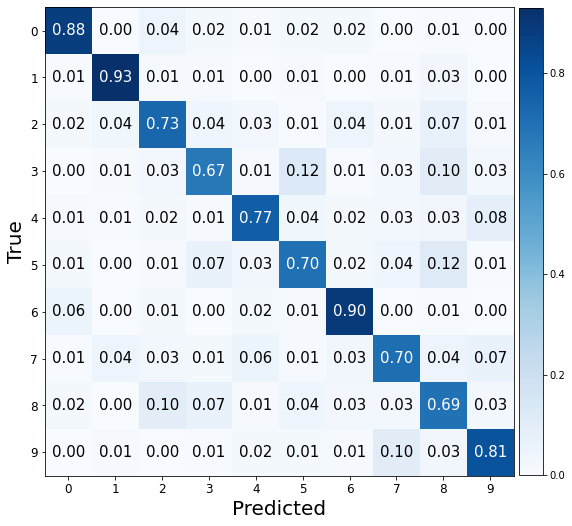

###################

ne: 150, hd:80, wd:0.1, lr: 0.0001, bs:720 
Valid Evaluation loss: 0.5047319531440735. f1:0.8519835361206438 acc: 0.8519999980926514 


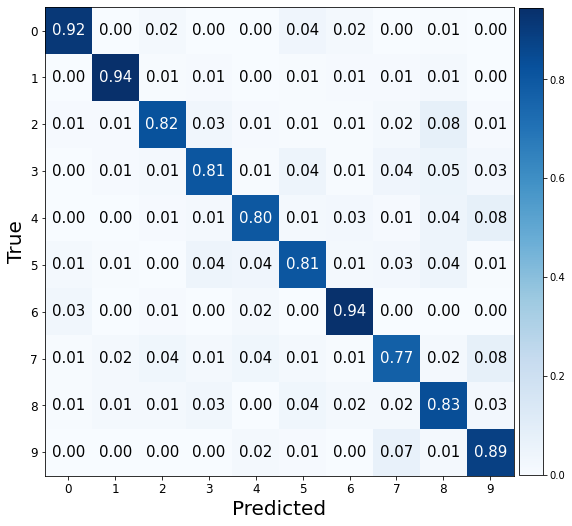

###################

ne: 150, hd:100, wd:0.1, lr: 0.0001, bs:720 
Valid Evaluation loss: 0.5911549925804138. f1:0.8306247745496218 acc: 0.8305000066757202 


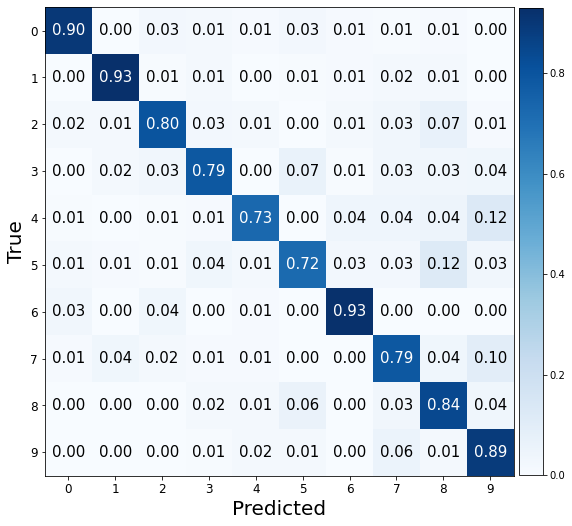

###################

ne: 150, hd:50, wd:0.001, lr: 0.001, bs:720 
Valid Evaluation loss: 0.41624829173088074. f1:0.8992736383957352 acc: 0.8995000123977661 


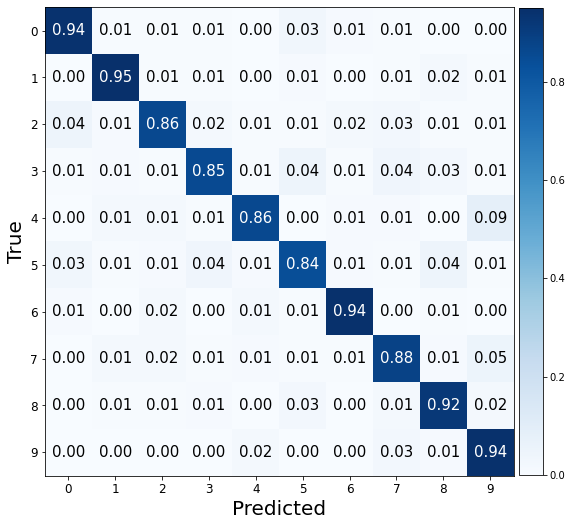

###################

ne: 150, hd:80, wd:0.001, lr: 0.001, bs:720 
Valid Evaluation loss: 0.35543474555015564. f1:0.9105331110560357 acc: 0.9110000133514404 


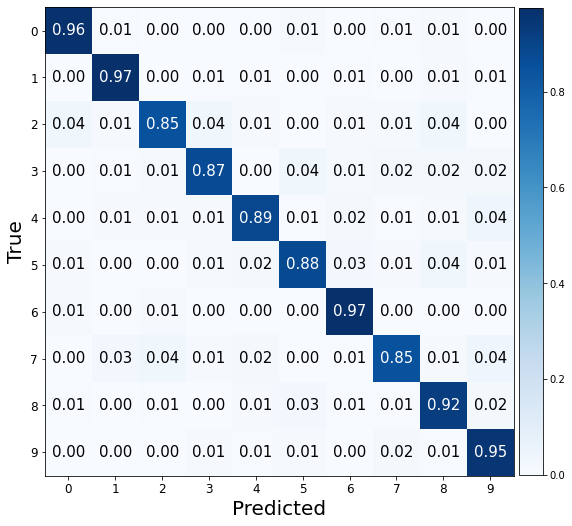

###################

ne: 150, hd:100, wd:0.001, lr: 0.001, bs:720 
Valid Evaluation loss: 0.3484794497489929. f1:0.9128982088554345 acc: 0.9129999876022339 


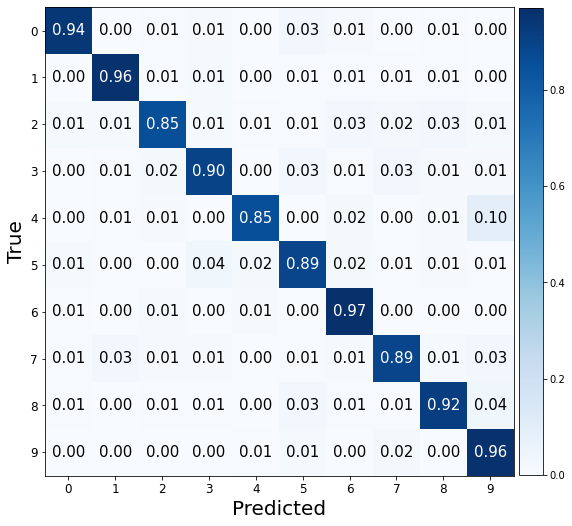

###################

ne: 150, hd:50, wd:0.01, lr: 0.001, bs:720 
Valid Evaluation loss: 0.3863210678100586. f1:0.9058449852555226 acc: 0.906000018119812 


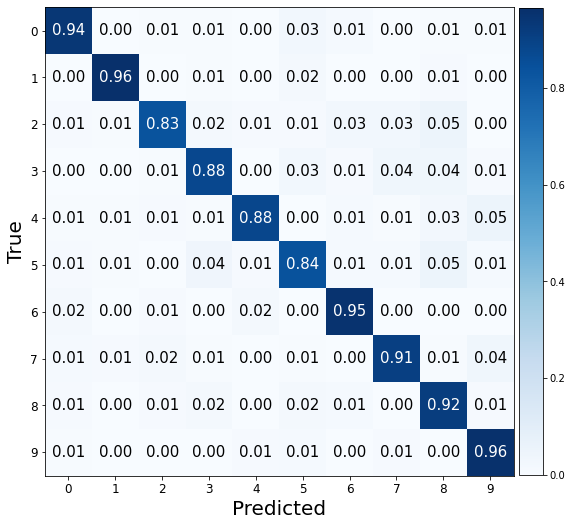

###################

ne: 150, hd:80, wd:0.01, lr: 0.001, bs:720 
Valid Evaluation loss: 0.2949411869049072. f1:0.9242800959134859 acc: 0.9244999885559082 


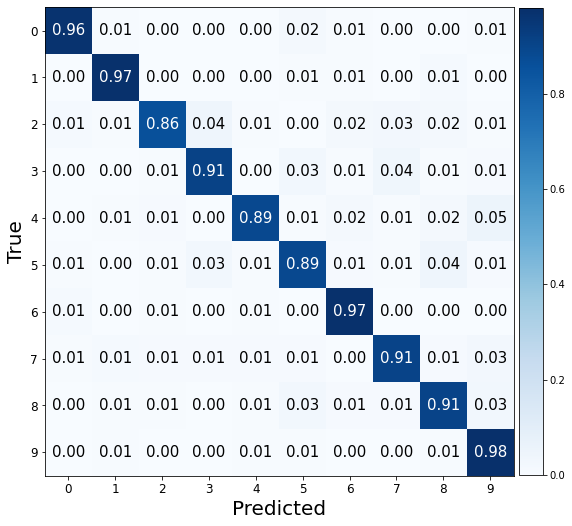

###################

ne: 150, hd:100, wd:0.01, lr: 0.001, bs:720 
Valid Evaluation loss: 0.30134961009025574. f1:0.9192685864046398 acc: 0.9194999933242798 


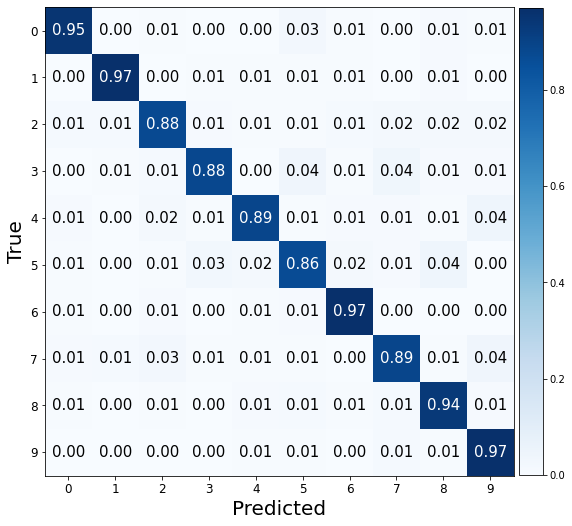

###################

ne: 150, hd:50, wd:0.1, lr: 0.001, bs:720 
Valid Evaluation loss: 0.3217107057571411. f1:0.9036665162123484 acc: 0.9039999842643738 


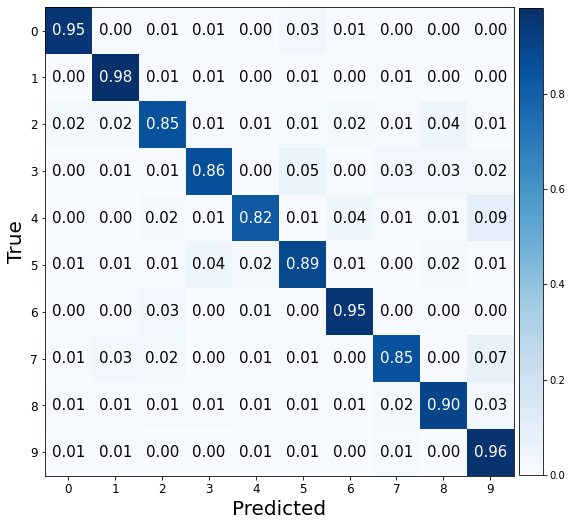

###################

ne: 150, hd:80, wd:0.1, lr: 0.001, bs:720 
Valid Evaluation loss: 0.2598385810852051. f1:0.9203453970248345 acc: 0.9204999804496765 


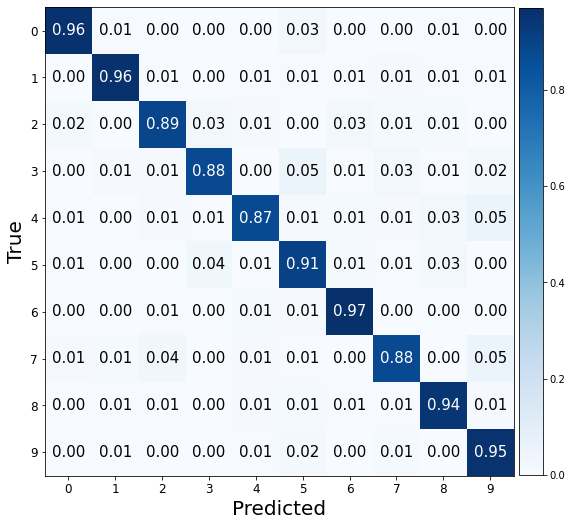

###################

ne: 150, hd:100, wd:0.1, lr: 0.001, bs:720 
Valid Evaluation loss: 0.2551754415035248. f1:0.918310974021065 acc: 0.9185000061988831 


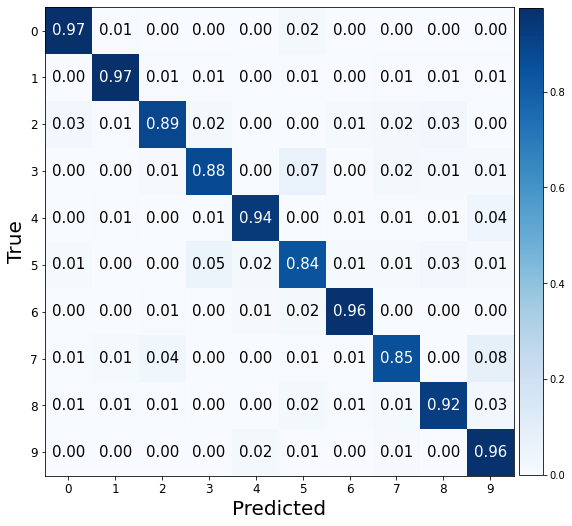

###################

ne: 150, hd:50, wd:0.001, lr: 0.01, bs:720 
Valid Evaluation loss: 0.6038214564323425. f1:0.859460890564228 acc: 0.859499990940094 


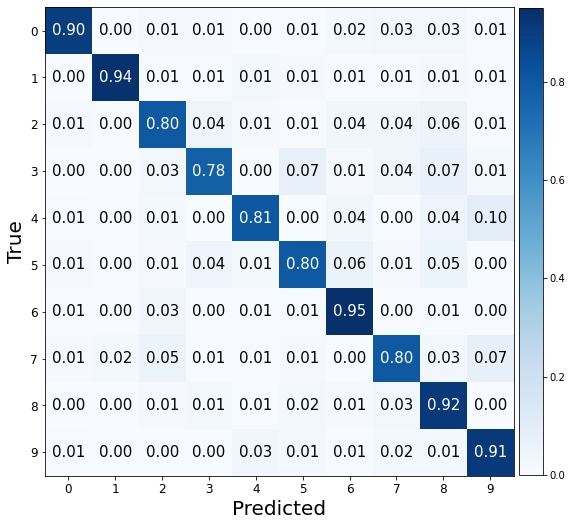

###################

ne: 150, hd:80, wd:0.001, lr: 0.01, bs:720 
Valid Evaluation loss: 1.6855429410934448. f1:0.2994767725666637 acc: 0.3675000071525574 


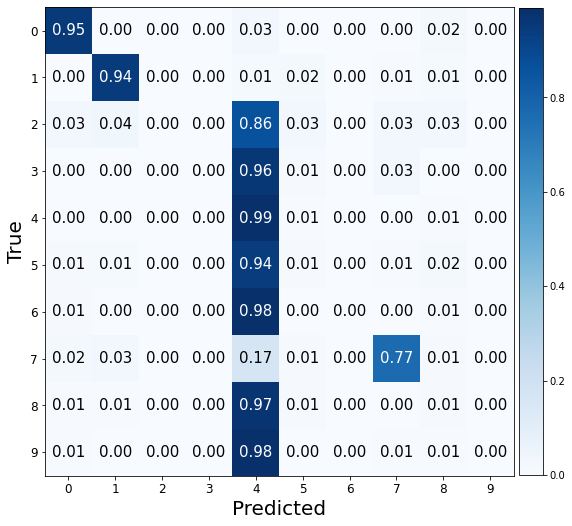

###################

ne: 150, hd:100, wd:0.001, lr: 0.01, bs:720 
Valid Evaluation loss: 0.5802325010299683. f1:0.87810468549755 acc: 0.8774999976158142 


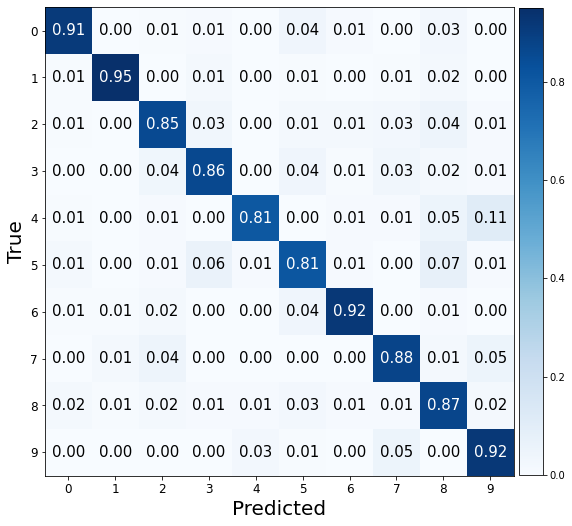

###################

ne: 150, hd:50, wd:0.01, lr: 0.01, bs:720 
Valid Evaluation loss: 0.4866310954093933. f1:0.8692265566190652 acc: 0.8700000047683716 


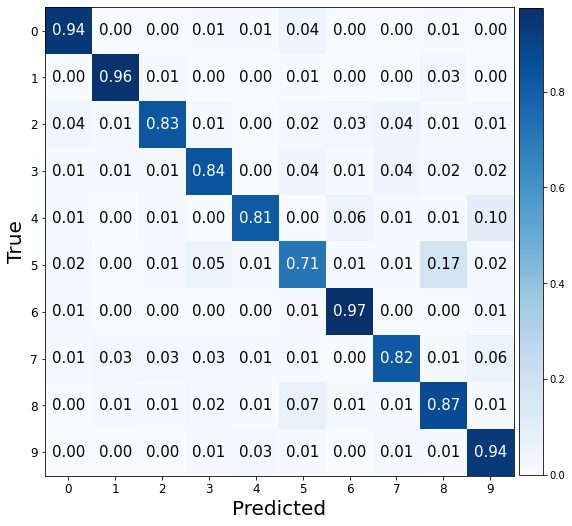

###################

ne: 150, hd:80, wd:0.01, lr: 0.01, bs:720 
Valid Evaluation loss: 1.3612748384475708. f1:0.3316560158514753 acc: 0.39800000190734863 


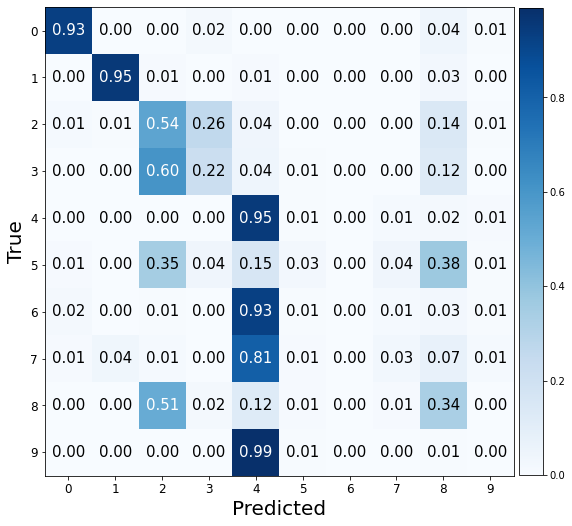

###################

ne: 150, hd:100, wd:0.01, lr: 0.01, bs:720 
Valid Evaluation loss: 0.5125443935394287. f1:0.8838776522485468 acc: 0.8840000033378601 


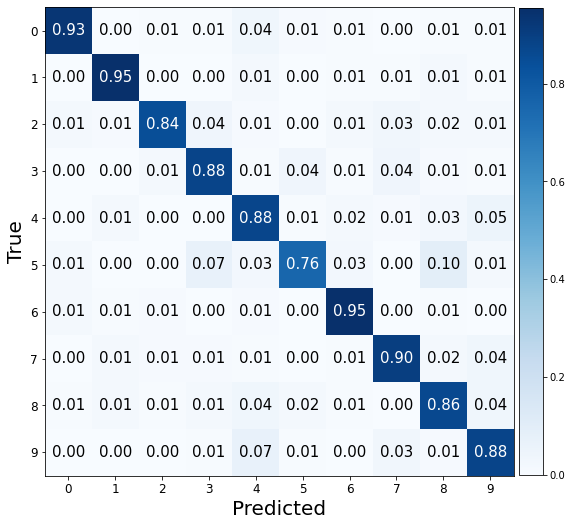

###################

ne: 150, hd:50, wd:0.1, lr: 0.01, bs:720 
Valid Evaluation loss: 0.4829207956790924. f1:0.8627963905995358 acc: 0.8634999990463257 


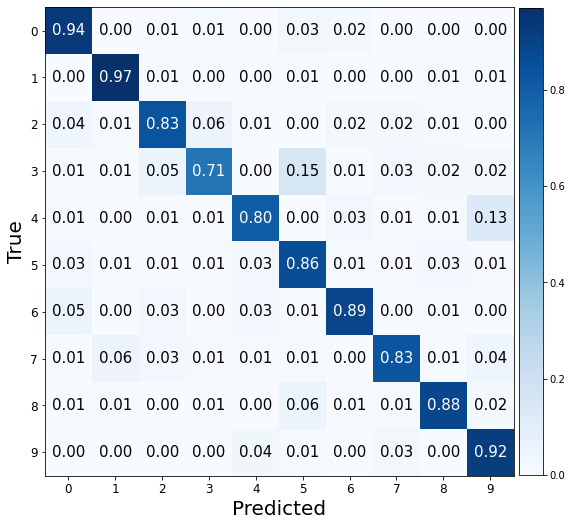

###################

ne: 150, hd:80, wd:0.1, lr: 0.01, bs:720 
Valid Evaluation loss: 0.3400100767612457. f1:0.895862810925992 acc: 0.8960000276565552 


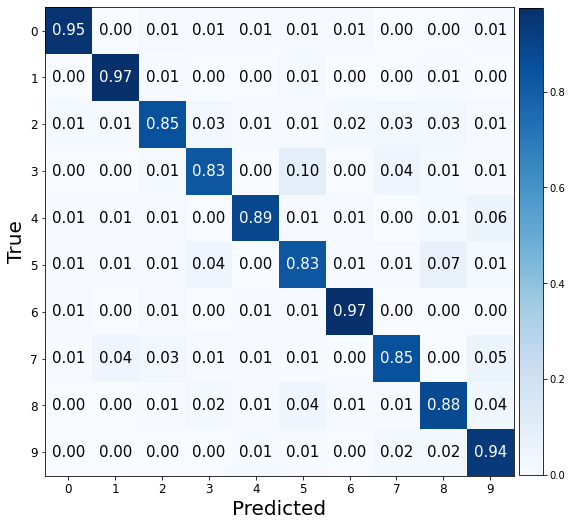

###################

ne: 150, hd:100, wd:0.1, lr: 0.01, bs:720 
Valid Evaluation loss: 0.27399882674217224. f1:0.9218401606593197 acc: 0.921999990940094 


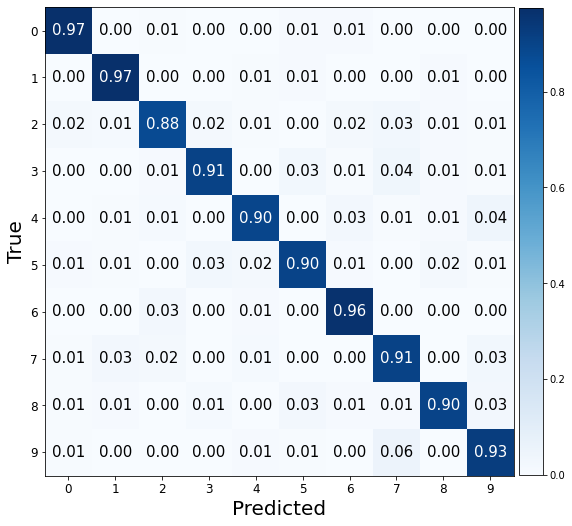

###################

ne: 150, hd:50, wd:0.001, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.7269523739814758. f1:0.7996664721170038 acc: 0.800000011920929 


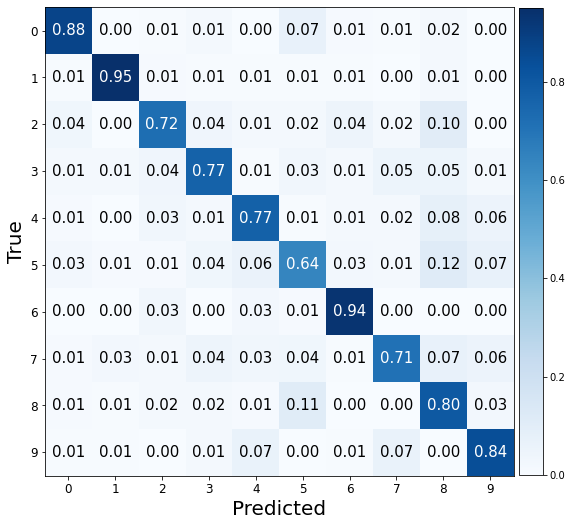

###################

ne: 150, hd:80, wd:0.001, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.6429482102394104. f1:0.8213137979537102 acc: 0.8215000033378601 


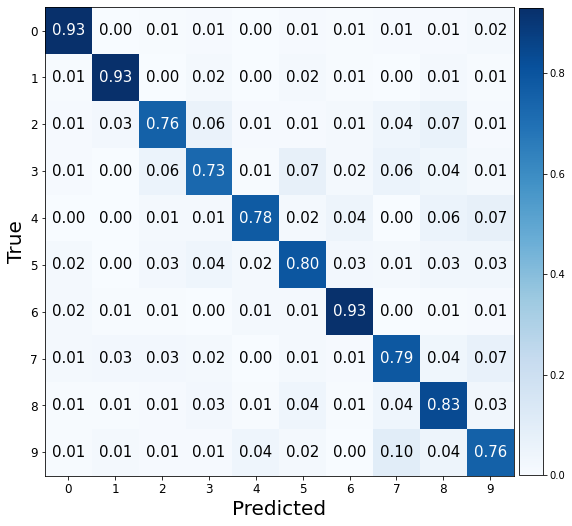

###################

ne: 150, hd:100, wd:0.001, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.6778180599212646. f1:0.8197625768802551 acc: 0.8199999928474426 


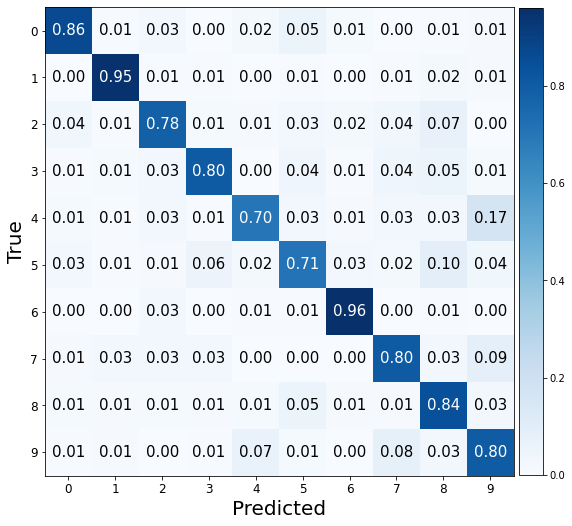

###################

ne: 150, hd:50, wd:0.01, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.7727998495101929. f1:0.7890406176298639 acc: 0.7900000214576721 


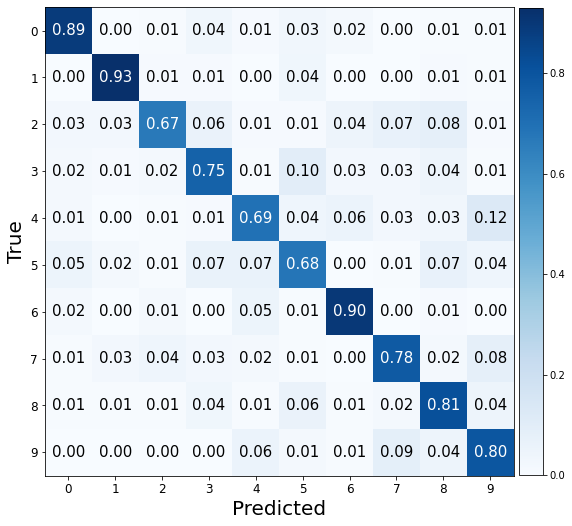

###################

ne: 150, hd:80, wd:0.01, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.6199954152107239. f1:0.8258804939331823 acc: 0.8259999752044678 


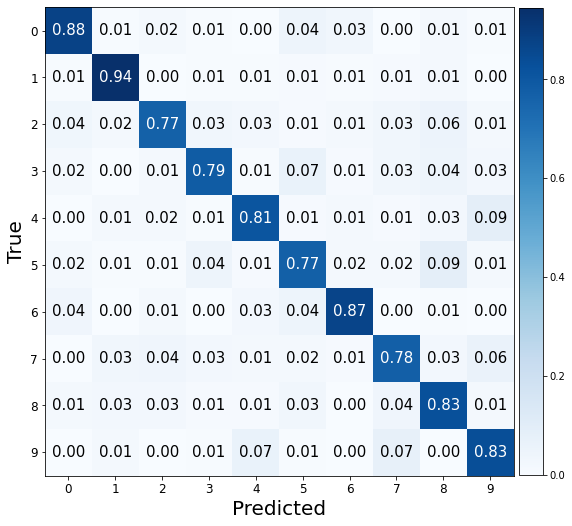

###################

ne: 150, hd:100, wd:0.01, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.5769369006156921. f1:0.8488514721081686 acc: 0.8489999771118164 


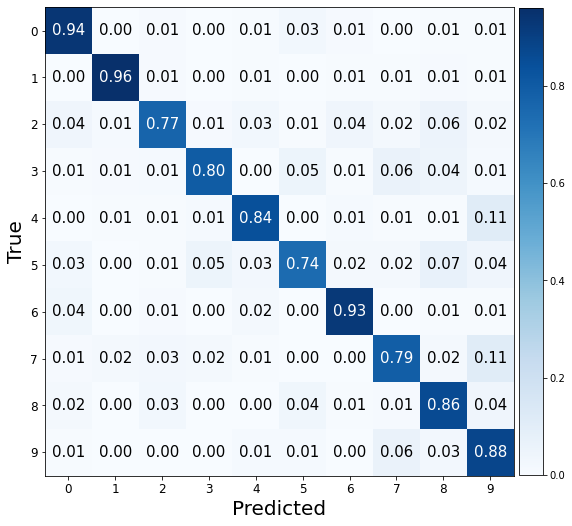

###################

ne: 150, hd:50, wd:0.1, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.6942218542098999. f1:0.7957066072987073 acc: 0.7960000038146973 


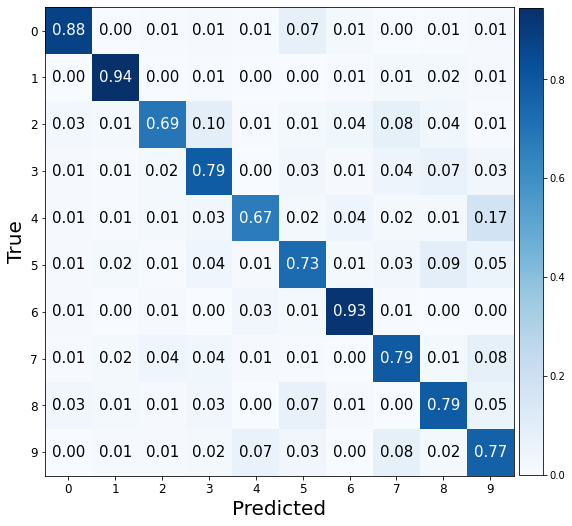

###################

ne: 150, hd:80, wd:0.1, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.7432034015655518. f1:0.8031332814999403 acc: 0.8040000200271606 


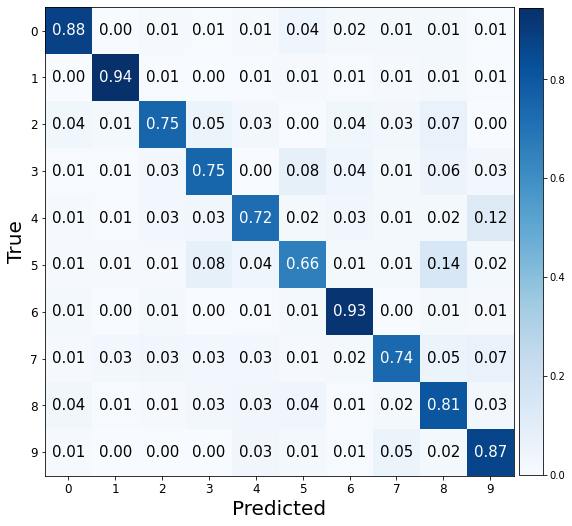

###################

ne: 150, hd:100, wd:0.1, lr: 0.0001, bs:1024 
Valid Evaluation loss: 0.5105081796646118. f1:0.8545014322594018 acc: 0.8550000190734863 


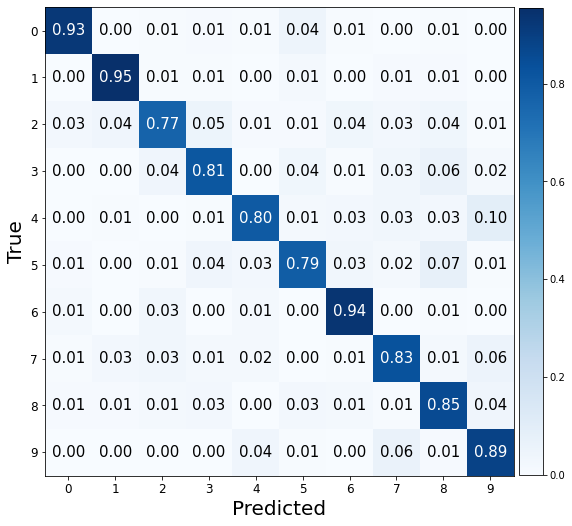

###################

ne: 150, hd:50, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.4166487157344818. f1:0.9040498728198288 acc: 0.9039999842643738 


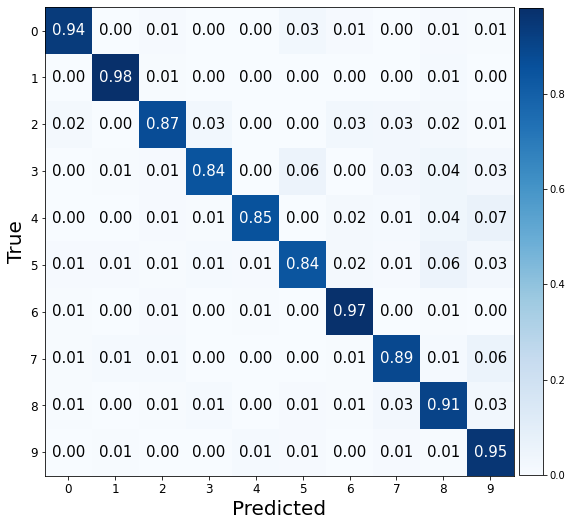

###################

ne: 150, hd:80, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.3791338801383972. f1:0.9104320585296227 acc: 0.9104999899864197 


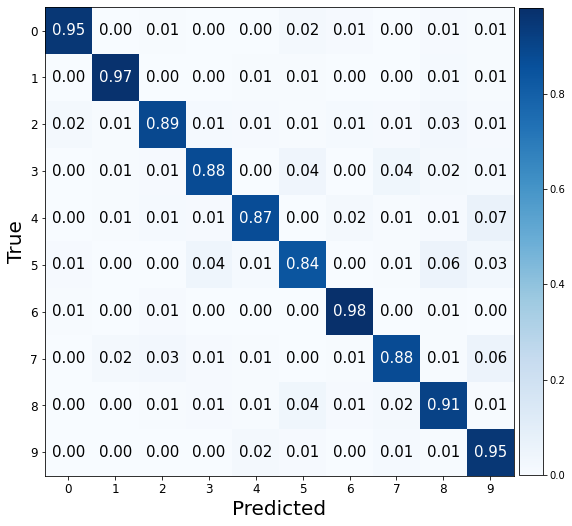

###################

ne: 150, hd:100, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.39202651381492615. f1:0.9134242437203071 acc: 0.9135000109672546 


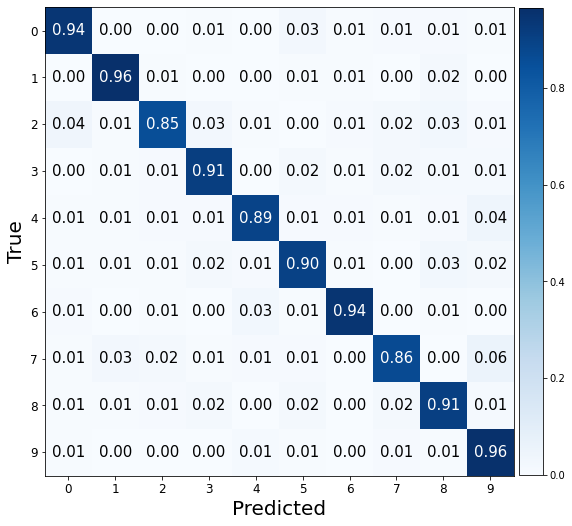

###################

ne: 150, hd:50, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.4037635028362274. f1:0.8901357932979252 acc: 0.890500009059906 


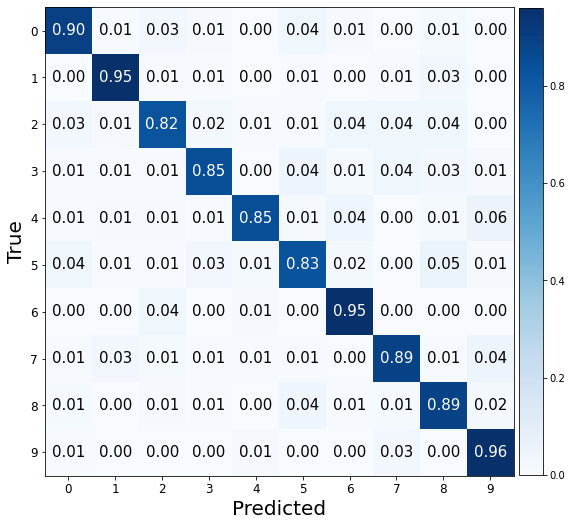

###################

ne: 150, hd:80, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.3317180275917053. f1:0.9146140859613345 acc: 0.9150000214576721 


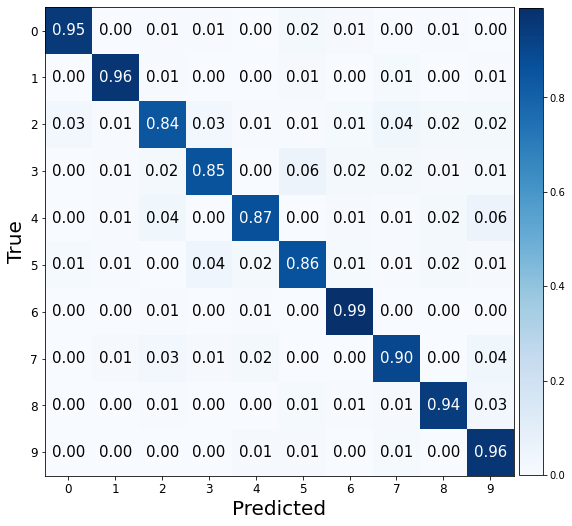

###################

ne: 150, hd:100, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.2952546179294586. f1:0.9213185377542163 acc: 0.921500027179718 


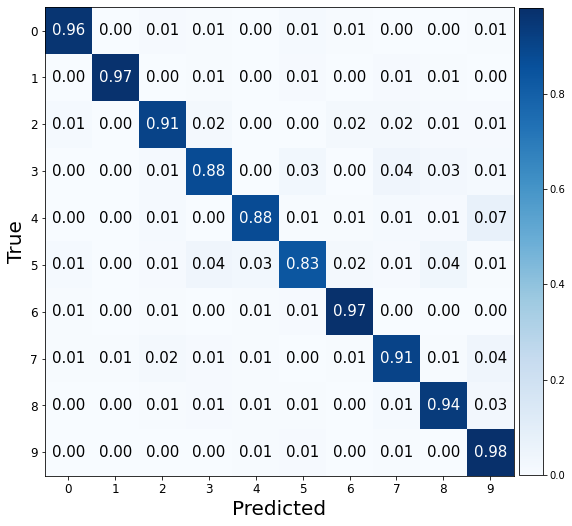

###################

ne: 150, hd:50, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.32660192251205444. f1:0.8998029211703201 acc: 0.8999999761581421 


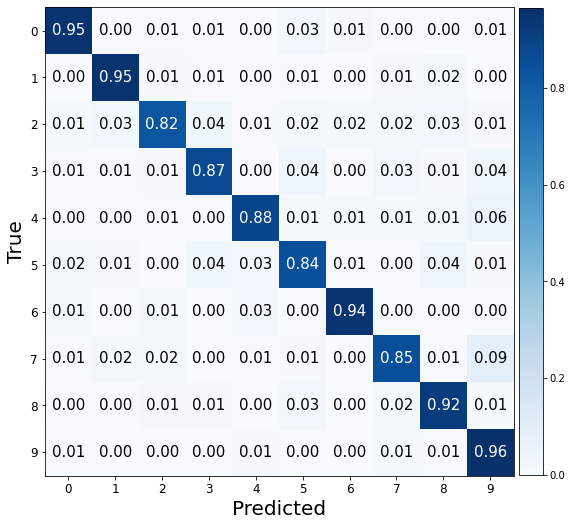

###################

ne: 150, hd:80, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.26859813928604126. f1:0.9167212903053148 acc: 0.9169999957084656 


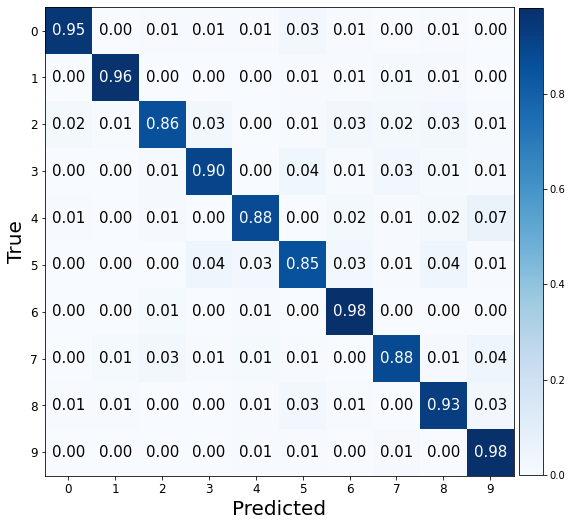

###################

ne: 150, hd:100, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.24230150878429413. f1:0.9238514044931222 acc: 0.9240000247955322 


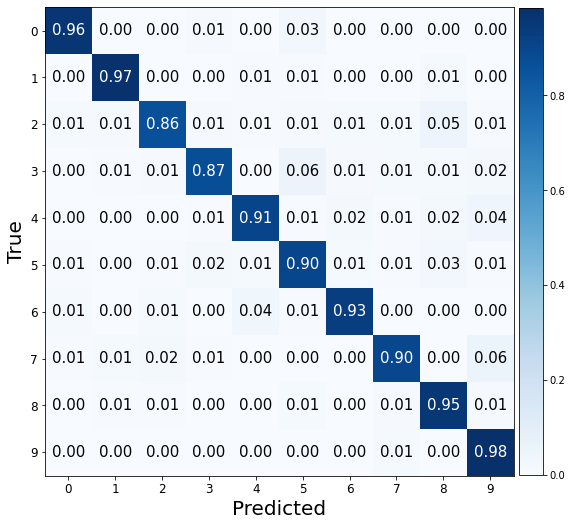

###################

ne: 150, hd:50, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.3005340099334717. f1:0.5723511954286586 acc: 0.6079999804496765 


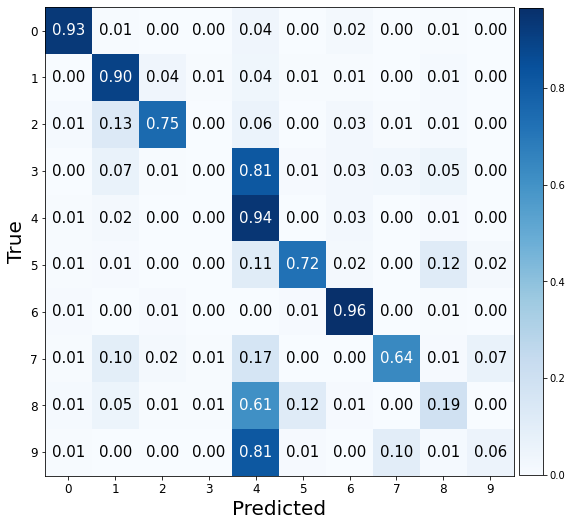

###################

ne: 150, hd:80, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.8144359588623047. f1:0.7679789262466381 acc: 0.7714999914169312 


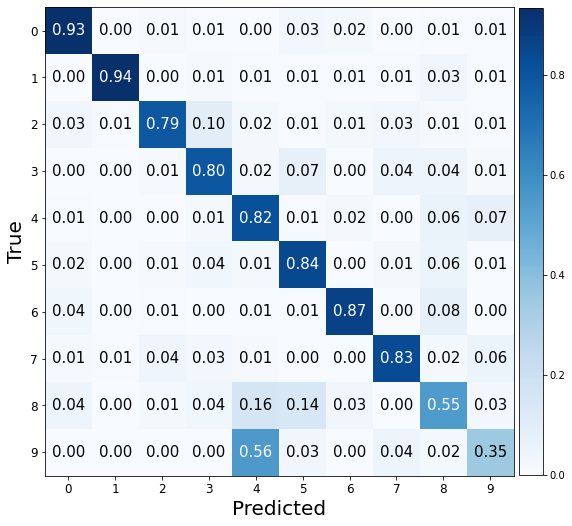

###################

ne: 150, hd:100, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.5252086520195007. f1:0.879473199559231 acc: 0.8794999718666077 


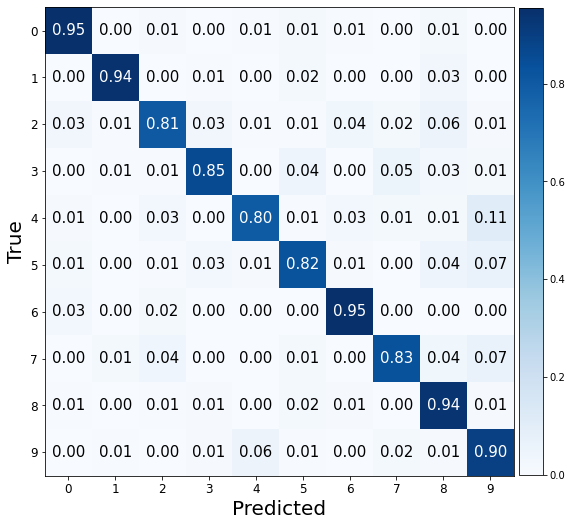

###################

ne: 150, hd:50, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.8880302906036377. f1:0.6520981449526663 acc: 0.6809999942779541 


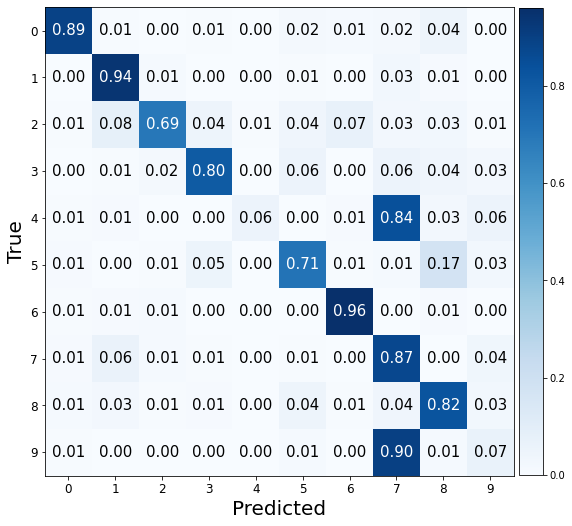

###################

ne: 150, hd:80, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.46731603145599365. f1:0.8840125407692373 acc: 0.8840000033378601 


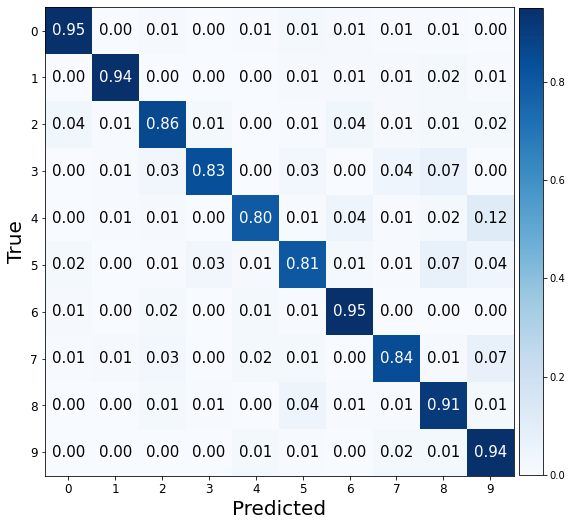

###################

ne: 150, hd:100, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.9824413657188416. f1:0.6592750791406929 acc: 0.6740000247955322 


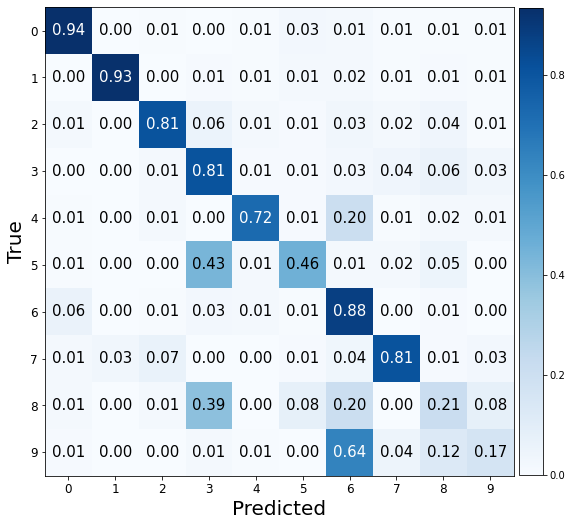

###################

ne: 150, hd:50, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.7788236141204834. f1:0.7949064191650103 acc: 0.7994999885559082 


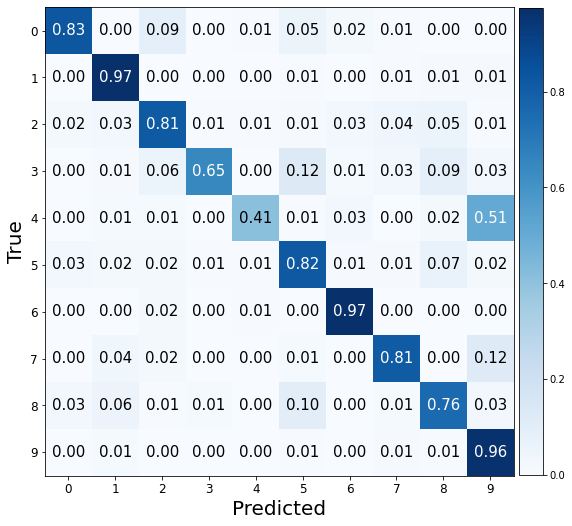

###################

ne: 150, hd:80, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.3143194913864136. f1:0.9012753038161131 acc: 0.9010000228881836 


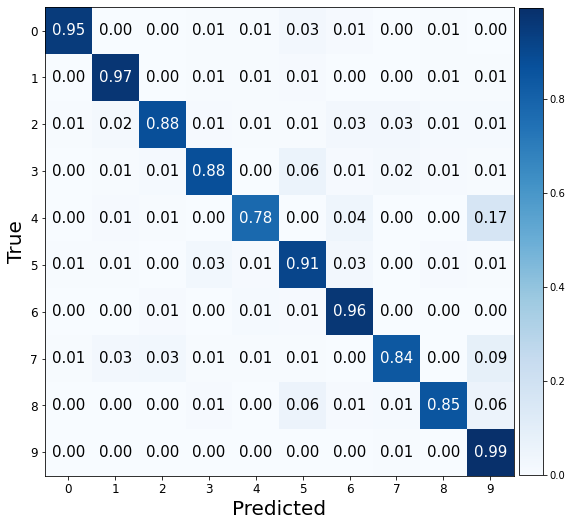

###################

ne: 150, hd:100, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.3173292875289917. f1:0.9030648425630974 acc: 0.9035000205039978 


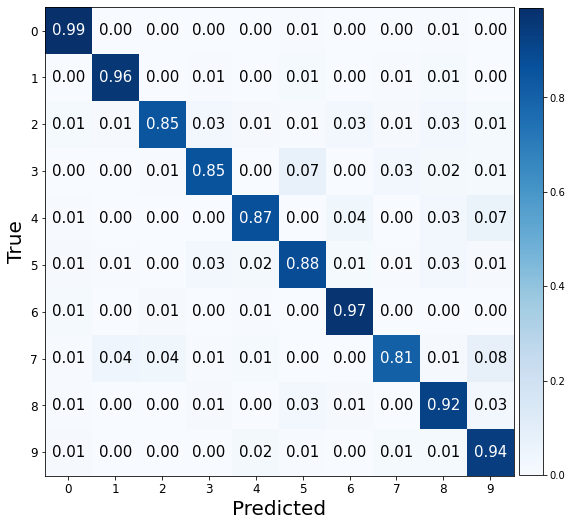

###################



In [13]:
from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset
from tqdm.notebook import tqdm


bs_list = [400,720,1024]
lr_list = [0.0001,0.001,0.01]
wd_list = [0.001,0.01,0.1]
hd_list = [50,80,100]
ne_list = [50,100,150]

pbar = tqdm(total=len(bs_list)*len(lr_list)*len(wd_list)*len(hd_list)*len(ne_list))

for ne in ne_list:
  for bs in bs_list:
    train_ds = TensorDataset(X_train, Y_train)
    train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True)

    for lr in lr_list:
      for wd in wd_list:
        for hd in hd_list:
          input_dim = 28*28
          out_dim = 10
          hidden = hd

          model = torch.nn.Sequential(
            torch.nn.Linear(input_dim, hidden),
            torch.nn.ReLU(),
            torch.nn.Linear(hidden, hidden),
            torch.nn.ReLU(),
            torch.nn.Linear(hidden, out_dim)
          )

          optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
          criterion = torch.nn.CrossEntropyLoss()

          print('ne: {}, hd:{}, wd:{}, lr: {}, bs:{} '.format(ne,hd,wd,lr,bs))
          train_valid(model,ne,optimizer,criterion)
          print('###################\n')

          pbar.update()
pbar.close()

Se puede ver que en la diagonal de la meatriz se encuentran casi la mayoria de los datos. No es muy acertado quedarse con estos sino buscar otros. 